In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
import math

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

# Import demographics

In [3]:
demo = pd.read_csv('dataland_demographics.csv')

In [4]:
demo.sort_values(by='region')

,province,region,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes
0,Amperville,Circuit Confederation,1000000,0.765173,0.084048,0.150780,15
4,Circuiton,Circuit Confederation,500000,0.402774,0.059544,0.537682,10
6,Electropolis,Circuit Confederation,2250000,0.265686,0.229266,0.505048,27
11,Voltagea,Circuit Confederation,750000,0.736797,0.123078,0.140124,12
1,Binaryshire,Metaflux Realm,150000,0.030380,0.927361,0.042259,7
2,Byteforge Domain,Metaflux Realm,650000,0.545108,0.317107,0.137786,12
7,Infinitron Peninsula,Metaflux Realm,200000,0.167412,0.439659,0.392929,7
8,Infoglen,Metaflux Realm,1750000,0.134158,0.295264,0.570578,22
10,Quantumridge,Metaflux Realm,250000,0.530973,0.199361,0.269666,8
3,Cerebrica,Synapse Territories,850000,0.404046,0.529105,0.066849,13


In [5]:
# get a province-region mapping for whenever we need to add it
mapping = demo[['region','province']].copy()
mapping['r-p'] = mapping['region'] + "_" + mapping['province']
map_dict = dict(zip(mapping['province'].tolist(),mapping['r-p'].tolist()))

In [6]:
# create a demographic by region/ nation
demo_e = demo.copy()
demo_e[['python_pop','cobolite_pop','javarian_pop']] = \
    demo[['python_pop_share','cobolite_pop_share','javarian_pop_share']].multiply(demo['population'],axis=0)

demo_r = demo_e.groupby('region')[['python_pop','cobolite_pop','javarian_pop','electoral_college_votes']].sum()
demo_r['population'] = demo_r[['python_pop','cobolite_pop','javarian_pop']].sum(axis=1)
demo_r[['python_pop_share','cobolite_pop_share','javarian_pop_share']] = \
    demo_r[['python_pop','cobolite_pop','javarian_pop']].divide(demo_r['population'],axis=0)
#demo_r = demo_r.reset_index()
demo_r.loc['National'] = demo_r.sum(axis=0)
demo_r.loc['National',['python_pop_share','cobolite_pop_share','javarian_pop_share']] = \
    demo_r.loc['National',['python_pop','cobolite_pop','javarian_pop']]\
        .divide(demo_r.loc['National','population']).tolist()
demo_r = demo_r.reset_index().rename(columns={'region':'geography'})[['geography','population',\
                'python_pop_share','cobolite_pop_share','javarian_pop_share','electoral_college_votes']]

# add back the province data
demo_r = pd.concat([demo_r,demo.rename(columns={'province':'geography'})[['geography','population',\
                'python_pop_share','cobolite_pop_share','javarian_pop_share','electoral_college_votes']]],\
                   axis=0,ignore_index=True)
                    
demo_r

,geography,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes
0,Circuit Confederation,4.500000e+06,0.470434,0.160439,0.369127,64.0
1,Metaflux Realm,3.000000e+06,0.253293,0.333236,0.413471,56.0
2,Synapse Territories,2.500000e+06,0.537016,0.285381,0.177603,40.0
3,National,1.000000e+07,0.421937,0.243514,0.334549,160.0
4,Amperville,1.000000e+06,0.765173,0.084048,0.150780,15.0
5,Binaryshire,1.500000e+05,0.030380,0.927361,0.042259,7.0
6,Byteforge Domain,6.500000e+05,0.545108,0.317107,0.137786,12.0
7,Cerebrica,8.500000e+05,0.404046,0.529105,0.066849,13.0
8,Circuiton,5.000000e+05,0.402774,0.059544,0.537682,10.0
9,Cortexia,1.400000e+06,0.592846,0.170363,0.236791,19.0


# Import Electoral Calendar

In [7]:
cal = pd.read_csv('dataland_electoral_calendar.csv')
cal.iloc[:,1:] = cal.iloc[:,1:].apply(pd.to_datetime)
cal

,election_cycle,election_day,cc_conference_start_date,cc_conference_end_date,dgm_conference_start_date,dgm_conference_end_date,pdal_conference_start_date,pdal_conference_end_date,ssp_conference_start_date,ssp_conference_end_date,debate_date_1,debate_date_2,debate_date_3
0,1984,1984-06-17 00:00:00,1984-04-28 00:00:00,1984-04-30 00:00:00,1984-05-12 00:00:00,1984-05-14 00:00:00,1984-05-05 00:00:00,1984-05-07 00:00:00,1984-04-21 00:00:00,1984-04-23 00:00:00,1984-05-18 00:00:00,1984-05-28 00:00:00,1984-06-07 00:00:00
1,1985,1985-06-16 00:00:00,1985-04-27 00:00:00,1985-04-29 00:00:00,1985-05-11 00:00:00,1985-05-13 00:00:00,1985-05-04 00:00:00,1985-05-06 00:00:00,1985-04-20 00:00:00,1985-04-22 00:00:00,1985-05-17 00:00:00,1985-05-27 00:00:00,1985-06-06 00:00:00
2,1986,1986-06-15 00:00:00,1986-04-26 00:00:00,1986-04-28 00:00:00,1986-05-10 00:00:00,1986-05-12 00:00:00,1986-05-03 00:00:00,1986-05-05 00:00:00,1986-04-19 00:00:00,1986-04-21 00:00:00,1986-05-16 00:00:00,1986-05-26 00:00:00,1986-06-05 00:00:00
3,1987,1987-06-14 00:00:00,1987-04-25 00:00:00,1987-04-27 00:00:00,1987-05-09 00:00:00,1987-05-11 00:00:00,1987-05-02 00:00:00,1987-05-04 00:00:00,1987-04-18 00:00:00,1987-04-20 00:00:00,1987-05-15 00:00:00,1987-05-25 00:00:00,1987-06-04 00:00:00
4,1988,1988-06-19 00:00:00,1988-04-30 00:00:00,1988-05-02 00:00:00,1988-05-14 00:00:00,1988-05-16 00:00:00,1988-05-07 00:00:00,1988-05-09 00:00:00,1988-04-23 00:00:00,1988-04-25 00:00:00,1988-05-20 00:00:00,1988-05-30 00:00:00,1988-06-09 00:00:00
5,1989,1989-06-18 00:00:00,1989-04-29 00:00:00,1989-05-01 00:00:00,1989-05-13 00:00:00,1989-05-15 00:00:00,1989-05-06 00:00:00,1989-05-08 00:00:00,1989-04-22 00:00:00,1989-04-24 00:00:00,1989-05-19 00:00:00,1989-05-29 00:00:00,1989-06-08 00:00:00
6,1990,1990-06-17 00:00:00,1990-04-28 00:00:00,1990-04-30 00:00:00,1990-05-12 00:00:00,1990-05-14 00:00:00,1990-05-05 00:00:00,1990-05-07 00:00:00,1990-04-21 00:00:00,1990-04-23 00:00:00,1990-05-18 00:00:00,1990-05-28 00:00:00,1990-06-07 00:00:00
7,1991,1991-06-16 00:00:00,1991-04-27 00:00:00,1991-04-29 00:00:00,1991-05-11 00:00:00,1991-05-13 00:00:00,1991-05-04 00:00:00,1991-05-06 00:00:00,1991-04-20 00:00:00,1991-04-22 00:00:00,1991-05-17 00:00:00,1991-05-27 00:00:00,1991-06-06 00:00:00
8,1992,1992-06-14 00:00:00,1992-04-25 00:00:00,1992-04-27 00:00:00,1992-05-09 00:00:00,1992-05-11 00:00:00,1992-05-02 00:00:00,1992-05-04 00:00:00,1992-04-18 00:00:00,1992-04-20 00:00:00,1992-05-15 00:00:00,1992-05-25 00:00:00,1992-06-04 00:00:00
9,1993,1993-06-20 00:00:00,1993-05-01 00:00:00,1993-05-03 00:00:00,1993-05-15 00:00:00,1993-05-17 00:00:00,1993-05-08 00:00:00,1993-05-10 00:00:00,1993-04-24 00:00:00,1993-04-26 00:00:00,1993-05-21 00:00:00,1993-05-31 00:00:00,1993-06-10 00:00:00


# Import hist econ

In [8]:
histe = pd.read_csv('dataland_economic_data_1984_2023.csv')

# since we know elections always take place before 6/30, we can assume that only data as of 3/31 is public
# let's filter to a dataset consisting only of those stats, and join to our provincial 
# training vector on a "year" column that just corresponds to the year a 3/31 report was available

histe_q1 = histe[histe['date'].str.contains('03-31')]
histe_q1['year'] = histe['date'].str[:4].astype(int)
histe_q1 = histe_q1[histe_q1['year']>=1984].drop('date',axis=1) # filter to 1984 and later too, for this purpose
histe_q1

/var/folders/ml/n5kh4d890w7_5p7h02wk78vhkfmp_0/T/ipykernel_78059/1316002606.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  histe_q1['year'] = histe['date'].str[:4].astype(int)


,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change,year
16,0.048,0.054,0.035,0.408,1984
20,0.016,0.042,0.134,0.076,1985
24,0.027,0.041,0.130,0.192,1986
28,-0.043,0.042,0.183,0.116,1987
32,0.020,0.055,0.090,-0.164,1988
36,0.037,0.075,0.040,0.011,1989
40,-0.004,0.077,0.070,-0.024,1990
44,-0.019,0.105,0.045,-0.082,1991
48,0.010,0.105,0.008,0.043,1992
52,0.022,0.102,0.010,0.060,1993


# Import hist results

In [9]:
res = pd.read_csv('dataland_election_results_1984_2023.csv')

# expand with demographics
res_e = res.merge(demo,on=['province','region'],how='left')

In [10]:
res_e

,year,province,region,party_in_power,provincial_winner,national_winner,national_pop_vote_winner,cc_share,dgm_share,pdal_share,ssp_share,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes
0,1984,Amperville,Circuit Confederation,pdal,pdal,pdal,pdal,0.047924,0.181743,0.770333,0.000000,1000000,0.765173,0.084048,0.150780,15
1,1984,Binaryshire,Metaflux Realm,pdal,cc,pdal,pdal,0.829564,0.022409,0.148026,0.000000,150000,0.030380,0.927361,0.042259,7
2,1984,Byteforge Domain,Metaflux Realm,pdal,pdal,pdal,pdal,0.438357,0.082160,0.479483,0.000000,650000,0.545108,0.317107,0.137786,12
3,1984,Cerebrica,Synapse Territories,pdal,pdal,pdal,pdal,0.308617,0.274261,0.320309,0.096813,850000,0.404046,0.529105,0.066849,13
4,1984,Circuiton,Circuit Confederation,pdal,dgm,pdal,pdal,0.073943,0.480847,0.445211,0.000000,500000,0.402774,0.059544,0.537682,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,2023,Infinitron Peninsula,Metaflux Realm,pdal,cc,pdal,pdal,0.423952,0.330976,0.245072,0.000000,200000,0.167412,0.439659,0.392929,7
476,2023,Infoglen,Metaflux Realm,pdal,cc,pdal,pdal,0.355367,0.318422,0.326211,0.000000,1750000,0.134158,0.295264,0.570578,22
477,2023,Neuronia,Synapse Territories,pdal,ssp,pdal,pdal,0.034064,0.191491,0.094812,0.679633,250000,0.676468,0.100817,0.222715,8
478,2023,Quantumridge,Metaflux Realm,pdal,pdal,pdal,pdal,0.178276,0.340202,0.481521,0.000000,250000,0.530973,0.199361,0.269666,8


### National share of vote by year

In [11]:
pshares = ['pdal_share','ssp_share','dgm_share','cc_share']

In [12]:
rm = res_e.melt(id_vars=['year','province'],value_vars=pshares)
rm.value.describe()

count    1920.000000
mean        0.250000
std         0.206978
min         0.000000
25%         0.062291
50%         0.251790
75%         0.369217
max         0.917872
Name: value, dtype: float64

In [13]:
res_e.groupby(['region','province'])[pshares].agg(['mean','median']).reset_index()

region              province pdal_share            \
                                                      mean    median   
0   Circuit Confederation            Amperville   0.746724  0.757749   
1   Circuit Confederation             Circuiton   0.438464  0.445337   
2   Circuit Confederation          Electropolis   0.343571  0.352080   
3   Circuit Confederation              Voltagea   0.488454  0.500201   
4          Metaflux Realm           Binaryshire   0.130893  0.131497   
5          Metaflux Realm      Byteforge Domain   0.477844  0.479640   
6          Metaflux Realm  Infinitron Peninsula   0.247518  0.251580   
7          Metaflux Realm              Infoglen   0.332745  0.334895   
8          Metaflux Realm          Quantumridge   0.499070  0.503788   
9     Synapse Territories             Cerebrica   0.315900  0.318094   
10    Synapse Territories              Cortexia   0.317891  0.324537   
11    Synapse Territories              Neuronia   0.120672  0.122693   

   ssp_share           dgm_share            cc_share            
        mean    median      mean    median      mean    median  
0   0.000000  0.000000  0.199129  0.191471  0.054148  0.052196  
1   0.000000  0.000000  0.465230  0.463330  0.096307  0.089547  
2   0.000000  0.000000  0.360602  0.364838  0.295827  0.282394  
3   0.000000  0.000000  0.390906  0.387914  0.120640  0.112292  
4   0.000000  0.000000  0.020745  0.019875  0.848362  0.847387  
5   0.000000  0.000000  0.098269  0.098204  0.423887  0.423149  
6   0.000000  0.000000  0.293902  0.295484  0.458580  0.450526  
7   0.000000  0.000000  0.307457  0.301572  0.359798  0.356693  
8   0.000000  0.000000  0.289255  0.286891  0.211675  0.211956  
9   0.080823  0.078434  0.313569  0.304662  0.289709  0.292532  
10  0.290010  0.290402  0.237027  0.230732  0.155072  0.155653  
11  0.616915  0.621612  0.211237  0.204686  0.051176  0.052902

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Ca

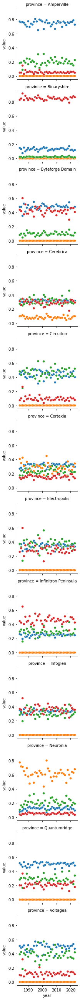

In [41]:
# g = sns.relplot(data=rm, x='year', y='value', hue='variable', kind='line', col='province', facet_kws={'sharey': False})
# g.set_axis_labels("year", "value")
# g.set_titles("Name: {province}")
# g.fig.tight_layout()
# plt.show()

g = sns.FacetGrid(rm, row='province')
g.map_dataframe(sns.scatterplot,x='year',y='value',hue='variable')

### Correlations by ethnic demographics, other than for cobolites, quite weak!

In [1097]:
rmm = res_e.melt(id_vars=['year','province','javarian_pop_share','cobolite_pop_share',\
                                                                 'python_pop_share'],value_vars=pshares)
rmm#.value.describe()

,year,province,javarian_pop_share,cobolite_pop_share,python_pop_share,variable,value
0,1984,Amperville,0.150780,0.084048,0.765173,pdal_share,0.770333
1,1984,Binaryshire,0.042259,0.927361,0.030380,pdal_share,0.148026
2,1984,Byteforge Domain,0.137786,0.317107,0.545108,pdal_share,0.479483
3,1984,Cerebrica,0.066849,0.529105,0.404046,pdal_share,0.320309
4,1984,Circuiton,0.537682,0.059544,0.402774,pdal_share,0.445211
...,...,...,...,...,...,...,...
1915,2023,Infinitron Peninsula,0.392929,0.439659,0.167412,cc_share,0.423952
1916,2023,Infoglen,0.570578,0.295264,0.134158,cc_share,0.355367
1917,2023,Neuronia,0.222715,0.100817,0.676468,cc_share,0.034064
1918,2023,Quantumridge,0.269666,0.199361,0.530973,cc_share,0.178276


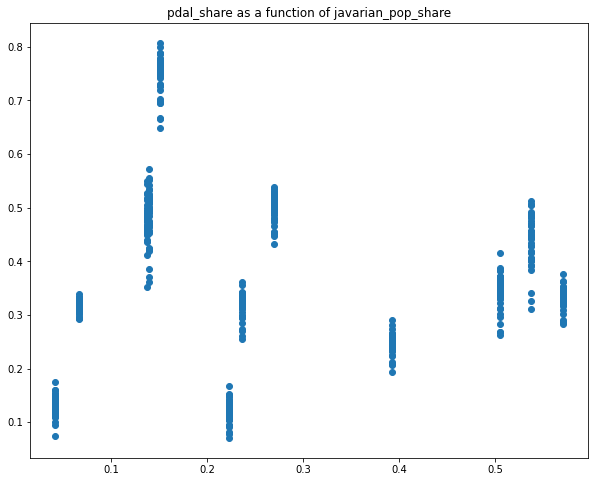

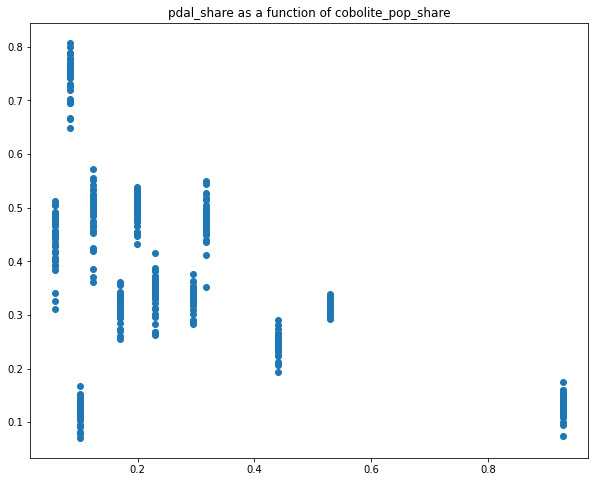

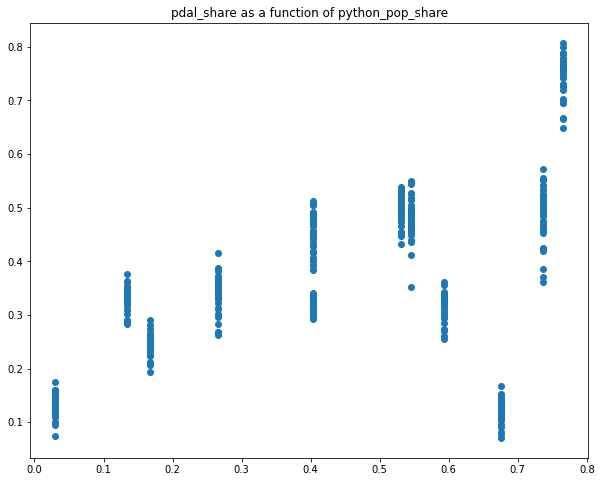

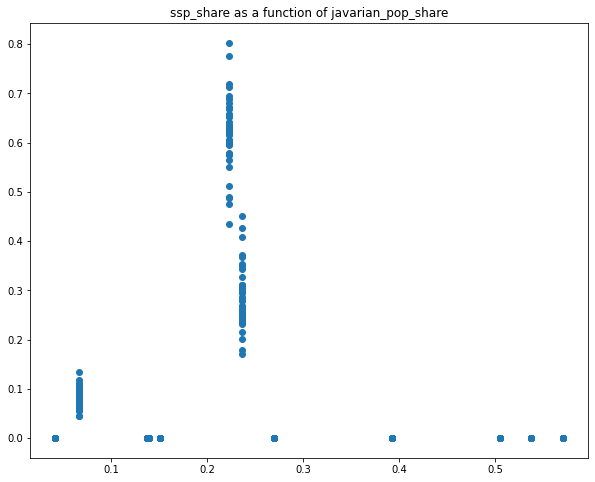

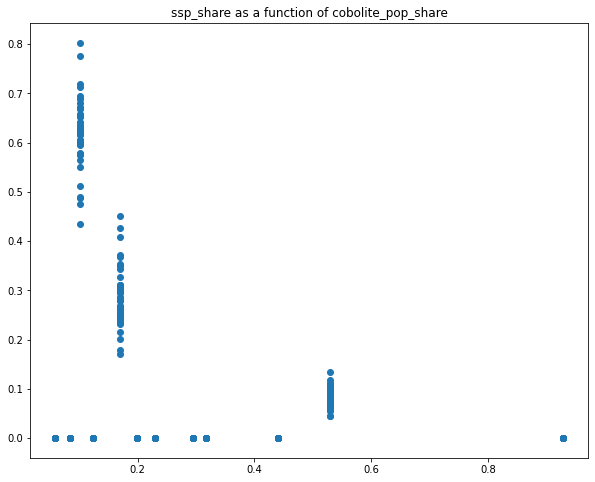

...

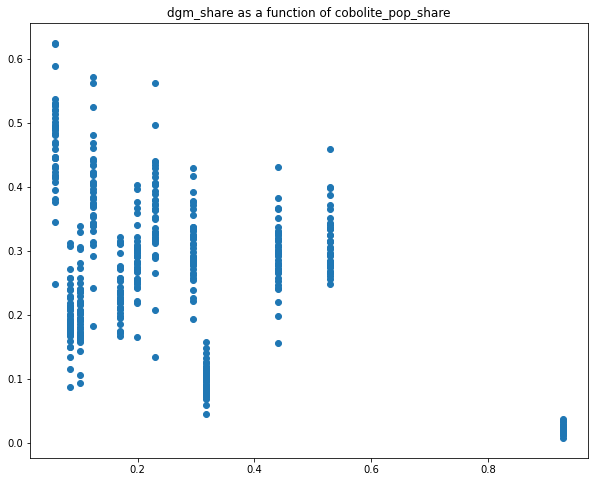

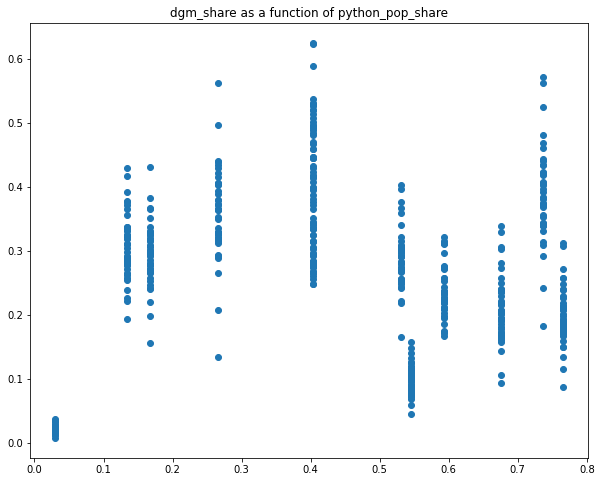

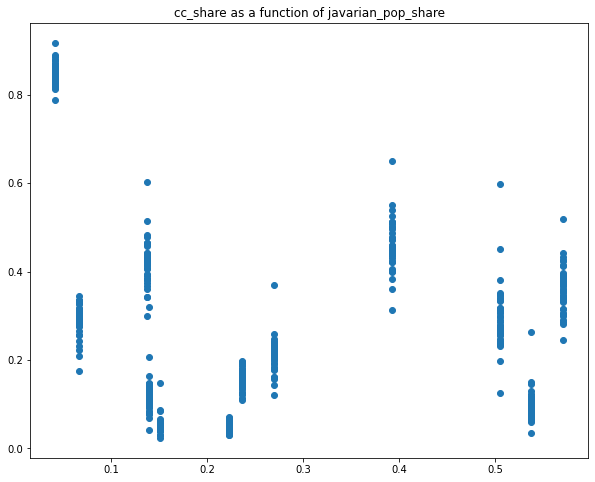

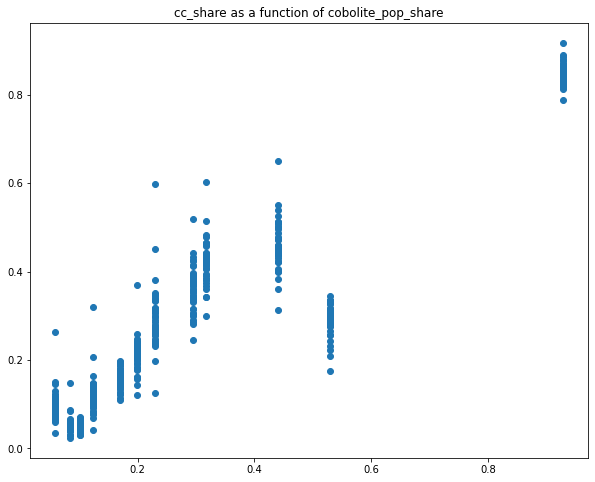

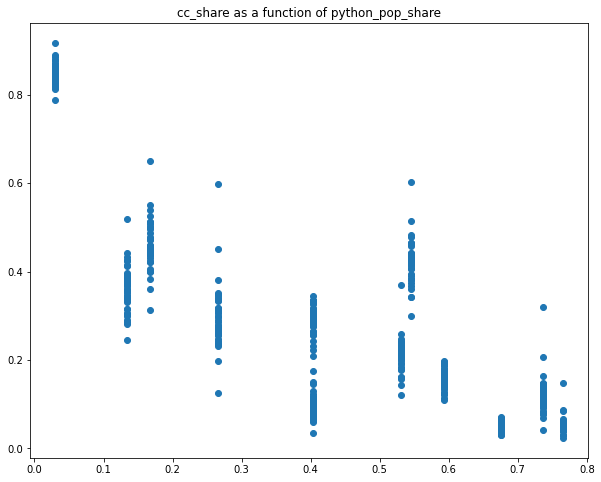

In [1106]:
for i in range(len(pshares)):
    for j in ['javarian_pop_share','cobolite_pop_share','python_pop_share']:
        plt.figure(figsize=(10,8))
        plt.title(f'{pshares[i]} as a function of {j}')
        ax = plt.scatter(y=res_e[pshares[i]],x=res_e[j])
        plt.show()

# Randomly set aside 8 years out of 40 to train and test our models on

In [15]:
import random

setaside = random.choices(res_e.year.unique(),k=8)
setaside

[1989, 2006, 2011, 2017, 1989, 2015, 1984, 1986]

# "Fundamentals" for nationwide

### Import and setup the functions needed

In [16]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import classification_report

from sklearn.linear_model import LogisticRegression

from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [17]:
# disable warnings-- we are getting a lot

import warnings
warnings.filterwarnings('ignore')

In [81]:
# function to help deal with categorical v. numerical inputs
def split_data(df,X_vars_cat,X_vars_num,y_vars):
    X_num = df[X_vars_num]
    if len(X_vars_cat) > 0:
        X_cat = pd.concat([pd.get_dummies(df[X_vars_cat],drop_first=True,dtype=float)],axis=1)
        X = pd.concat([X_cat,X_num],axis=1)
    else:
        X = X_num
    if len(y_vars) > 0:
        y = df[y_vars]
    else:
        y = None
    
    return X, y

def run_mult_rf_model(X,y,weight_col=None):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Extract and normalize weights if weight_col is specified
    weights = None
    if weight_col:
        weights = X_train[weight_col]
        weights = (weights / weights.mean())
        
        # Remove the weights column from X_train and X_test
        X_train = X_train.drop(columns=[weight_col])
        X_test = X_test.drop(columns=[weight_col])

    model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))
    model.fit(X_train, y_train, sample_weight=weights)
    
    y_pred = model.predict(X_test)
    
    # y_pred range gut check
    print(pd.DataFrame(y_pred).sum(axis=1).describe())
    
#     # Scale if specified
#     if scaled==True:
#         y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)
    
    # Evaluation
    mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
    mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)
    
    # 10-fold cross-validation
    scores = cross_val_score(model, X_train, y_train, cv=10)

    print(f"Cross-validated scores: {scores}")
    print(f"Mean CV Score: {scores.mean()}")
    print(f"Standard Deviation of CV Scores: {scores.std()}")
    
    # Retrieve feature importances for each target
    fis = []
    for i, target in enumerate(y.columns):
        importances = model.estimators_[i].feature_importances_
    #     print(f"Feature importances for target {target}:")
        fi = pd.Series(importances,name=target,index=X_train.columns)
        fis.append(fi)
    #     for feat, imp in zip(X.columns, importances):
    #         print(f"{feat}: {imp:.4f}")
    #     print("-" * 30)

    imp_df = pd.concat(fis,axis=1)
    print(imp_df)
    
    return model

def run_softmax(X,y):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Set up the model
    model = LogisticRegression(multi_class="multinomial", solver="lbfgs", C=10, max_iter=10000)

    # Train the model
    model.fit(X_train, y_train)
    
    # Predict "probabilities"
    y_pred = model.predict_proba(X_test)
    
    # y_pred range gut check
    print(pd.DataFrame(y_pred).sum(axis=1).describe())
    
    # Evaluation
    mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
    mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)
    
    # 10-fold cross-validation
    scores = cross_val_score(model, X_train, y_train, cv=10)

    print(f"Cross-validated scores: {scores}")
    print(f"Mean CV Score: {scores.mean()}")
    print(f"Standard Deviation of CV Scores: {scores.std()}")
    
    # Retrieve feature importances for each target
    fis = []
    for i, target in enumerate(y.columns):
        importances = model.estimators_[i].feature_importances_
    #     print(f"Feature importances for target {target}:")
        fi = pd.Series(importances,name=target,index=X.columns)
        fis.append(fi)
    #     for feat, imp in zip(X.columns, importances):
    #         print(f"{feat}: {imp:.4f}")
    #     print("-" * 30)

    imp_df = pd.concat(fis,axis=1)
    print(imp_df)
    
    return X.columns, model

In [19]:
res_ee = res_e.merge(histe_q1,on='year',how='left')

### Try nationwide

In [1629]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share']
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

run_mult_rf_model(*split_data(res_ee,X_vars_cat,X_vars_num,y_vars))

count    144.000000
mean       0.999994
std        0.000180
min        0.999203
25%        1.000000
50%        1.000000
75%        1.000000
max        1.001112
dtype: float64
Mean squared errors: [0.00230467 0.00329244 0.00105705 0.00135675]
Mean absolute errors: [0.02852116 0.04215354 0.0232283  0.01380208]
Cross-validated scores: [0.94795246 0.95571578 0.91807643 0.91680506 0.93875211 0.87036134
 0.92408386 0.94920173 0.94887369 0.92963319]
Mean CV Score: 0.9299455638668487
Standard Deviation of CV Scores: 0.023860568167566733
                               cc_share  dgm_share  pdal_share  ssp_share
province_Binaryshire           0.063925   0.091672    0.025716   0.000000
province_Byteforge Domain      0.000146   0.146780    0.001723   0.000000
province_Cerebrica             0.000306   0.020859    0.001224   0.008871
province_Circuiton             0.000531   0.047160    0.004529   0.000000
province_Cortexia              0.000161   0.019765    0.020808   0.187645
province_Electropolis

MultiOutputRegressor(estimator=RandomForestRegressor(random_state=42))

### Now try nationwide again with economic data

In [1630]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share',\
                  'year_on_year_gdp_pct_change', 'unemployment_rate',\
                   'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change']
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

run_mult_rf_model(*split_data(res_ee,X_vars_cat,X_vars_num,y_vars))

count    144.000000
mean       1.001435
std        0.025029
min        0.925120
25%        0.988976
50%        1.000246
75%        1.013757
max        1.108387
dtype: float64
Mean squared errors: [0.00233877 0.00283556 0.00109985 0.00133375]
Mean absolute errors: [0.03170693 0.03914784 0.02332187 0.01352544]
Cross-validated scores: [0.94761255 0.96663322 0.92436397 0.91778356 0.93873534 0.86199132
 0.90580061 0.96133825 0.95249756 0.92659711]
Mean CV Score: 0.9303353475696691
Standard Deviation of CV Scores: 0.029358097202336227
                                   cc_share  dgm_share  pdal_share  ssp_share
province_Binaryshire               0.082751   0.064688    0.018166   0.000000
province_Byteforge Domain          0.000216   0.126204    0.002266   0.000000
province_Cerebrica                 0.000142   0.022102    0.000993   0.006969
province_Circuiton                 0.000721   0.038613    0.005904   0.000000
province_Cortexia                  0.000217   0.016983    0.022775   0.1842

MultiOutputRegressor(estimator=RandomForestRegressor(random_state=42))

### Now try the economic vector, but run a model for every province

In [742]:
X_vars_cat = ['party_in_power']

for province in demo.province.unique():
    print(province)
    run_mult_rf_model(res_ee[res_ee['province']==province],X_vars_cat,X_vars_num,y_vars)
    print("_______")

Amperville
Mean squared errors: [0.00020622 0.001834   0.00137432 0.        ]
                                   cc_share  dgm_share  pdal_share  ssp_share
party_in_power_dgm                 0.021156   0.078901    0.037715        0.0
party_in_power_pdal                0.033727   0.034340    0.056895        0.0
python_pop_share                   0.000000   0.000000    0.000000        0.0
cobolite_pop_share                 0.000000   0.000000    0.000000        0.0
javarian_pop_share                 0.000000   0.000000    0.000000        0.0
year_on_year_gdp_pct_change        0.217707   0.307333    0.338545        0.0
unemployment_rate                  0.113977   0.120888    0.181931        0.0
year_on_year_inflation             0.362611   0.260297    0.157188        0.0
year_on_year_stock_mkt_pct_change  0.250822   0.198241    0.227725        0.0
_______
Binaryshire
Mean squared errors: [3.17765157e-04 1.98397758e-05 2.14688598e-04 0.00000000e+00]
                                   cc_s

Mean squared errors: [0.00091362 0.00484567 0.00238016 0.        ]
                                   cc_share  dgm_share  pdal_share  ssp_share
party_in_power_dgm                 0.032568   0.072142    0.024390        0.0
party_in_power_pdal                0.061737   0.055010    0.054308        0.0
python_pop_share                   0.000000   0.000000    0.000000        0.0
cobolite_pop_share                 0.000000   0.000000    0.000000        0.0
javarian_pop_share                 0.000000   0.000000    0.000000        0.0
year_on_year_gdp_pct_change        0.130640   0.257905    0.327836        0.0
unemployment_rate                  0.108512   0.135895    0.224484        0.0
year_on_year_inflation             0.354828   0.227286    0.086221        0.0
year_on_year_stock_mkt_pct_change  0.311716   0.251761    0.282761        0.0
_______


# Now train and try National on withheld data

In [20]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share',\
                  'year_on_year_gdp_pct_change', 'unemployment_rate',\
                   'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change'
             ]
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

# subset for target-only
sub = res_ee.copy()

X, y = split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tmodel = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))
tmodel.fit(X_train, y_train)

y_pred = tmodel.predict(X_test)

# y_pred range gut check
y_pred = pd.DataFrame(y_pred)
y_pred.columns = [col + "_pred" for col in y_test.columns]
y_pred.index = y_test.index
print(y_pred.sum(axis=1).describe())

# Scale as specified
y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
print("Mean squared errors for y_test:",mse)
print("Mean absolute errors for y_test:",mae)

# 10-fold cross-validation
scores = cross_val_score(tmodel, X_train, y_train, cv=10)

print(f"Cross-validated scores: {scores}")
print(f"Mean CV Score: {scores.mean()}")
print(f"Standard Deviation of CV Scores: {scores.std()}")

# Retrieve feature importances for each target
fis = []
for i, target in enumerate(y.columns):
    importances = tmodel.estimators_[i].feature_importances_
#     print(f"Feature importances for target {target}:")
    fi = pd.Series(importances,name=target,index=X_train.columns)
    fis.append(fi)
#     for feat, imp in zip(X.columns, importances):
#         print(f"{feat}: {imp:.4f}")
#     print("-" * 30)

imp_df = pd.concat(fis,axis=1)
print(imp_df)

# Concatenate the two dataframes side-by-side
fund_comparison_df = pd.concat([y_test, y_pred], axis=1)
fund_comparison_df = \
    fund_comparison_df.merge(res_ee[['year','province']],left_index=True,right_index=True,how='left')

fund_mse_results = []
fund_mae_results = []
for name, group in fund_comparison_df.groupby('province'):
    true_vals = group[pshares]
    preds = group[[col + "_pred" for col in pshares]]
    mse = mean_squared_error(true_vals, preds, multioutput='raw_values')
    mae = mean_absolute_error(true_vals, preds, multioutput='raw_values')
    mse_result = {}
    mae_result = {}
    mse_result['province'] = name
    mae_result['province'] = name
    mse_res_dict = dict(zip(pshares,mse))
    mae_res_dict = dict(zip(pshares,mae))
    mse_result.update(mse_res_dict)
    mae_result.update(mae_res_dict)
    fund_mse_results.append(mse_result)
    fund_mae_results.append(mae_result)
    
fund_prov_mse = pd.DataFrame(fund_mse_results)
fund_prov_mae = pd.DataFrame(fund_mae_results)

count    119.000000
mean       1.001446
std        0.020673
min        0.954035
25%        0.989751
50%        1.000924
75%        1.010372
max        1.062412
dtype: float64
Mean squared errors for y_test: [0.00084561 0.00211744 0.00086385 0.00116939]
Mean absolute errors for y_test: [0.02267825 0.03227607 0.0208262  0.01400665]
Cross-validated scores: [0.96207234 0.90826304 0.96569452 0.90581058 0.9460398  0.93840977
 0.94853974 0.94657325 0.94209613 0.95102847]
Mean CV Score: 0.9414527649555353
Standard Deviation of CV Scores: 0.018930414555880255
                                   cc_share  dgm_share  pdal_share  ssp_share
province_Binaryshire               0.173430   0.042967    0.027281   0.000000
province_Byteforge Domain          0.000190   0.096299    0.000920   0.000000
province_Cerebrica                 0.000491   0.026620    0.000664   0.006112
province_Circuiton                 0.000771   0.045842    0.004553   0.000000
province_Cortexia                  0.000319   0.00830

In [1664]:
# itr = 2

a, b = split_data(res_ee[res_ee['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)
# pad a with columns that may have been missed when getting dummies
missing = [col for col in allcols if col not in a.columns]
a['party_in_power_dgm'] = np.where(res_ee[res_ee['year'].isin(setaside)]['party_in_power'].iloc[0]=='dgm',1,0)
a['party_in_power_pdal'] = np.where(res_ee[res_ee['year'].isin(setaside)]['party_in_power'].iloc[0]=='pdal',1,0)
wy = pd.DataFrame(tmodel.predict(a))
wy.index = b.index
wy.columns = [col + "_pred" for col in b.columns]
    
# Evaluation
mse = mean_squared_error(b, wy, multioutput='raw_values')
print(mse)
mae = mean_absolute_error(b, wy, multioutput='raw_values')
print(mae)

# Concatenate the two dataframes side-by-side
fund_comparison_df = pd.concat([b, wy], axis=1)
fund_comparison_df = \
    fund_comparison_df.merge(res_ee[['year','province']],left_index=True,right_index=True,how='left')

fund_mse_results = []
fund_mae_results = []
for name, group in fund_comparison_df.groupby('province'):
    true_vals = group[pshares]
    preds = group[[col + "_pred" for col in pshares]]
    mse = mean_squared_error(true_vals, preds, multioutput='raw_values')
    mae = mean_absolute_error(true_vals, preds, multioutput='raw_values')
    mse_result = {}
    mae_result = {}
    mse_result['province'] = name
    mae_result['province'] = name
    mse_res_dict = dict(zip(pshares,mse))
    mae_res_dict = dict(zip(pshares,mae))
    mse_result.update(mse_res_dict)
    mae_result.update(mae_res_dict)
    fund_mse_results.append(mse_result)
    fund_mae_results.append(mae_result)
    
fund_prov_mse = pd.DataFrame(fund_mse_results)
fund_prov_mae = pd.DataFrame(fund_mae_results)

[0.00237993 0.00425596 0.00176708 0.00096518]
[0.03485428 0.04775086 0.03205354 0.01193964]


In [1666]:
fund_comparison_df[[col for col in fund_comparison_df.columns if "_pred" in col]].sum(axis=1)

36     1.020514
37     1.007605
38     1.009975
39     0.998273
40     0.973003
41     1.056201
42     1.009922
43     1.034979
44     1.048185
45     1.111475
46     1.077411
47     1.061531
60     0.997357
61     1.001598
62     0.995871
63     1.003517
64     0.999310
65     0.993637
66     0.981948
67     0.966211
68     0.978826
69     0.993777
70     0.986598
71     0.989509
84     0.998114
85     0.999239
86     0.976765
87     1.008941
88     0.993420
89     1.040142
90     1.026363
91     1.026928
92     1.030552
93     1.069676
94     1.019779
95     1.044683
156    1.008929
157    1.002447
158    0.987206
159    1.024866
160    0.997940
161    1.008751
162    0.989409
163    1.010348
164    0.986692
165    1.007805
166    0.999497
167    0.996507
168    1.005833
169    0.998412
170    0.995385
171    1.008241
172    0.996043
173    1.002496
174    0.996094
175    0.992276
176    0.977244
177    1.002137
178    0.982920
179    1.009649
192    1.008289
193    0.998202
194    1

In [1667]:
fund_prov_mae

,province,pdal_share,ssp_share,dgm_share,cc_share
0,Amperville,0.050511,0.000000,0.056829,0.014436
1,Binaryshire,0.014652,0.000000,0.004230,0.015715
2,Byteforge Domain,0.032922,0.000000,0.018303,0.047869
3,Cerebrica,0.016132,0.017268,0.023859,0.015164
4,Circuiton,0.049593,0.000000,0.078622,0.038020
5,Cortexia,0.028138,0.060454,0.025468,0.010440
6,Electropolis,0.037508,0.000000,0.098997,0.069329
7,Infinitron Peninsula,0.024234,0.000000,0.046276,0.054558
8,Infoglen,0.027142,0.000000,0.057523,0.069955
9,Neuronia,0.017661,0.065554,0.044601,0.006815


### Yikes-- try the softmax model instead

In [1225]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share',\
                  'year_on_year_gdp_pct_change', 'unemployment_rate',\
                   'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change']
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

tmodel = run_softmax(*split_data(res_ee[~res_ee['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars))

ValueError: y should be a 1d array, got an array of shape (268, 4) instead.

### Double-yikes-- softmax wants a 1d array of y data. Try Sequential with Categorical - CrossEntropy Loss

In [ ]:
import numpy as np
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical

In [1660]:
def run_nn_model(X,y,weight_col=None,scaled=False):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Extract and normalize weights if weight_col is specified
    weights = None
    if weight_col:
        weights = X_train[weight_col]
        weights = (weights / weights.mean())
        
        # Remove the weights column from X_train and X_test
        X_train = X_train.drop(columns=[weight_col])
        X_test = X_test.drop(columns=[weight_col])
    
    # Define the model
    model = Sequential()
    model.add(Dense(10, input_dim=len(X_train.columns), activation='relu')) # Input layer and 1 hidden layer with 10 neurons
    model.add(Dense(4, activation='softmax')) # Output layer

    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Train the model
    model.fit(X_train, y_train, epochs=50, batch_size=10, sample_weight=weights)

    # Predict
    predictions = model.predict(X_test)
    
    y_pred = pd.DataFrame(predictions)
    y_pred.columns = [col + "_pred" for col in y_test.columns]
    y_pred.index = y_test.index

    # y_pred range gut check
    print("Describe range of y_pred sums",pd.DataFrame(y_pred).sum(axis=1).describe())
    
#     # Scale if specified
#     if scaled==True:
#         y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)

    # Evaluation
    mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
    mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)

    # Concatenate the two dataframes side-by-side
    comparison_df = pd.concat([y_test, y_pred], axis=1)
#     comparison_df = comparison_df.merge(df[['year','province']],left_index=True,right_index=True,\
#                          how='left')
    print(comparison_df)
    return model

In [1661]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share',\
                  'year_on_year_gdp_pct_change', 'unemployment_rate',\
                   'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change']
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

n = run_nn_model(*split_data(res_ee[~res_ee['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars))


Epoch 1/50
31/31 [==============================] - 0s 536us/step - loss: 1.3492 - accuracy: 0.4463
Epoch 2/50
31/31 [==============================] - 0s 458us/step - loss: 1.3102 - accuracy: 0.5016
Epoch 3/50
31/31 [==============================] - 0s 655us/step - loss: 1.2788 - accuracy: 0.5114
Epoch 4/50
31/31 [==============================] - 0s 501us/step - loss: 1.2511 - accuracy: 0.5635
Epoch 5/50
31/31 [==============================] - 0s 435us/step - loss: 1.2225 - accuracy: 0.5733
Epoch 6/50
31/31 [==============================] - 0s 438us/step - loss: 1.1934 - accuracy: 0.5765
Epoch 7/50
31/31 [==============================] - 0s 539us/step - loss: 1.1635 - accuracy: 0.5896
Epoch 8/50
31/31 [==============================] - 0s 475us/step - loss: 1.1369 - accuracy: 0.5831
Epoch 9/50
31/31 [==============================] - 0s 436us/step - loss: 1.1137 - accuracy: 0.5993
Epoch 10/50
31/31 [==============================] - 0s 500us/step - loss: 1.0936 - accuracy: 0.6547

In [ ]:
# comparison_df.groupby('province')[[col for col in comparison_df.iloc[:,:8]]]

In [1623]:
### Now predict the withheld data!

sa, sb = split_data(res_ee[res_ee['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

#X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

# Predict
predictions_s = n.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

# Evaluation
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
print("Mean squared errors:",mse)
print("Mean absolute errors:",mae)

# Concatenate the two dataframes side-by-side
comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
comparison_df_s

3/3 [==============================] - 0s 865us/step
count    9.600000e+01
mean     1.000000e+00
std      6.586388e-08
min      9.999999e-01
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
dtype: float64
Mean squared errors: [0.00322718 0.00336098 0.00211976 0.00111492]
Mean absolute errors: [0.04057903 0.04372547 0.0359446  0.01441866]


,cc_share,dgm_share,pdal_share,ssp_share,cc_share_pred,dgm_share_pred,pdal_share_pred,ssp_share_pred
36,0.030492,0.214624,0.754884,0.000000,0.128359,0.213551,0.649931,0.008158
37,0.826204,0.020149,0.153647,0.000000,0.875007,0.019625,0.104393,0.000975
38,0.374280,0.100622,0.525098,0.000000,0.521452,0.091198,0.386050,0.001299
39,0.302449,0.267861,0.333360,0.096330,0.361115,0.253708,0.262881,0.122296
40,0.060603,0.494851,0.444546,0.000000,0.126969,0.439635,0.431163,0.002233
41,0.142579,0.222684,0.324748,0.309990,0.192827,0.182751,0.262022,0.362399
42,0.197669,0.421324,0.381007,0.000000,0.385847,0.290582,0.317607,0.005964
43,0.401760,0.317347,0.280894,0.000000,0.571757,0.231438,0.194522,0.002283
44,0.314780,0.322414,0.362806,0.000000,0.424841,0.293758,0.279622,0.001778
45,0.046960,0.181189,0.119733,0.652117,0.071570,0.154080,0.107282,0.667068


In [1662]:
comparison_df_s.merge(res_ee[res_ee['year'].isin(setaside)][['year','province']]\
    ,left_index=True,right_index=True,how='left')

,cc_share,dgm_share,pdal_share,ssp_share,cc_share_pred,dgm_share_pred,pdal_share_pred,ssp_share_pred,year,province
36,0.030492,0.214624,0.754884,0.000000,0.128359,0.213551,0.649931,0.008158,1987,Amperville
37,0.826204,0.020149,0.153647,0.000000,0.875007,0.019625,0.104393,0.000975,1987,Binaryshire
38,0.374280,0.100622,0.525098,0.000000,0.521452,0.091198,0.386050,0.001299,1987,Byteforge Domain
39,0.302449,0.267861,0.333360,0.096330,0.361115,0.253708,0.262881,0.122296,1987,Cerebrica
40,0.060603,0.494851,0.444546,0.000000,0.126969,0.439635,0.431163,0.002233,1987,Circuiton
41,0.142579,0.222684,0.324748,0.309990,0.192827,0.182751,0.262022,0.362399,1987,Cortexia
42,0.197669,0.421324,0.381007,0.000000,0.385847,0.290582,0.317607,0.005964,1987,Electropolis
43,0.401760,0.317347,0.280894,0.000000,0.571757,0.231438,0.194522,0.002283,1987,Infinitron Peninsula
44,0.314780,0.322414,0.362806,0.000000,0.424841,0.293758,0.279622,0.001778,1987,Infoglen
45,0.046960,0.181189,0.119733,0.652117,0.071570,0.154080,0.107282,0.667068,1987,Neuronia


# Correlation matrix - compute partywise

In [139]:
m= res_ee.pivot(index='year',columns=['region','province'],values='pdal_share')
m.columns = m.columns.map("_".join)
m

,Circuit Confederation_Amperville,Metaflux Realm_Binaryshire,Metaflux Realm_Byteforge Domain,Synapse Territories_Cerebrica,Circuit Confederation_Circuiton,Synapse Territories_Cortexia,Circuit Confederation_Electropolis,Metaflux Realm_Infinitron Peninsula,Metaflux Realm_Infoglen,Synapse Territories_Neuronia,Metaflux Realm_Quantumridge,Circuit Confederation_Voltagea
year,,,,,,,,,,,,
1984,0.770333,0.148026,0.479483,0.320309,0.445211,0.270709,0.367395,0.260081,0.347873,0.078219,0.514913,0.508958
1985,0.760330,0.132230,0.479976,0.304244,0.465755,0.284877,0.365555,0.252532,0.333708,0.082343,0.494520,0.483890
1986,0.763452,0.074638,0.352349,0.295379,0.488221,0.254723,0.268882,0.193102,0.287545,0.093760,0.465051,0.496667
1987,0.754884,0.153647,0.525098,0.333360,0.444546,0.324748,0.381007,0.280894,0.362806,0.119733,0.529413,0.517159
1988,0.726330,0.100548,0.412549,0.304473,0.402203,0.319600,0.295586,0.223473,0.309918,0.117504,0.472341,0.452295
1989,0.699525,0.122568,0.467681,0.293045,0.383210,0.272936,0.300909,0.225339,0.300926,0.090664,0.450366,0.422564
1990,0.774981,0.147984,0.505763,0.319901,0.456415,0.337147,0.357876,0.251942,0.330934,0.137586,0.503201,0.519460
1991,0.694417,0.121976,0.448520,0.293943,0.406410,0.331399,0.283484,0.206050,0.291259,0.150990,0.454556,0.419686
1992,0.740990,0.132813,0.465986,0.308683,0.406983,0.335342,0.322349,0.236981,0.320712,0.126866,0.486838,0.466968


In [153]:
def partywise_corr(df,col):
    sub = df.pivot(index='year', columns=['region','province'], values=col)
    sub.columns = sub.columns.map("_".join)
    sub_corr = sub.corr().sort_index(axis=0).sort_index(axis=1)

    plt.figure(figsize=(15, 10))
    sns.heatmap(sub_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f"Correlations in Outcomes Across Provinces for {col}")
    plt.show()
    # return sub, sub_corr

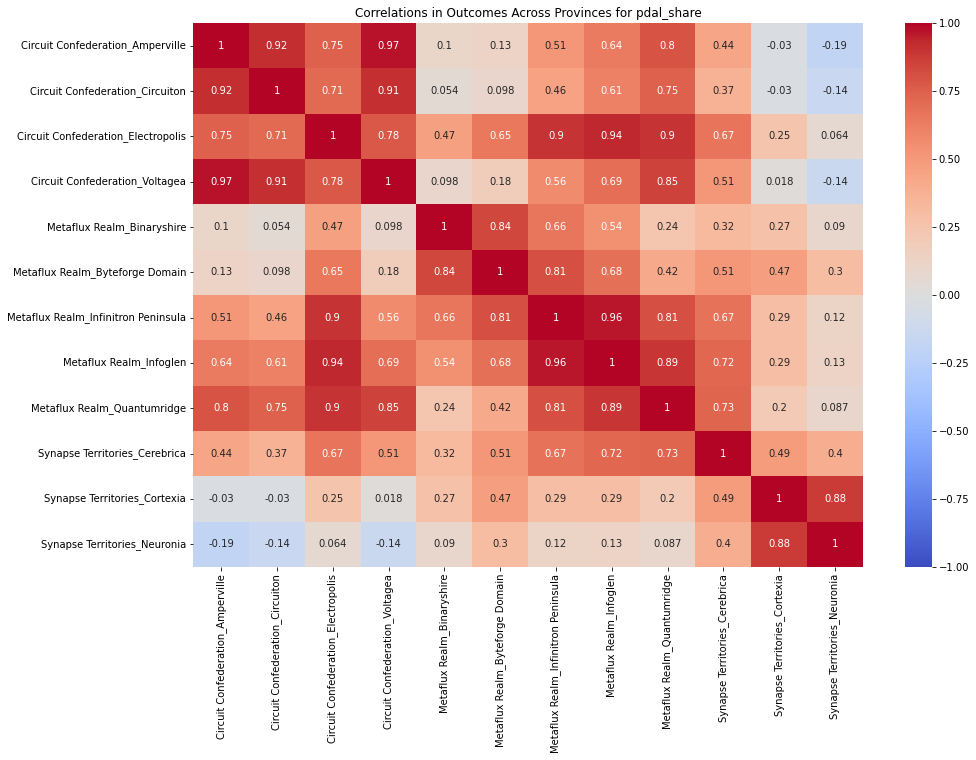

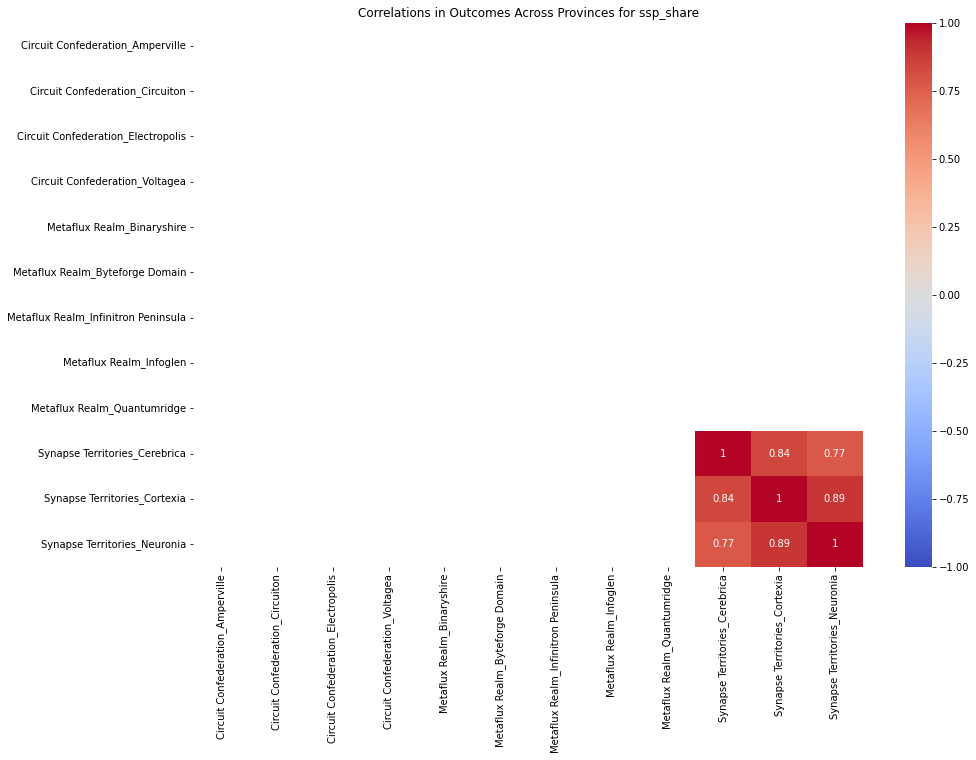

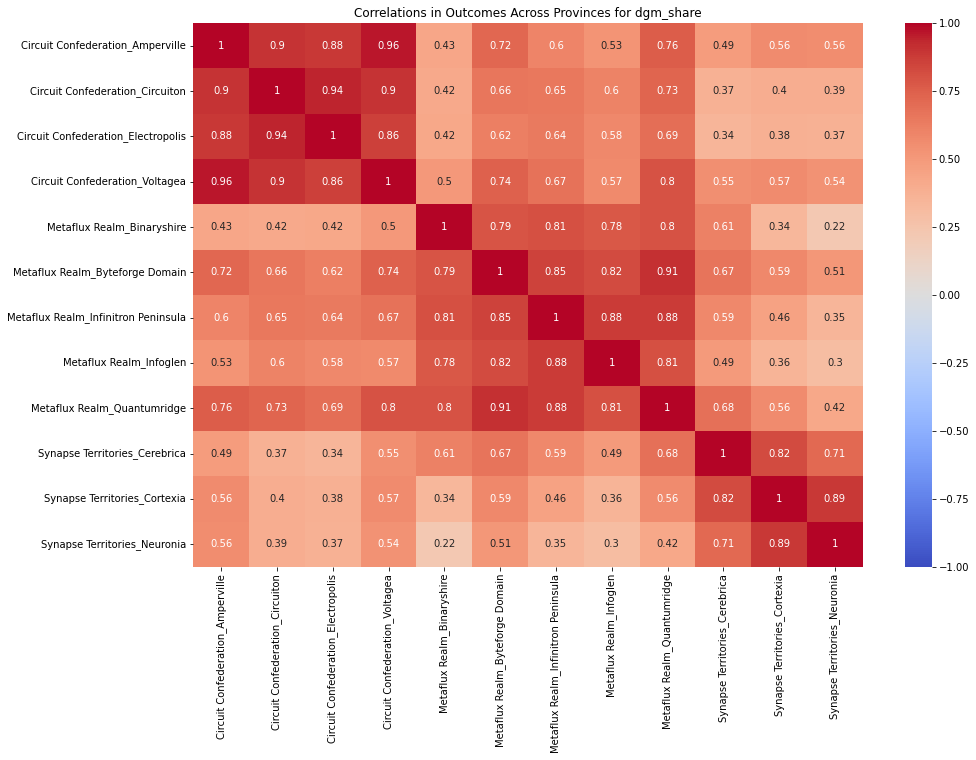

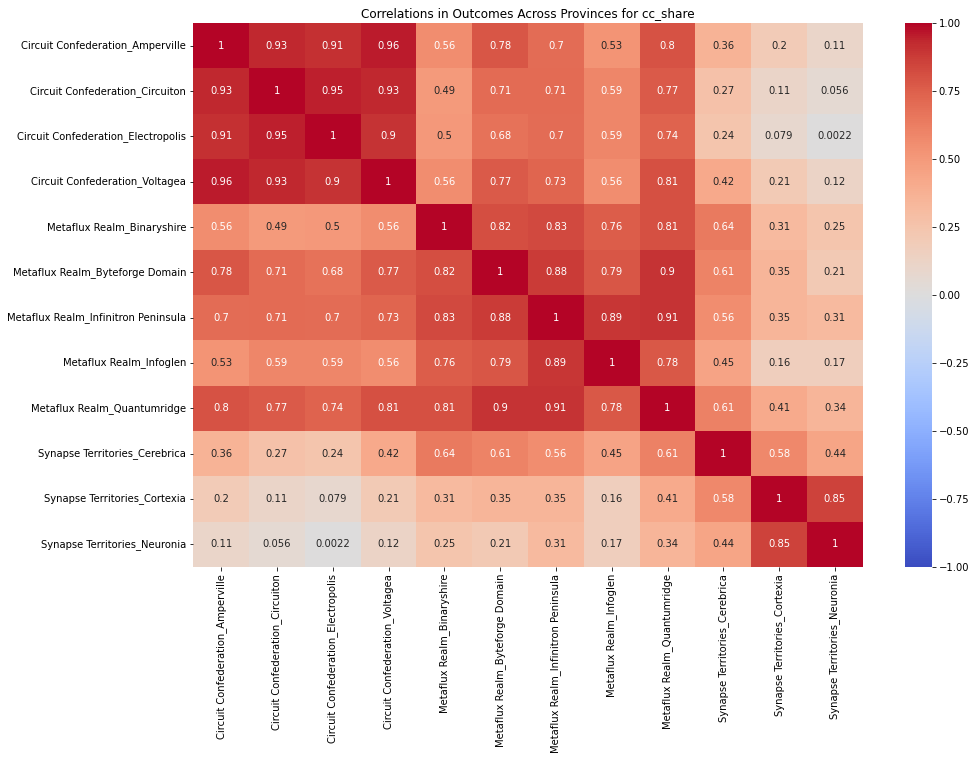

In [165]:
# cs = []
for col in pshares:
    # subc = 
    partywise_corr(res_ee,col)
    # cs.append(subc)

# Does ethnicity matter at all? Economic conditions? - Linear Regressions by Party

In [361]:
y

,cc_share,dgm_share,pdal_share,ssp_share
0,0.047924,0.181743,0.770333,0.000000
1,0.829564,0.022409,0.148026,0.000000
2,0.438357,0.082160,0.479483,0.000000
3,0.308617,0.274261,0.320309,0.096813
4,0.073943,0.480847,0.445211,0.000000
...,...,...,...,...
475,0.423952,0.330976,0.245072,0.000000
476,0.355367,0.318422,0.326211,0.000000
477,0.034064,0.191491,0.094812,0.679633
478,0.178276,0.340202,0.481521,0.000000


In [371]:
Xc = X.astype({col: 'int' for col in X.columns if X[col].dtype == 'bool'})
Xc

,const,province_Amperville,province_Binaryshire,province_Byteforge Domain,province_Cerebrica,province_Circuiton,province_Cortexia,province_Electropolis,province_Infinitron Peninsula,province_Infoglen,...,party_in_power_cc,party_in_power_dgm,party_in_power_pdal,python_pop_share,cobolite_pop_share,javarian_pop_share,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
0,1.0,1,0,0,0,0,0,0,0,0,...,0,0,1,0.765173,0.084048,0.150780,0.048,0.054,0.035,0.408
1,1.0,0,1,0,0,0,0,0,0,0,...,0,0,1,0.030380,0.927361,0.042259,0.048,0.054,0.035,0.408
2,1.0,0,0,1,0,0,0,0,0,0,...,0,0,1,0.545108,0.317107,0.137786,0.048,0.054,0.035,0.408
3,1.0,0,0,0,1,0,0,0,0,0,...,0,0,1,0.404046,0.529105,0.066849,0.048,0.054,0.035,0.408
4,1.0,0,0,0,0,1,0,0,0,0,...,0,0,1,0.402774,0.059544,0.537682,0.048,0.054,0.035,0.408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,1.0,0,0,0,0,0,0,0,1,0,...,0,0,1,0.167412,0.439659,0.392929,0.018,0.041,0.067,-0.014
476,1.0,0,0,0,0,0,0,0,0,1,...,0,0,1,0.134158,0.295264,0.570578,0.018,0.041,0.067,-0.014
477,1.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0.676468,0.100817,0.222715,0.018,0.041,0.067,-0.014
478,1.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0.530973,0.199361,0.269666,0.018,0.041,0.067,-0.014


In [379]:
import statsmodels.api as sm

Xc = X.astype({col: 'int' for col in X.columns if X[col].dtype == 'bool'}).\
    drop(['province_Amperville','region_Metaflux Realm'],axis=1)
Xc

# Add a constant (i.e., bias or intercept)
Xc = sm.add_constant(Xc)

# Create the model
model = sm.OLS(y['pdal_share'], Xc[[#'python_pop_share','cobolite_pop_share','javarian_pop_share',\
                                   #'year_on_year_gdp_pct_change','unemployment_rate','year_on_year_inflation',\
                                   'year_on_year_stock_mkt_pct_change']]).fit()

# Display the summary
summary = model.summary()
print(summary)

                                 OLS Regression Results                                
Dep. Variable:             pdal_share   R-squared (uncentered):                   0.206
Model:                            OLS   Adj. R-squared (uncentered):              0.204
Method:                 Least Squares   F-statistic:                              124.2
Date:                Tue, 17 Oct 2023   Prob (F-statistic):                    8.50e-26
Time:                        20:43:54   Log-Likelihood:                         -195.70
No. Observations:                 480   AIC:                                      393.4
Df Residuals:                     479   BIC:                                      397.6
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

I'm getting this error: ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data). Note that my X data is all bools and float64s

In [365]:
X.dtypes

const                                float64
province_Amperville                     bool
province_Binaryshire                    bool
province_Byteforge Domain               bool
province_Cerebrica                      bool
province_Circuiton                      bool
province_Cortexia                       bool
province_Electropolis                   bool
province_Infinitron Peninsula           bool
province_Infoglen                       bool
province_Neuronia                       bool
province_Quantumridge                   bool
province_Voltagea                       bool
region_Circuit Confederation            bool
region_Metaflux Realm                   bool
region_Synapse Territories              bool
party_in_power_cc                       bool
party_in_power_dgm                      bool
party_in_power_pdal                     bool
python_pop_share                     float64
cobolite_pop_share                   float64
javarian_pop_share                   float64
year_on_ye

# KNN for proximity between provinces

### By just mean vote share

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

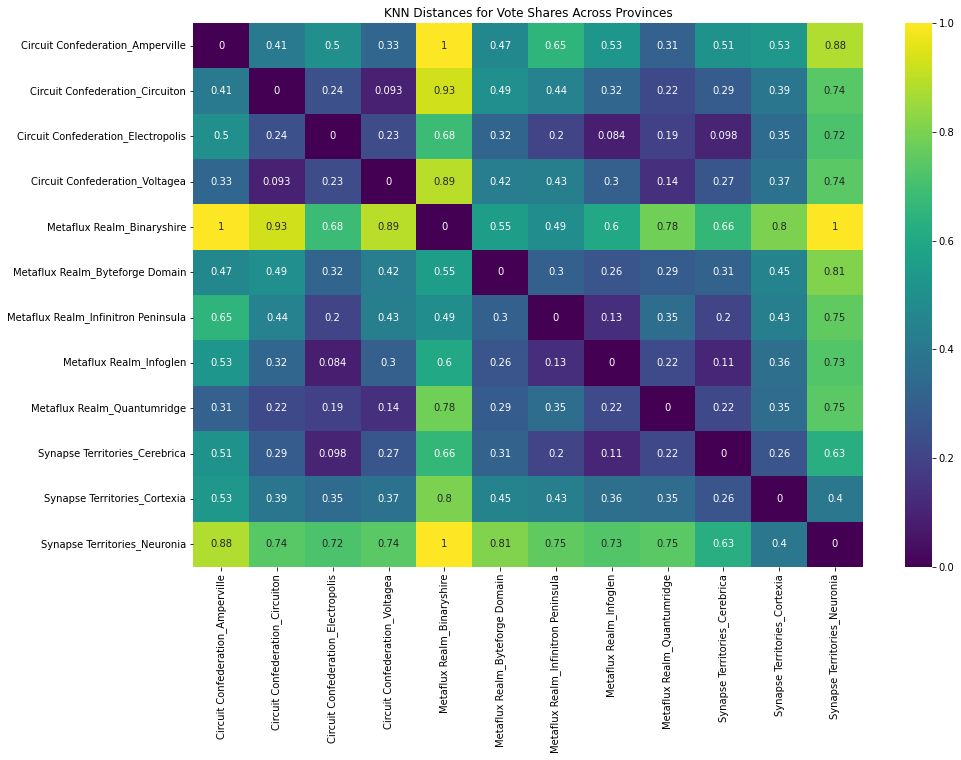

In [700]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

# average each party's share
avg = res_ee.groupby('province')[pshares].mean()

# Create a NearestNeighbors model
nbrs = NearestNeighbors(n_neighbors=12, algorithm='ball_tree').fit(avg)

# Get k-nearest neighbors
distances, indices = nbrs.kneighbors(avg)

dists = []

for i, province in enumerate(avg.index):
    sub = pd.Series(dict(zip([avg.index[idx] for idx in indices[i]],distances[i])),name=province)
    dists.append(sub)
    #print(f"{province}'s nearest neighbors: {[avg.index[idx] for idx in indices[i]]} with distances: {distances[i]}")

# concat into list df for weight assignment
dists_long = []
for i in range(len(dists)):
    a = pd.DataFrame(dists[i])
    a['prov_applied'] = a.columns.values[0]
    a = a.reset_index()
    a.columns = ['prov_to','dist','prov_from']
    dists_long.append(a)
    
knn_weights_v = pd.concat(dists_long,axis=0,ignore_index=True)
knn_weights_v[['prov_from','prov_to']] = knn_weights_v[['prov_from','prov_to']].apply(lambda x: x.map(map_dict))
    
# concat into matrix df to display
knn_dist = pd.concat(dists,axis=1)
knn_dist.index = knn_dist.index.map(map_dict)
knn_dist.columns = knn_dist.columns.map(map_dict)
knn_dist = knn_dist.sort_index(axis=1).sort_index(axis=0)

plt.figure(figsize=(15, 10))
sns.heatmap(knn_dist, annot=True, cmap='viridis', vmin=0, vmax=1)
plt.title("KNN Distances for Vote Shares Across Provinces")
plt.show()

### By just regional/ ethnic attributes

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

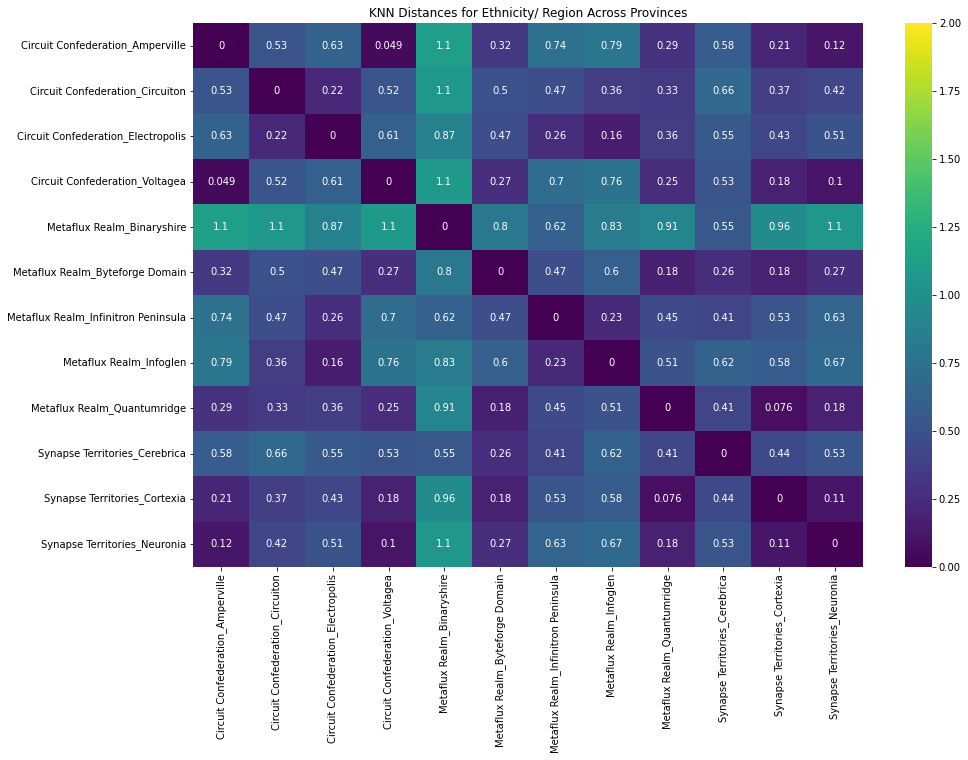

In [680]:
# average each ethnicity's share
avg_eth = res_ee.groupby('province')[['python_pop_share','cobolite_pop_share','javarian_pop_share']].mean()
# also add dummies for region
#pdum = pd.concat([demo['province'],pd.get_dummies(demo['region'],dtype=float,drop_first=True)],axis=1)
#avg_eth = avg_eth.merge(pdum,on='province',how='left').set_index('province')

# Create a NearestNeighbors model
nbrs = NearestNeighbors(n_neighbors=12, algorithm='ball_tree').fit(avg_eth)

# Get k-nearest neighbors
distances, indices = nbrs.kneighbors(avg_eth)

dists = []

for i, province in enumerate(avg_eth.index):
    sub = pd.Series(dict(zip([avg_eth.index[idx] for idx in indices[i]],distances[i])),name=province)
    dists.append(sub)
    #print(f"{province}'s nearest neighbors: {[avg.index[idx] for idx in indices[i]]} with distances: {distances[i]}")
    
# concat into list df for weight assignment
dists_long = []
for i in range(len(dists)):
    a = pd.DataFrame(dists[i])
    a['prov_applied'] = a.columns.values[0]
    a = a.reset_index()
    a.columns = ['prov_to','dist','prov_from']
    dists_long.append(a)
    
knn_weights_e = pd.concat(dists_long,axis=0,ignore_index=True)
knn_weights_e[['prov_from','prov_to']] = knn_weights_e[['prov_from','prov_to']].apply(lambda x: x.map(map_dict))

# concat into matrix df to display
knn_dist = pd.concat(dists,axis=1)
knn_dist.index = knn_dist.index.map(map_dict)
knn_dist.columns = knn_dist.columns.map(map_dict)
knn_dist = knn_dist.sort_index(axis=1).sort_index(axis=0)

plt.figure(figsize=(15, 10))
sns.heatmap(knn_dist, annot=True, cmap='viridis', vmin=0, vmax=2)
plt.title("KNN Distances for Ethnicity/ Region Across Provinces")
plt.show()

### By both votes and regional /ethnic attributes

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

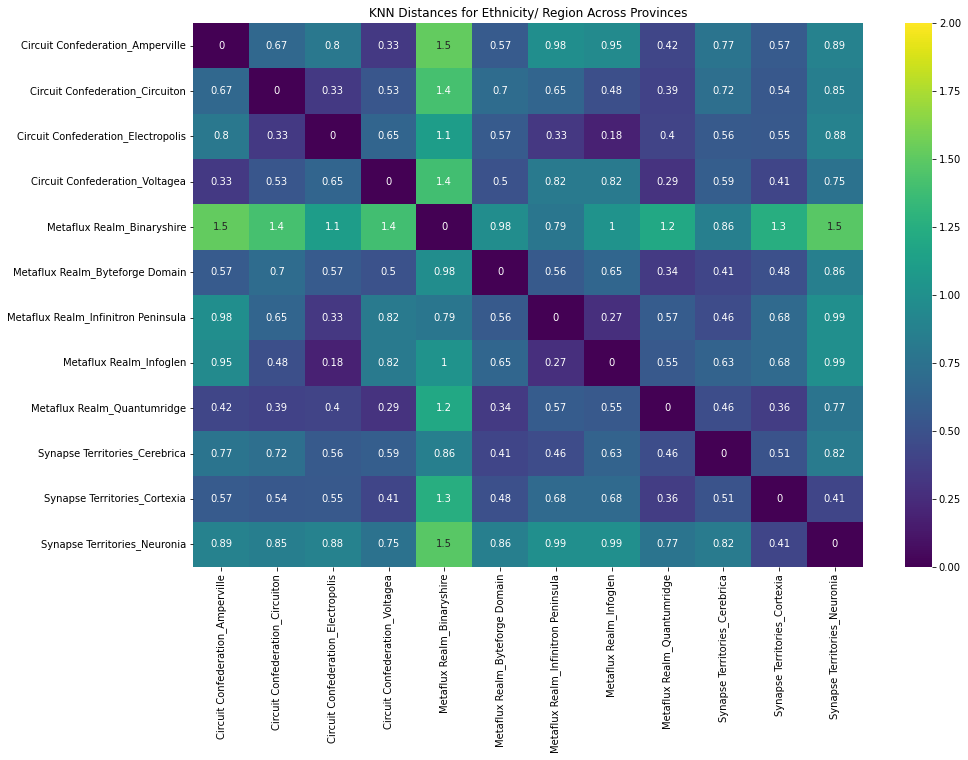

In [679]:
# average each ethnicity's share
avg_all = avg.merge(avg_eth,left_index=True,right_index=True,how='left')

# Create a NearestNeighbors model
nbrs = NearestNeighbors(n_neighbors=12, algorithm='ball_tree').fit(avg_all)

# Get k-nearest neighbors
distances, indices = nbrs.kneighbors(avg_all)

dists = []

for i, province in enumerate(avg_all.index):
    sub = pd.Series(dict(zip([avg_all.index[idx] for idx in indices[i]],distances[i])),name=province)
    dists.append(sub)
    #print(f"{province}'s nearest neighbors: {[avg.index[idx] for idx in indices[i]]} with distances: {distances[i]}")
    
# concat into list df for weight assignment
dists_long = []
for i in range(len(dists)):
    a = pd.DataFrame(dists[i])
    a['prov_applied'] = a.columns.values[0]
    a = a.reset_index()
    a.columns = ['prov_to','dist','prov_from']
    dists_long.append(a)
    
knn_weights_a = pd.concat(dists_long,axis=0,ignore_index=True)
knn_weights_a[['prov_from','prov_to']] = knn_weights_a[['prov_from','prov_to']].apply(lambda x: x.map(map_dict))

# concat into matrix df to display
knn_dist = pd.concat(dists,axis=1)
knn_dist.index = knn_dist.index.map(map_dict)
knn_dist.columns = knn_dist.columns.map(map_dict)
knn_dist = knn_dist.sort_index(axis=1).sort_index(axis=0)

plt.figure(figsize=(15, 10))
sns.heatmap(knn_dist, annot=True, cmap='viridis', vmin=0, vmax=2)
plt.title("KNN Distances for Ethnicity/ Region Across Provinces")
plt.show()

# Partywide elasticity of each province - absolute difference - but the problem here is we don't have nationwide vote shares!

In [21]:
# For each party:
# Calculate population-weighted votes for each election
# Calculate SHARE of pop-weighted votes for each election
# Calculate annual swing
# Take a mean of that annual swing


### FIRST CALCULATE ANNUAL SHARE DIFFERENCES ###

e = []

res_me = res_ee[['year','province']+pshares].melt(id_vars=['year','province'],value_vars=pshares)
res_me.columns = ['year','province','party','share']

for party in pshares:
    for province in res_me.province.unique():
        sub = res_me[(res_me['party']==party)&(res_me['province']==province)]
        sub['pdiff'] = sub['share'].diff().abs()
        e.append(sub)
            
diffs = pd.concat(e,axis=0)
# diffs = diffs[diffs['year']!=1984]

# add population
diffs = diffs.merge(demo[['province','region','population']],on='province',how='left')
# compute population-weighted vote (for purposes of calculating national swing)
diffs['pvotes'] = diffs['share'] * diffs['population']

### CALCULATE MEAN ANNUAL CHANGE BY PARTY BY PROVINCE ###

meandiffs = []

for party in pshares:
    meandiffs.append(diffs[(diffs['party']==party)&(diffs['year']!=1984)].groupby(['province']).pdiff.mean())
        
meandiff = pd.concat(meandiffs,axis=1)
meandiff.columns = pshares

### CALCULATE THE SAME NATIONALLY, WEIGHTING BY POPULATION ### 

nat_diffs = []

for party in pshares:
    pv = diffs[(diffs['party']==party)&(diffs['year']!=1984)].groupby('year').pvotes.sum() / demo.population.sum()
    natvar = pv.diff().abs().mean()
    row = {}
    row['party'] = party
    row['meandiff'] = natvar
    nat_diffs.append(row)
    
natdiff = pd.DataFrame(nat_diffs).set_index('party').T

### CALCULATE PARTY-WISE PROVINCIAL ELASTICITY BY COMPARING PROVINCE-LEVEL VARIABILITY WITH NATIONAL ###

meandiffs

elasticity = meandiff.div(natdiff.iloc[0])
elasticity

,pdal_share,ssp_share,dgm_share,cc_share
province,,,,
Amperville,1.640269,0.000000,1.040581,0.483748
Binaryshire,0.778383,0.000000,0.105789,0.625496
Byteforge Domain,1.427641,0.000000,0.492252,1.357167
Cerebrica,0.468581,1.802564,1.011754,1.054354
Circuiton,2.162810,0.000000,1.618990,0.954113
Cortexia,0.828287,5.065894,0.925320,0.539323
Electropolis,1.446289,0.000000,1.662169,2.110663
Infinitron Peninsula,0.871080,0.000000,1.034692,1.619464
Infoglen,0.933288,0.000000,1.067699,1.468599


# Import national polls, join to actual results

In [22]:
# national results as per above
natshares = diffs.groupby(['year','party']).pvotes.sum() / demo.population.sum()
natshares = natshares.reset_index()
natshares['geography'] = 'National'
natshares.columns = ['year','party','share','geography']

# regional results as per above

regpops = demo.groupby('region')['population'].sum().reset_index()

regshares = diffs.groupby(['year','region','party']).pvotes.sum().reset_index()
regshares = regshares.merge(regpops[['region','population']],how='left')
regshares['share'] = regshares['pvotes'] / regshares['population']
regshares = regshares[['year','region','party','share']].rename(columns={'region':'geography'})

# aggregate and widen
aggshares = pd.concat([natshares,regshares],ignore_index=True)
aggshares = aggshares.pivot(index=['year','geography'],columns='party',values='share').reset_index()

# and narrow down provincial shares too

provshares = res_e[['year','province','cc_share','dgm_share','pdal_share','ssp_share']]\
    .rename(columns={'province':'geography'})

# now put them together

aggshares = pd.concat([aggshares,provshares],ignore_index=True)
aggshares

,year,geography,cc_share,dgm_share,pdal_share,ssp_share
0,1984,Circuit Confederation,0.165413,0.345410,0.489177,0.000000
1,1984,Metaflux Realm,0.397683,0.227854,0.374463,0.000000
2,1984,National,0.241317,0.274289,0.399550,0.084844
3,1984,Synapse Territories,0.190305,0.201995,0.268324,0.339376
4,1985,Circuit Confederation,0.192604,0.323258,0.484139,0.000000
...,...,...,...,...,...,...
635,2023,Infinitron Peninsula,0.423952,0.330976,0.245072,0.000000
636,2023,Infoglen,0.355367,0.318422,0.326211,0.000000
637,2023,Neuronia,0.034064,0.191491,0.094812,0.679633
638,2023,Quantumridge,0.178276,0.340202,0.481521,0.000000


In [1992]:
res_e[['year','province','cc_share','dgm_share','pdal_share','ssp_share']]

,year,province,cc_share,dgm_share,pdal_share,ssp_share
0,1984,Amperville,0.047924,0.181743,0.770333,0.000000
1,1984,Binaryshire,0.829564,0.022409,0.148026,0.000000
2,1984,Byteforge Domain,0.438357,0.082160,0.479483,0.000000
3,1984,Cerebrica,0.308617,0.274261,0.320309,0.096813
4,1984,Circuiton,0.073943,0.480847,0.445211,0.000000
...,...,...,...,...,...,...
475,2023,Infinitron Peninsula,0.423952,0.330976,0.245072,0.000000
476,2023,Infoglen,0.355367,0.318422,0.326211,0.000000
477,2023,Neuronia,0.034064,0.191491,0.094812,0.679633
478,2023,Quantumridge,0.178276,0.340202,0.481521,0.000000


In [23]:
ppshares = ['pdal_poll_share','ssp_poll_share','dgm_poll_share','cc_poll_share']

polls = pd.read_csv('updated_dataland_polls_1984_2023.csv')
polls = polls.merge(aggshares,on=['year','geography'],how='left')
polls

,year,date_conducted,date_published,pollster,geography,mode,sample_size,population_surveyed,sponsor,cc_poll_share,dgm_poll_share,pdal_poll_share,ssp_poll_share,undecided_poll_share,cc_share,dgm_share,pdal_share,ssp_share
0,1984,1984-04-03,1984-04-04,Dataland Daily,National,Online,200,Adults,NaN,0.125,0.190,0.415,0.065,0.205,0.241317,0.274289,0.399550,0.084844
1,1984,1984-04-05,1984-04-06,No Province Left Behind,Infinitron Peninsula,IVR,500,RV,NaN,0.418,0.262,0.200,0.000,0.120,0.443475,0.296444,0.260081,0.000000
2,1984,1984-04-04,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.180,0.240,0.340,0.070,0.170,0.241317,0.274289,0.399550,0.084844
3,1984,1984-04-05,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.150,0.255,0.285,0.080,0.230,0.241317,0.274289,0.399550,0.084844
4,1984,1984-04-05,1984-04-07,Progressive Polling,Cortexia,Live caller,1000,Adults,NaN,0.121,0.155,0.216,0.383,0.125,0.145292,0.175291,0.270709,0.408708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,2023,2023-06-16,2023-06-18,Metaflux University,Infinitron Peninsula,IVR,1500,RV,NaN,0.417,0.323,0.203,0.000,0.057,0.423952,0.330976,0.245072,0.000000
10123,2023,2023-06-16,2023-06-18,Dataland Register-Gazette,National,Live caller,1500,LV,NaN,0.213,0.287,0.402,0.064,0.033,0.239873,0.305637,0.381032,0.073457
10124,2023,2023-06-16,2023-06-18,Big Dataland Surveys,National,Online,10000,RV,NaN,0.170,0.327,0.384,0.060,0.060,0.239873,0.305637,0.381032,0.073457
10125,2023,2023-06-16,2023-06-18,Synapse Strategies,Neuronia,Online,1000,LV,NaN,0.024,0.198,0.104,0.619,0.055,0.034064,0.191491,0.094812,0.679633


In [682]:
polls.pollster.value_counts()

pollster
Dataland Daily                  2960
Proudly Paid For Polling        1552
Dataland Register-Gazette       1351
Cobolite Coalition Calling       795
Metaflux University              782
Progressive Polling              590
Big Dataland Surveys             587
No Province Left Behind          476
Synapse Strategies               474
Conference Board of Dataland     400
Electropolis Elects              160
Name: count, dtype: int64

# Evaluate polls and pollsters
What does it mean to evaluate a pollster?
* Calculate simple bias: Simple average error (root mean squared error)
    * 538 method: simple average error between top and second party (in actual terms)
    * More complex: add between 2-3 and 3-4 parties too
* Calculate average temporal error
* Calculate sampling error??
* Total error (simple + temporal + sampling) ?

In [763]:
# have this function written but don't actually use
def abs_margins(row):
    sub = row[[col for col in row.index if "_share" in col and "_poll" not in col]].astype(float)\
        .sort_values(ascending=False)
    win = sub.iloc[0] - sub.iloc[1]
    run = sub.iloc[1] - sub.iloc[2]
    third = sub.iloc[2] - sub.iloc[3]
    
    # get index values for sorting purposes
    new_poll_ind = [(ind.split("_") + ["poll"]) for ind in sub.index]
    new_poll_ind = ["_".join([ind[i] for i in [0,2,1]]) for ind in new_poll_ind]
    
    subp = row[[col for col in row.index if "_share" in col and "_poll" in col]].astype(float)
    # sort them in order of the actuals
    subp = subp[new_poll_ind]
    winp = subp.iloc[0] - subp.iloc[1]
    runp = subp.iloc[1] - subp.iloc[2]
    thirdp = subp.iloc[2] - subp.iloc[3]
    
    return pd.Series([winp,runp,thirdp,win,run,third],index=['diff1_poll','diff2_poll','diff3_poll',\
                                                             'diff1_actual','diff2_actual','diff3_actual'])

In [565]:
pollse.columns

Index(['year', 'date_conducted', 'date_published', 'pollster', 'geography',
       'mode', 'sample_size', 'population_surveyed', 'sponsor',
       'cc_poll_share', 'dgm_poll_share', 'pdal_poll_share', 'ssp_poll_share',
       'undecided_poll_share', 'cc_share', 'dgm_share', 'pdal_share',
       'ssp_share', 'diff1_poll', 'diff2_poll', 'diff3_poll', 'diff1_actual',
       'diff2_actual', 'diff3_actual'],
      dtype='object')

In [967]:
histe

,date,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
0,1980-03-31,0.013,0.026,0.184,0.391
1,1980-06-30,0.021,0.029,0.179,0.442
2,1980-09-30,0.030,0.033,0.163,0.504
3,1980-12-31,0.038,0.036,0.161,0.690
4,1981-03-31,0.047,0.036,0.152,0.733
5,1981-06-30,0.037,0.036,0.151,0.646
6,1981-09-30,0.028,0.036,0.154,0.461
7,1981-12-31,0.018,0.035,0.157,0.211
8,1982-03-31,0.009,0.041,0.158,0.073
9,1982-06-30,0.016,0.046,0.170,0.012


In [24]:
def quarterly_date(dt: datetime):
    if dt.month < 4:
        new_date = f"{dt.year-1}-12-31"
    elif dt.month < 7:
        new_date = f"{dt.year}-03-31"
    elif dt.month < 10:
        new_date = f"{dt.year}-06-30"
    else:
        new_date = f"{dt.year}-09-30"
    return datetime.strptime(new_date,"%Y-%m-%d")

In [1539]:
demo.sort_values(by='region')

,province,region,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes
0,Amperville,Circuit Confederation,1000000,0.765173,0.084048,0.150780,15
4,Circuiton,Circuit Confederation,500000,0.402774,0.059544,0.537682,10
6,Electropolis,Circuit Confederation,2250000,0.265686,0.229266,0.505048,27
11,Voltagea,Circuit Confederation,750000,0.736797,0.123078,0.140124,12
1,Binaryshire,Metaflux Realm,150000,0.030380,0.927361,0.042259,7
2,Byteforge Domain,Metaflux Realm,650000,0.545108,0.317107,0.137786,12
7,Infinitron Peninsula,Metaflux Realm,200000,0.167412,0.439659,0.392929,7
8,Infoglen,Metaflux Realm,1750000,0.134158,0.295264,0.570578,22
10,Quantumridge,Metaflux Realm,250000,0.530973,0.199361,0.269666,8
3,Cerebrica,Synapse Territories,850000,0.404046,0.529105,0.066849,13


In [1541]:
res[res['year']==2005].sort_values(by='region')

,year,province,region,party_in_power,provincial_winner,national_winner,national_pop_vote_winner,cc_share,dgm_share,pdal_share,ssp_share
252,2005,Amperville,Circuit Confederation,cc,pdal,cc,pdal,0.057323,0.192165,0.750512,0.000000
256,2005,Circuiton,Circuit Confederation,cc,pdal,cc,pdal,0.113928,0.429592,0.456480,0.000000
258,2005,Electropolis,Circuit Confederation,cc,cc,cc,pdal,0.337314,0.327961,0.334725,0.000000
263,2005,Voltagea,Circuit Confederation,cc,pdal,cc,pdal,0.136614,0.369356,0.494030,0.000000
253,2005,Binaryshire,Metaflux Realm,cc,cc,cc,pdal,0.860429,0.018317,0.121254,0.000000
254,2005,Byteforge Domain,Metaflux Realm,cc,cc,cc,pdal,0.463492,0.084199,0.452309,0.000000
259,2005,Infinitron Peninsula,Metaflux Realm,cc,cc,cc,pdal,0.525451,0.242566,0.231984,0.000000
260,2005,Infoglen,Metaflux Realm,cc,cc,cc,pdal,0.392345,0.286854,0.320800,0.000000
262,2005,Quantumridge,Metaflux Realm,cc,pdal,cc,pdal,0.231845,0.271512,0.496644,0.000000
255,2005,Cerebrica,Synapse Territories,cc,dgm,cc,pdal,0.255372,0.344237,0.315770,0.084621


In [25]:
# add ranked margin differences
# pollse = pd.concat([polls,polls.apply(abs_margins,axis=1)],axis=1)
pollse = polls.copy()

# add columns adjusting polls to remove undecideds
scaled_polls = pollse[ppshares].multiply(pollse[ppshares].sum(axis=1)**-1,axis=0)
ppshares_sc = ['pdal_poll_scaled','ssp_poll_scaled','dgm_poll_scaled','cc_poll_scaled']
scaled_polls.columns = ppshares_sc
pollse = pd.concat([pollse,scaled_polls],axis=1)

# add party-wise share differences
pollse['pdal_diff'] = pollse['pdal_poll_scaled'] - pollse['pdal_share']
pollse['ssp_diff'] = pollse['ssp_poll_scaled'] - pollse['ssp_share']
pollse['dgm_diff'] = pollse['dgm_poll_scaled'] - pollse['dgm_share']
pollse['cc_diff'] = pollse['cc_poll_scaled'] - pollse['cc_share']
pdiffs = ['pdal_diff','ssp_diff','dgm_diff','cc_diff']

# add calendar
pollse = pollse.merge(cal,left_on='year',right_on='election_cycle',how='left')

# transform date columns to datetime
pollse[[col for col in pollse.columns if 'date' in col]+['election_day']] = \
    pollse[[col for col in pollse.columns if 'date' in col]+['election_day']].apply(pd.to_datetime)

# calculate days to election
pollse['days_to_election'] = (pollse['date_conducted'] - pollse['election_day']).dt.days

# add demographic data
pollse = pollse.merge(demo_r,on='geography',how='left')

# add economic data for the latest available quarter
pollse = pollse.merge(histe,left_on=pollse['date_conducted'].apply(quarterly_date),\
                      right_on=pd.to_datetime(histe['date']),how='left').drop('key_0',axis=1)

# add incumbency
pollse = pollse.merge(res[['year','party_in_power']].drop_duplicates(),on='year',how='left')

pollse

,year,date_conducted,date_published,pollster,geography,mode,sample_size,population_surveyed,sponsor,cc_poll_share,dgm_poll_share,pdal_poll_share,ssp_poll_share,undecided_poll_share,cc_share,dgm_share,pdal_share,ssp_share,pdal_poll_scaled,ssp_poll_scaled,dgm_poll_scaled,cc_poll_scaled,pdal_diff,ssp_diff,dgm_diff,cc_diff,election_cycle,election_day,cc_conference_start_date,cc_conference_end_date,dgm_conference_start_date,dgm_conference_end_date,pdal_conference_start_date,pdal_conference_end_date,ssp_conference_start_date,ssp_conference_end_date,debate_date_1,debate_date_2,debate_date_3,days_to_election,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes,date,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change,party_in_power
0,1984,1984-04-03,1984-04-04,Dataland Daily,National,Online,200,Adults,NaN,0.125,0.190,0.415,0.065,0.205,0.241317,0.274289,0.399550,0.084844,0.522013,0.081761,0.238994,0.157233,0.122463,-0.003083,-0.035296,-0.084084,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-75,1.000000e+07,0.421937,0.243514,0.334549,160.0,1984-03-31,0.048,0.054,0.035,0.408,pdal
1,1984,1984-04-05,1984-04-06,No Province Left Behind,Infinitron Peninsula,IVR,500,RV,NaN,0.418,0.262,0.200,0.000,0.120,0.443475,0.296444,0.260081,0.000000,0.227273,0.000000,0.297727,0.475000,-0.032808,0.000000,0.001283,0.031525,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,2.000000e+05,0.167412,0.439659,0.392929,7.0,1984-03-31,0.048,0.054,0.035,0.408,pdal
2,1984,1984-04-04,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.180,0.240,0.340,0.070,0.170,0.241317,0.274289,0.399550,0.084844,0.409639,0.084337,0.289157,0.216867,0.010089,-0.000507,0.014867,-0.024449,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-74,1.000000e+07,0.421937,0.243514,0.334549,160.0,1984-03-31,0.048,0.054,0.035,0.408,pdal
3,1984,1984-04-05,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.150,0.255,0.285,0.080,0.230,0.241317,0.274289,0.399550,0.084844,0.370130,0.103896,0.331169,0.194805,-0.029420,0.019052,0.056879,-0.046512,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,1.000000e+07,0.421937,0.243514,0.334549,160.0,1984-03-31,0.048,0.054,0.035,0.408,pdal
4,1984,1984-04-05,1984-04-07,Progressive Polling,Cortexia,Live caller,1000,Adults,NaN,0.121,0.155,0.216,0.383,0.125,0.145292,0.175291,0.270709,0.408708,0.246857,0.437714,0.177143,0.138286,-0.023852,0.029006,0.001852,-0.007007,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,1.400000e+06,0.592846,0.170363,0.236791,19.0,1984-03-31,0.048,0.054,0.035,0.408,pdal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,2023,2023-06-16,2023-06-18,Metaflux University,Infinitron Peninsula,IVR,1500,RV,NaN,0.417,0.323,0.203,0.000,0.057,0.423952,0.330976,0.245072,0.000000,0.215270,0.000000,0.342524,0.442206,-0.029802,0.000000,0.011547,0.018254,2023,2023-06-18,2023-04-29,2023-05-01,2023-05-13,2023-05-15,2023-05-06,2023-05-08,2023-04-22,2023-04-24,2023-05-19,2023-05-29,2023-06-08,-2,2.000000e+05,0.167412,0.439659,0.392929,7.0,2023-03-31,0.018,0.041,0.067,-0.014,pdal
10123,2023,2023-06-16,2023-06-18,Dataland Register-Gazette,National,Live caller,1500,LV,NaN,0.213,0.287,0.402,0.064,0.033,0.239873,0.305637,0.381032,0.073457,0.416149,0.066253,0.297101,0.220497,0.035117,-0.007204,-0.008536,-0.019376,2023,2023-06-18,2023-04-29,2023-05-01,2023-05-13,202

### Turnout quirks: how do polls of nation/ regions/ provinces compare to actuals by year?

In [823]:
pollse.groupby(['year','geography'])[pdiffs].mean().reset_index().melt(id_vars=['year','geography'])

,year,geography,variable,value
0,1984,Amperville,pdal_diff,0.013894
1,1984,Binaryshire,pdal_diff,-0.010443
2,1984,Byteforge Domain,pdal_diff,-0.022769
3,1984,Cerebrica,pdal_diff,0.007115
4,1984,Circuit Confederation,pdal_diff,0.013851
...,...,...,...,...
2551,2023,National,cc_diff,-0.033506
2552,2023,Neuronia,cc_diff,-0.003127
2553,2023,Quantumridge,cc_diff,-0.002256
2554,2023,Synapse Territories,cc_diff,-0.008694


### How do undecideds diminish over time?

In [ ]:
g = sns.FacetGrid(pollse, row='province')
g.map_dataframe(sns.scatterplot,x='year',y='value',hue='variable')

### Does any one party benefit from undecideds?

### Summarize each pollster's province-wise bias - should the bias adjustment simply be modeled? As a function of time, geography, sponsor, pollster?

In [815]:
# summarize each pollster's province-wise bias
pd.concat([
(pollse.fillna("").groupby(['pollster','geography','sponsor'])[['cc_diff','pdal_diff','dgm_diff','ssp_diff']]\
    .mean() * 100),\
pollse.fillna("").groupby(['pollster','geography','sponsor']).size()
],axis=1).reset_index()
    

,pollster,geography,sponsor,cc_diff,pdal_diff,dgm_diff,ssp_diff,0
0,Big Dataland Surveys,Circuit Confederation,,-1.061103,-0.113037,1.174140,0.000000,131
1,Big Dataland Surveys,Metaflux Realm,,-1.707894,-0.890548,2.598442,0.000000,145
2,Big Dataland Surveys,National,,-1.843428,-0.601850,2.425226,0.020052,166
3,Big Dataland Surveys,Synapse Territories,,-1.962038,-0.839947,3.028634,-0.226649,145
4,Cobolite Coalition Calling,Amperville,,0.998323,-0.006396,-0.991927,0.000000,9
5,Cobolite Coalition Calling,Amperville,CC,2.640583,0.050932,-2.691515,0.000000,46
6,Cobolite Coalition Calling,Binaryshire,,0.150085,-0.055656,-0.094429,0.000000,16
7,Cobolite Coalition Calling,Binaryshire,CC,3.622115,-3.048788,-0.573327,0.000000,24
8,Cobolite Coalition Calling,Byteforge Domain,,6.140437,-5.876550,-0.263888,0.000000,17
9,Cobolite Coalition Calling,Byteforge Domain,CC,8.601154,-7.639769,-0.961385,0.000000,28


In [841]:
# summarize each province's bias
pd.concat([
(pollse.fillna("").groupby(['geography','pollster','sponsor'])[['cc_diff','pdal_diff','dgm_diff','ssp_diff']]\
    .mean() * 100),\
pollse.fillna("").groupby(['geography','pollster','sponsor']).size()
],axis=1).reset_index()

,geography,pollster,sponsor,cc_diff,pdal_diff,dgm_diff,ssp_diff,0
0,Amperville,Cobolite Coalition Calling,,0.998323,-0.006396,-0.991927,0.000000,9
1,Amperville,Cobolite Coalition Calling,CC,2.640583,0.050932,-2.691515,0.000000,46
2,Amperville,No Province Left Behind,,0.197625,0.695028,-0.892653,0.000000,80
3,Amperville,Proudly Paid For Polling,CC,0.933506,-1.162680,0.229174,0.000000,28
4,Amperville,Proudly Paid For Polling,DGM,-0.173225,-2.894110,3.067335,0.000000,35
5,Amperville,Proudly Paid For Polling,PDAL,-1.015718,5.171145,-4.155427,0.000000,32
6,Binaryshire,Cobolite Coalition Calling,,0.150085,-0.055656,-0.094429,0.000000,16
7,Binaryshire,Cobolite Coalition Calling,CC,3.622115,-3.048788,-0.573327,0.000000,24
8,Binaryshire,Metaflux University,,0.420913,-0.287673,-0.133240,0.000000,133
9,Binaryshire,No Province Left Behind,,-0.280335,0.167072,0.113263,0.000000,90


### Similarly, for each province, make a pollster estimate distribution plot

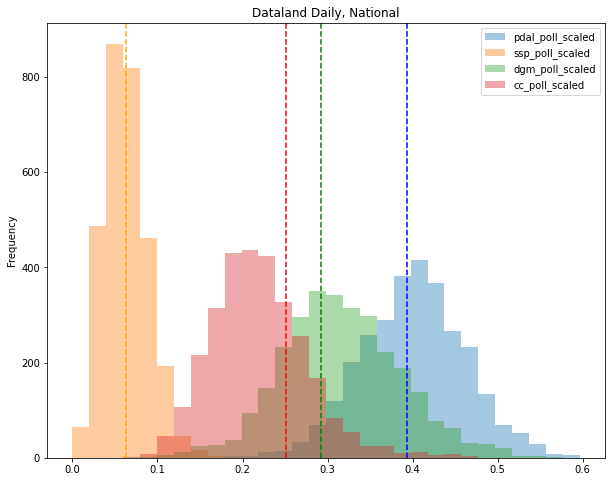

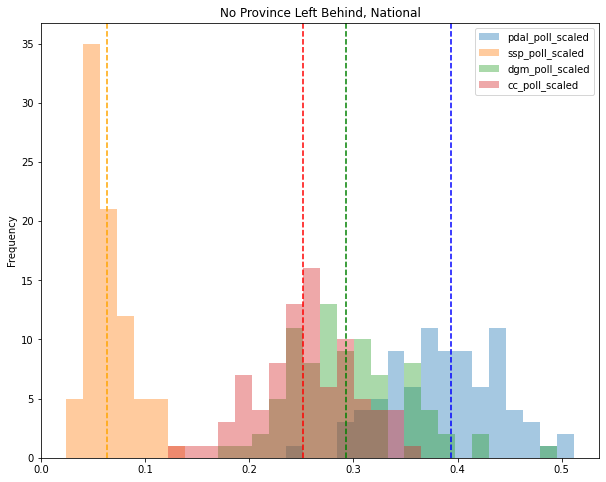

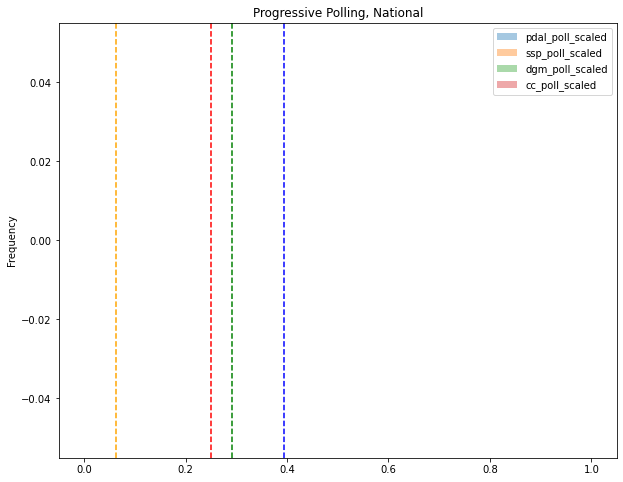

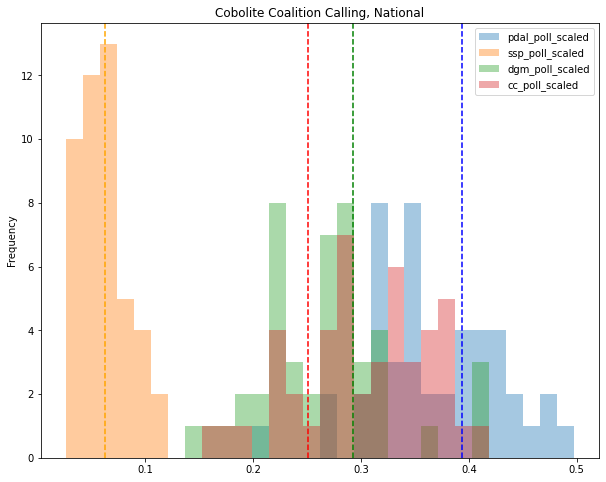

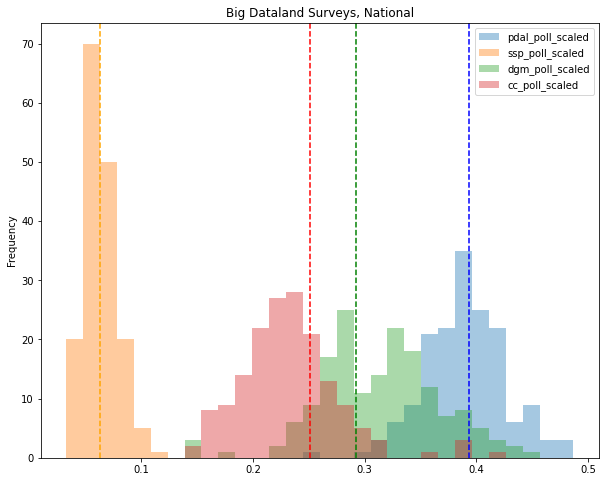

...

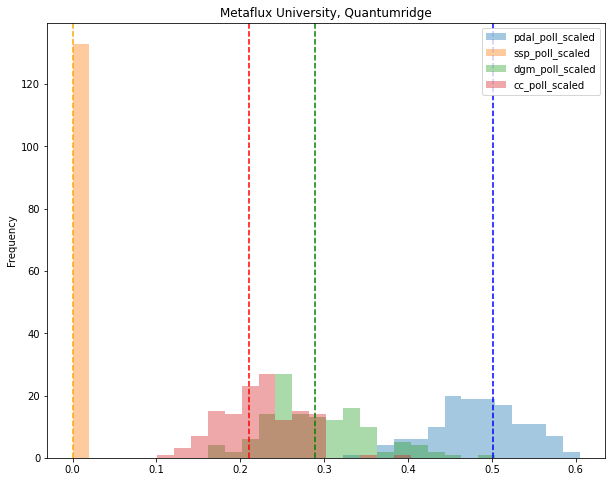

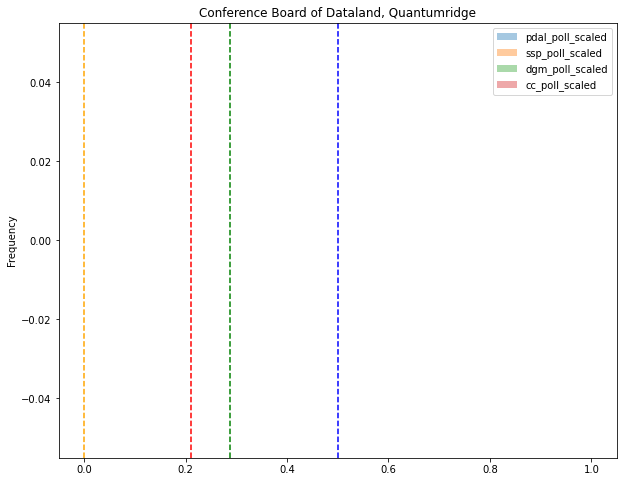

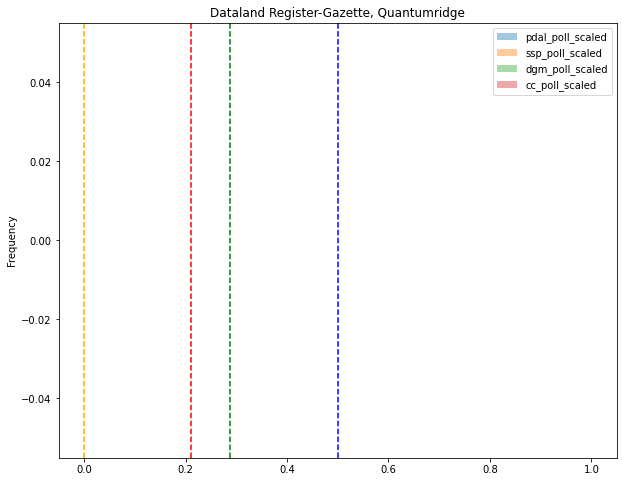

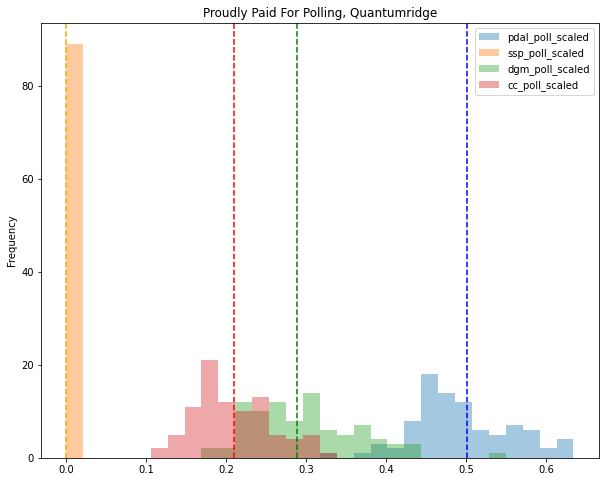

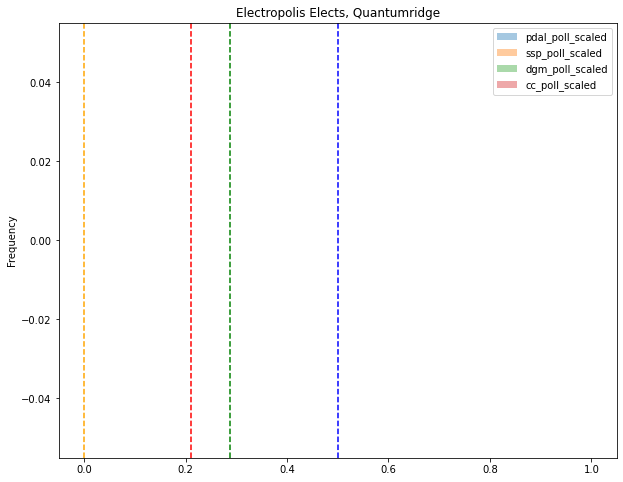

In [957]:
for geo in pollse.geography.unique().tolist():
    for pollster in pollse.pollster.unique().tolist():
        ax = pollse[(pollse['geography']==geo)&(pollse['pollster']==pollster)][ppshares_sc]\
            .plot(kind='hist',title=f'{pollster}, {geo}',bins=30,alpha=0.4,figsize=(10,8))
        ax.axvline(x=pollse[(pollse['geography']==geo)]['ssp_share'].mean(),color='orange',linestyle='--')
        ax.axvline(x=pollse[(pollse['geography']==geo)]['pdal_share'].mean(),color='blue',linestyle='--')
        ax.axvline(x=pollse[(pollse['geography']==geo)]['dgm_share'].mean(),color='green',linestyle='--')
        ax.axvline(x=pollse[(pollse['geography']==geo)]['cc_share'].mean(),color='red',linestyle='--')
        plt.show()

### Is there a polling methodology error?

In [1230]:
pollse

,year,date_conducted,date_published,pollster,geography,mode,sample_size,population_surveyed,sponsor,cc_poll_share,dgm_poll_share,pdal_poll_share,ssp_poll_share,undecided_poll_share,cc_share,dgm_share,pdal_share,ssp_share,pdal_poll_scaled,ssp_poll_scaled,dgm_poll_scaled,cc_poll_scaled,pdal_diff,ssp_diff,dgm_diff,cc_diff,election_cycle,election_day,cc_conference_start_date,cc_conference_end_date,dgm_conference_start_date,dgm_conference_end_date,pdal_conference_start_date,pdal_conference_end_date,ssp_conference_start_date,ssp_conference_end_date,debate_date_1,debate_date_2,debate_date_3,days_to_election,province,region,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes,date,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
0,1984,1984-04-03,1984-04-04,Dataland Daily,National,Online,200,Adults,NaN,0.125,0.190,0.415,0.065,0.205,0.241317,0.274289,0.399550,0.084844,0.522013,0.081761,0.238994,0.157233,0.122463,-0.003083,-0.035296,-0.084084,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
1,1984,1984-04-05,1984-04-06,No Province Left Behind,Infinitron Peninsula,IVR,500,RV,NaN,0.418,0.262,0.200,0.000,0.120,0.443475,0.296444,0.260081,0.000000,0.227273,0.000000,0.297727,0.475000,-0.032808,0.000000,0.001283,0.031525,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,Infinitron Peninsula,Metaflux Realm,200000.0,0.167412,0.439659,0.392929,7.0,1984-03-31,0.048,0.054,0.035,0.408
2,1984,1984-04-04,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.180,0.240,0.340,0.070,0.170,0.241317,0.274289,0.399550,0.084844,0.409639,0.084337,0.289157,0.216867,0.010089,-0.000507,0.014867,-0.024449,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
3,1984,1984-04-05,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.150,0.255,0.285,0.080,0.230,0.241317,0.274289,0.399550,0.084844,0.370130,0.103896,0.331169,0.194805,-0.029420,0.019052,0.056879,-0.046512,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
4,1984,1984-04-05,1984-04-07,Progressive Polling,Cortexia,Live caller,1000,Adults,NaN,0.121,0.155,0.216,0.383,0.125,0.145292,0.175291,0.270709,0.408708,0.246857,0.437714,0.177143,0.138286,-0.023852,0.029006,0.001852,-0.007007,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,Cortexia,Synapse Territories,1400000.0,0.592846,0.170363,0.236791,19.0,1984-03-31,0.048,0.054,0.035,0.408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,2023,2023-06-16,2023-06-18,Metaflux University,Infinitron Peninsula,IVR,1500,RV,NaN,0.417,0.323,0.203,0.000,0.057,0.423952,0.330976,0.245072,0.000000,0.215270,0.000000,0.342524,0.442206,-0.029802,0.000000,0.011547,0.018254,2023,2023-06-18,2023-04-29,2023-05-01,2023-05-13,2023-05-15,2023-05-06,2023-05-08,2023-04-22,2023-04-24,2023-05-19,2023-05-29,2023-06-08,-2,Infinitron Peninsula,Metaflux Realm,200000.0,0.167412,0.439659,0.392929,7.0,2023-03-31,0.018,0.041,0.067,-0.014
10123,2023,2023-06-16,2023-06-18,Dataland Register-Gazette,National,Live caller,1500,LV,NaN,0.213,0.287,0.402,0.064,0.033,0.239873,0.305637,0.381032,0.073457,0.416149,0.066253,0.297101,0.220497,0.035117,-0.007204,-0.008536,-0.019376,2023,2023-06-18,2023-04-29,2023-05-01,202

In [1231]:
pollse.groupby(['population_surveyed'])[pdiffs].mean()

,pdal_diff,ssp_diff,dgm_diff,cc_diff
population_surveyed,,,,
Adults,0.012609,-0.000392,0.018838,-0.031056
LV,0.009436,-0.000099,-0.001136,-0.008201
RV,-0.002444,-0.000917,-0.004521,0.007882


# Evaluate calendar effects as a temporal adjustment for polling model - start with just national polls and actual results
* How long before election is each convention?
    * SSP: 57 days
    * CC: 50 days
    * PDAL: 43 days
    * DGM: 36 days
* How long before election is each debate?
* Do we need to account for this since "days to election" will always be the same?

In [895]:
pollse[pollse['geography']=='Infinitron Peninsula'].groupby('days_to_election')[ppshares_sc].mean()

,pdal_poll_scaled,ssp_poll_scaled,dgm_poll_scaled,cc_poll_scaled
days_to_election,,,,
-75 days,0.201502,0.0,0.230288,0.568210
-74 days,0.277479,0.0,0.352057,0.370464
-73 days,0.217085,0.0,0.326204,0.456712
-72 days,0.216616,0.0,0.237288,0.546096
-71 days,0.245292,0.0,0.236139,0.518569
-70 days,0.231884,0.0,0.207729,0.560386
-69 days,0.234468,0.0,0.311144,0.454387
-67 days,0.232719,0.0,0.350230,0.417051
-65 days,0.221521,0.0,0.255789,0.522690


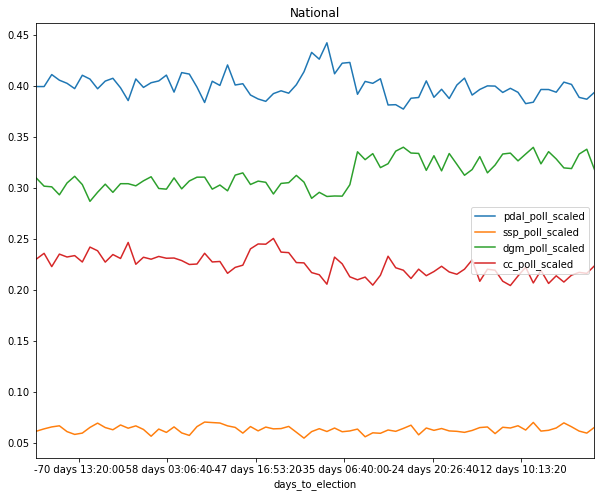

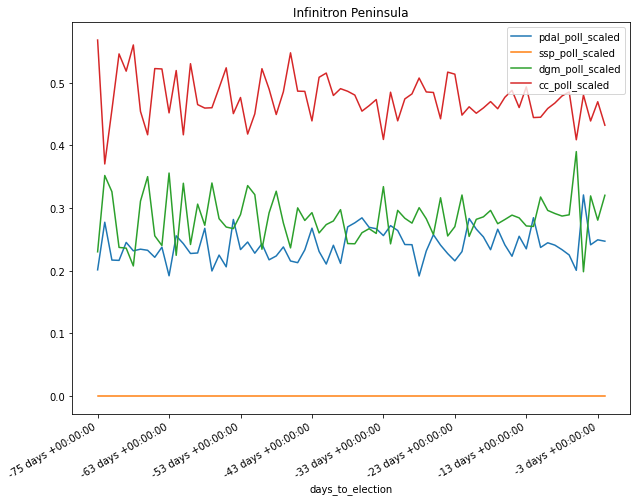

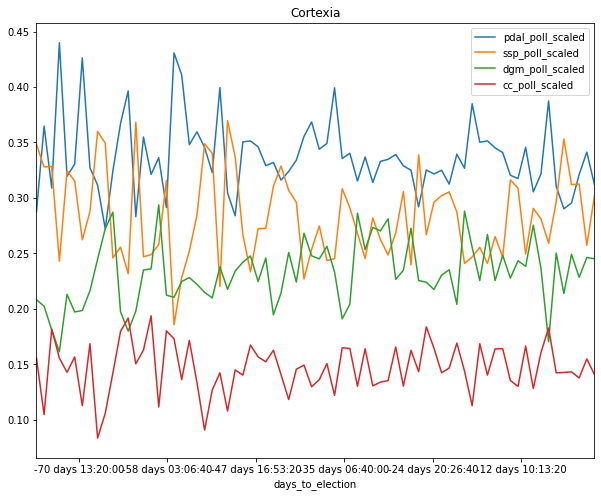

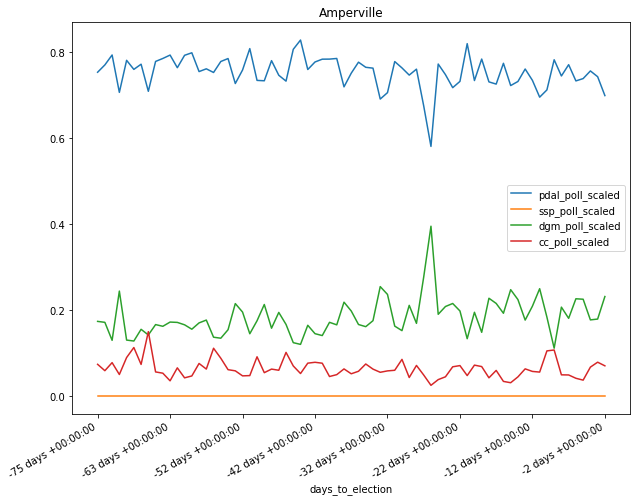

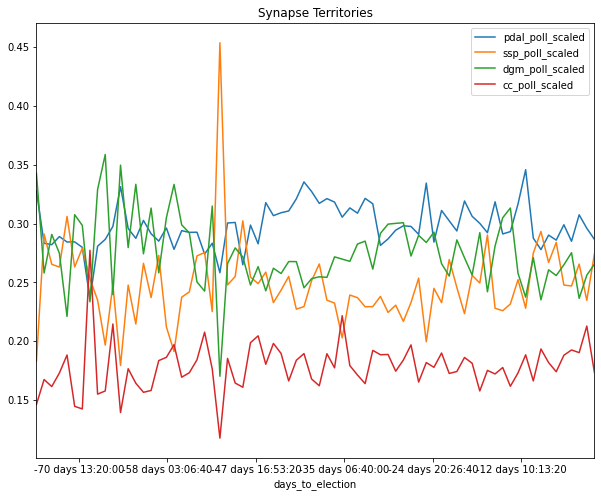

...

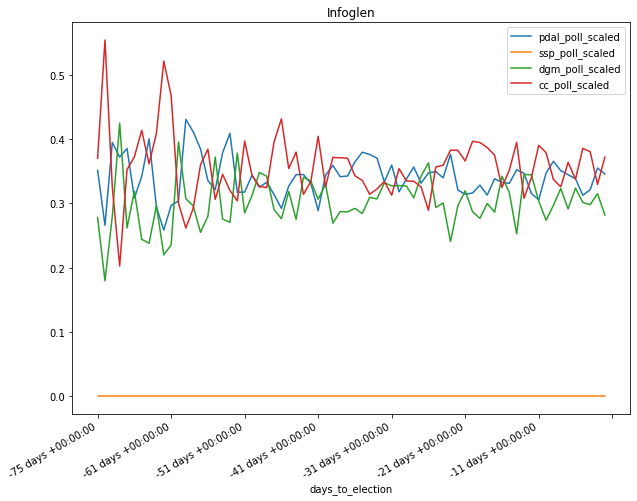

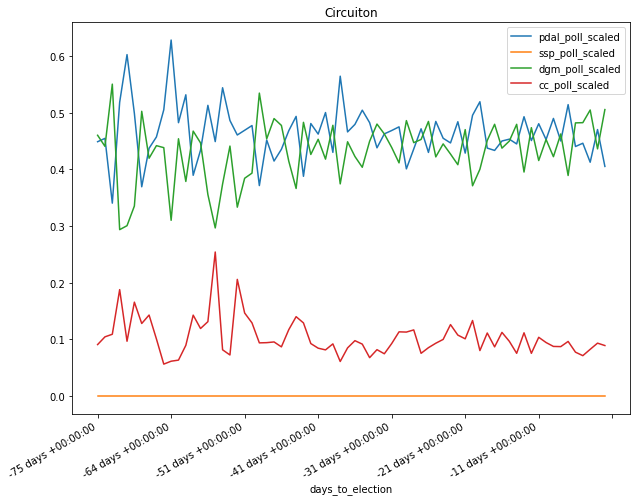

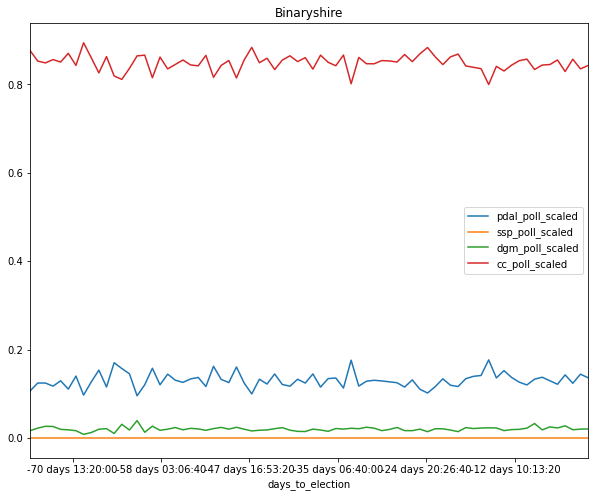

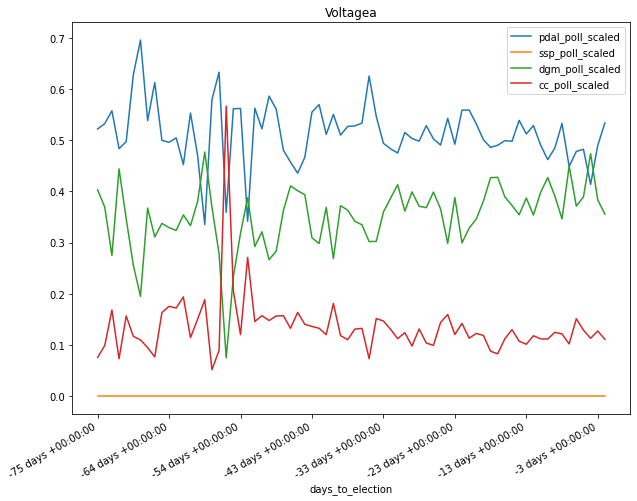

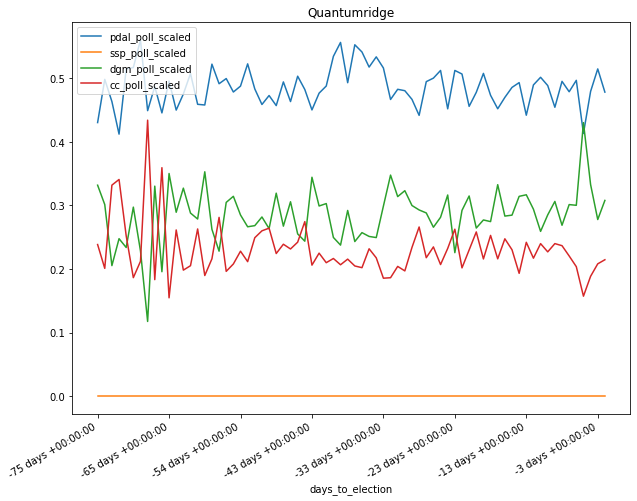

In [896]:
for geo in pollse.geography.unique().tolist():
    ax = pollse[pollse['geography']==geo].groupby('days_to_election')[ppshares_sc].mean()\
        .plot(title=geo,figsize=(10,8))
    
#     tm = pd.to_timedelta('-50 days').total_seconds() / (24*60*60)
#     ax.axvline(tm)
    
    plt.show()

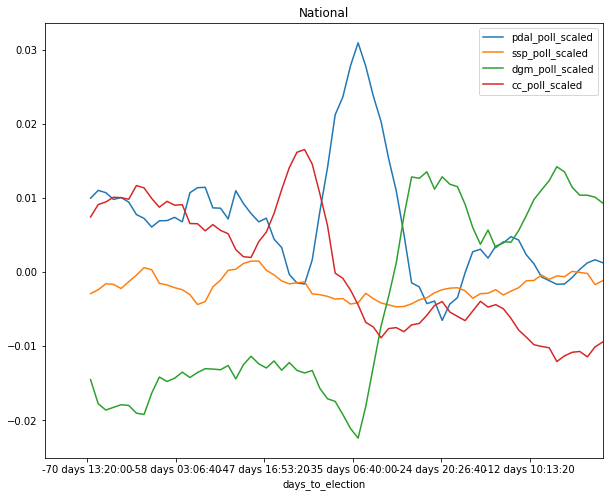

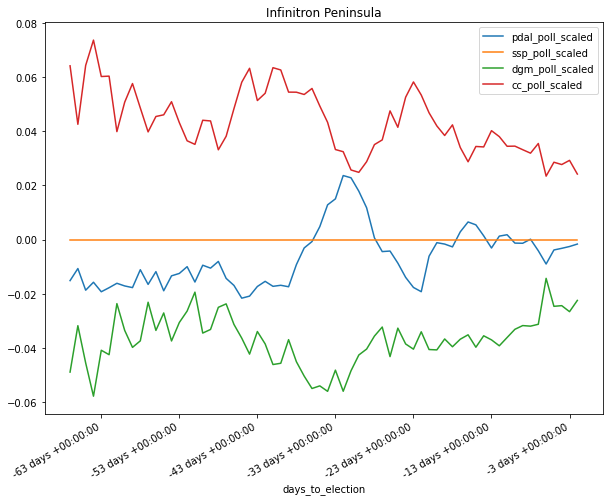

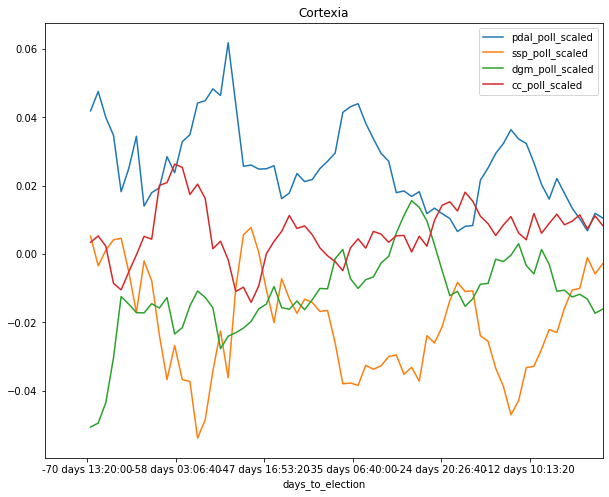

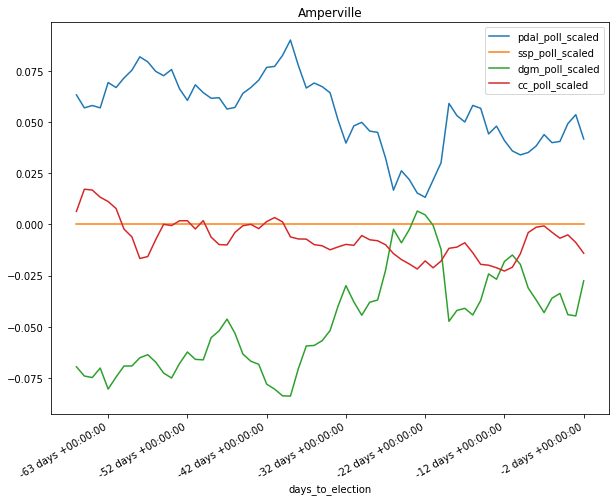

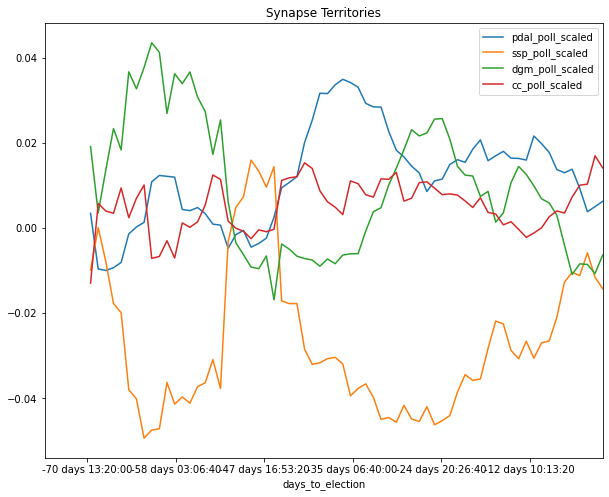

...

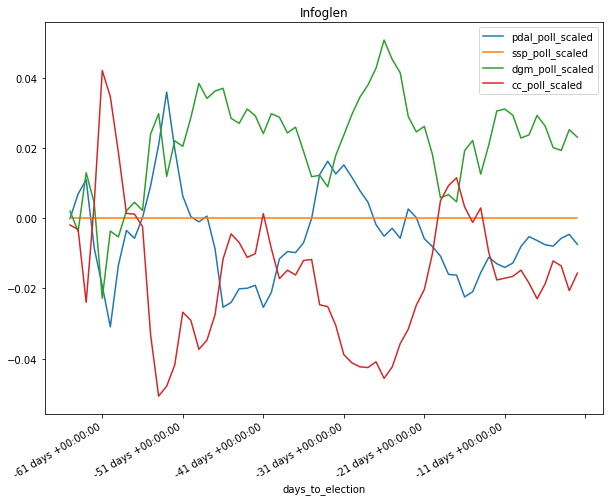

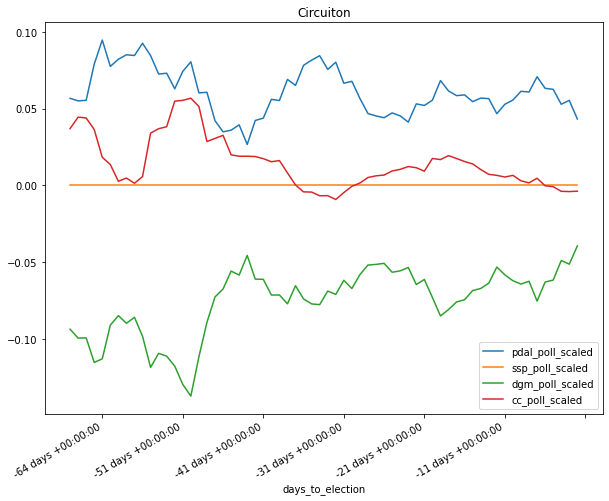

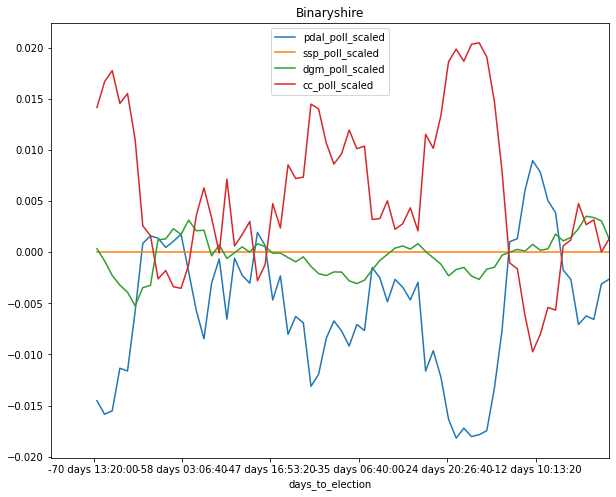

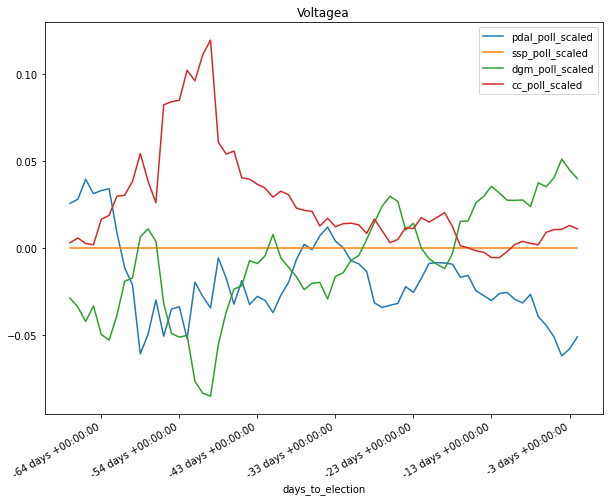

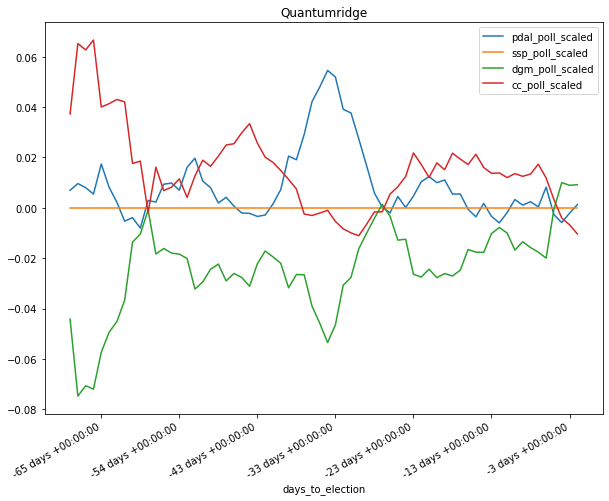

In [898]:
# what kinds of adjustments do we see with respect to the final result?
for geo in pollse.geography.unique():

    # Plot the data
    ax = (pollse[pollse['geography']==geo].groupby('days_to_election')[ppshares_sc].mean() - \
        pollse[pollse['geography']==geo].groupby('days_to_election')[ppshares_sc].mean().iloc[-1])\
        .rolling(7).mean().plot(title=geo,figsize=(10,8))

    # Add vertical lines at x=2 and x=6 with different styles
    # ax.axvline(x=-50, color='r', linestyle='--', label='x=2')
    
    plt.show()

### National polls -- incredibly accurate before election

In [801]:
pollse[(pollse['geography']=='National')&(pollse['days_to_election']>='-2 days')][pshares].mean()

pdal_share    0.393972
ssp_share     0.062953
dgm_share     0.291914
cc_share      0.251161
dtype: float64

In [909]:
aggshares[aggshares['geography']=='National'][pshares].mean()

pdal_share    0.393587
ssp_share     0.062894
dgm_share     0.292359
cc_share      0.251160
dtype: float64

### Write code that will do this:
* For each geography: calculate the average rolling 7-day change for each party after each convention
* As compared to the PREVIOUS 7-day period

# Temporal error

In [928]:
pollse[(pollse['geography']=='National')].groupby('days_to_election')[pdiffs].mean().rolling(30)\
    .mean() #.plot(figsize=(10,8))

,pdal_diff,ssp_diff,dgm_diff,cc_diff
days_to_election,,,,
-75 days,NaN,NaN,NaN,NaN
-74 days,NaN,NaN,NaN,NaN
-73 days,NaN,NaN,NaN,NaN
-72 days,NaN,NaN,NaN,NaN
-71 days,NaN,NaN,NaN,NaN
-70 days,NaN,NaN,NaN,NaN
-69 days,NaN,NaN,NaN,NaN
-68 days,NaN,NaN,NaN,NaN
-67 days,NaN,NaN,NaN,NaN


# Building a polls-based model -- do it separately for each province
* Each poll gets applied for each province's model
    * But they are weighted based on their correlation coefficient (or rather their KNN distance from the province)
    * They are adjusted based on average difference in past performance
* Adding fatter tails on all the variables we care about?
* Open questions
    * Should I be predicting one party per province at a time, or one province per party?
    * Is multi-regressor of random forests going to be good enough?
    * Should models
    * Should KNN be done based on similarity of voting or other attributes?
    * Do you KNN-based weights in the model at all, or should a random forest figure it out?
    * Do you need a pollster rating? If so, do we evaluate based on one metric or many? Based on margin differences or share differences?
    * Do you need to adjust poll values based on bias or error of each individual pollster?
    * You probably want to adjust them based on temporal bias, yeah?
    * What is the best way to run simulations and introduce fatter tails on each of the variables, as compared to the distribution naturally observed in the data?
* Two approaches:
    * Predict outcomes from polls, and then create a meta-model that would create the whole prediction
        * Find a way to combine with fundamentals model
    * Create an adjusted polling average, by adjusting every poll based on historical bias, error, etc. etc., and then adjust the results by combining in some weighted way with a fundamentals model

# Trial of polls-based model -- try just for one province so far
* Make sure to do cross-validation
* Try 4 KNN weighting versions
    * No weights, only that province
    * No weights, all polls
    * Election only
    * Demo only
    * Combination

In [1071]:
pollse.columns

Index(['year', 'date_conducted', 'date_published', 'pollster', 'geography',
       'mode', 'sample_size', 'population_surveyed', 'sponsor',
       'cc_poll_share', 'dgm_poll_share', 'pdal_poll_share', 'ssp_poll_share',
       'undecided_poll_share', 'cc_share', 'dgm_share', 'pdal_share',
       'ssp_share', 'pdal_poll_scaled', 'ssp_poll_scaled', 'dgm_poll_scaled',
       'cc_poll_scaled', 'pdal_diff', 'ssp_diff', 'dgm_diff', 'cc_diff',
       'election_cycle', 'election_day', 'cc_conference_start_date',
       'cc_conference_end_date', 'dgm_conference_start_date',
       'dgm_conference_end_date', 'pdal_conference_start_date',
       'pdal_conference_end_date', 'ssp_conference_start_date',
       'ssp_conference_end_date', 'debate_date_1', 'debate_date_2',
       'debate_date_3', 'days_to_election', 'province', 'region', 'population',
       'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share',
       'electoral_college_votes', 'date', 'year_on_year_gdp_pct_change',
       'u

### Try first just with polls for a particular province

In [1390]:
X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
            # 'sample_size',
X_vars_num = ['dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              #'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             #'pdal_share','cc_share','ssp_share'
             #'dgm_poll_share','dgm_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

run_mult_rf_model(*split_data(pollse[~pollse['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars))

count    2433.000000
mean        0.999828
std         0.015405
min         0.773790
25%         0.996023
50%         1.000099
75%         1.004854
max         1.098623
dtype: float64
Mean squared errors: [2.63578587e-04 2.07773294e-04 2.07259569e-04 5.37307097e-05]
Mean absolute errors: [0.00939622 0.00489161 0.00755992 0.00205772]
Cross-validated scores: [0.9813754  0.98662895 0.97924849 0.98659329 0.98407647 0.98450304
 0.98661353 0.98683203 0.98516011 0.9827218 ]
Mean CV Score: 0.9843753114289481
Standard Deviation of CV Scores: 0.0024450520002196495
                                       dgm_share  pdal_share  cc_share  \
geography_Binaryshire                   0.003575    0.000942  0.124186   
geography_Byteforge Domain              0.011221    0.002570  0.000185   
geography_Cerebrica                     0.001788    0.001899  0.002437   
geography_Circuit Confederation         0.002985    0.002452  0.001835   
geography_Circuiton                     0.048339    0.002108  0.001004

(Index(['geography_Binaryshire', 'geography_Byteforge Domain',
        'geography_Cerebrica', 'geography_Circuit Confederation',
        'geography_Circuiton', 'geography_Cortexia', 'geography_Electropolis',
        'geography_Infinitron Peninsula', 'geography_Infoglen',
        'geography_Metaflux Realm', 'geography_National', 'geography_Neuronia',
        'geography_Quantumridge', 'geography_Synapse Territories',
        'geography_Voltagea', 'pollster_Cobolite Coalition Calling',
        'pollster_Conference Board of Dataland', 'pollster_Dataland Daily',
        'pollster_Dataland Register-Gazette', 'pollster_Electropolis Elects',
        'pollster_Metaflux University', 'pollster_No Province Left Behind',
        'pollster_Progressive Polling', 'pollster_Proudly Paid For Polling',
        'pollster_Synapse Strategies', 'mode_Live caller', 'mode_Online',
        'population_surveyed_LV', 'population_surveyed_RV', 'sponsor_DGM',
        'sponsor_PDAL', 'sponsor_SSP', 'dgm_poll_share',

### Replace with actual results for THAT PROVINCE for that year only

In [1079]:
pollse_electropolis = pollse[(pollse['province']=='Electropolis')&(~pollse['year'].isin(setaside))]

# pollse.drop(pshares,axis=1)\
#     .merge(res[res['province']=='Electropolis'][['year','province']+pshares],on='year',how='left')

X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share' #,
#              'pdal_share','cc_share','ssp_share',
#              'dgm_poll_share','dgm_share'
             ]

run_mult_rf_model(pollse_electropolis,X_vars_cat,X_vars_num,y_vars)

Mean squared errors: [1.27120501e-04 5.75584444e-06 1.31120186e-04 0.00000000e+00]
                                    dgm_share  pdal_share  cc_share  ssp_share
pollster_Dataland Register-Gazette   0.000208    0.000019  0.000032        0.0
pollster_Electropolis Elects         0.000379    0.000214  0.000122        0.0
pollster_Progressive Polling         0.000174    0.000070  0.000115        0.0
pollster_Proudly Paid For Polling    0.000037    0.000061  0.000054        0.0
mode_Live caller                     0.000566    0.000128  0.000815        0.0
mode_Online                          0.000064    0.000015  0.000052        0.0
population_surveyed_LV               0.000198    0.000038  0.000289        0.0
population_surveyed_RV               0.000384    0.000004  0.000351        0.0
sponsor_DGM                          0.000050    0.000025  0.000042        0.0
sponsor_PDAL                         0.000083    0.000095  0.000109        0.0
sample_size                          0.003138   

### Now try the NN model nationwide

In [1430]:
X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              #'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             #'pdal_share','cc_share','ssp_share'
             #'dgm_poll_share','dgm_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

use_data = pollse[~pollse['year'].isin(setaside)]
reserve_data = pollse[pollse['year'].isin(setaside)]

pn = run_nn_model(*split_data(use_data,X_vars_cat,X_vars_num,y_vars))

### Now predict the withheld data!

sa, sb = split_data(reserve_data,X_vars_cat,X_vars_num,y_vars)

#X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

# Predict
predictions_s = pn.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

mses = []
maes = []

# Evaluation overall
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
row_mse = {}
row_mae = {}
row_mse['geography'] = 'overall'
row_mae['geography'] = 'overall'
mse_dict = dict(zip(pshares,mae))
mae_dict = dict(zip(pshares,mae))
row_mse.update(mse_dict)
row_mae.update(mae_dict)
mses.append(row_mse)
maes.append(row_mae)
# print("Mean squared errors overall:",mse)
# print("Mean absolute errors overall:",mae)

# Evaluation by province
for geo in pollse.geography.unique():
    sbsub = sb[sb.index.isin(reserve_data[reserve_data['geography']==geo].index)]
    y_pred_ssub = y_pred_s[y_pred_s.index.isin(reserve_data[reserve_data['geography']==geo].index)]
    mse = mean_squared_error(sbsub, y_pred_ssub, multioutput='raw_values')
    mae = mean_absolute_error(sbsub, y_pred_ssub, multioutput='raw_values')
    row_mse = {}
    row_mae = {}
    row_mse['geography'] = geo
    row_mae['geography'] = geo
    mse_dict = dict(zip(pshares,mae))
    mae_dict = dict(zip(pshares,mae))
    row_mse.update(mse_dict)
    row_mae.update(mae_dict)
    mses.append(row_mse)
    maes.append(row_mae)
#     print(f"Mean squared errors for {geo}: {mse}")
#     print(f"Mean absolute errors for {geo}: {mae}")

# Concatenate the two dataframes side-by-side
comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
comparison_df_s

Epoch 1/50
649/649 [==============================] - 0s 373us/step - loss: 20.3064 - accuracy: 0.4737
Epoch 2/50
649/649 [==============================] - 0s 360us/step - loss: 1.4170 - accuracy: 0.5995
Epoch 3/50
649/649 [==============================] - 0s 359us/step - loss: 1.4272 - accuracy: 0.6171
Epoch 4/50
649/649 [==============================] - 0s 361us/step - loss: 1.4020 - accuracy: 0.6142
Epoch 5/50
649/649 [==============================] - 0s 363us/step - loss: 1.4365 - accuracy: 0.6037
Epoch 6/50
649/649 [==============================] - 0s 358us/step - loss: 1.3833 - accuracy: 0.6441
Epoch 7/50
649/649 [==============================] - 0s 357us/step - loss: 1.3756 - accuracy: 0.6422
Epoch 8/50
649/649 [==============================] - 0s 358us/step - loss: 1.3798 - accuracy: 0.6404
Epoch 9/50
649/649 [==============================] - 0s 362us/step - loss: 1.4281 - accuracy: 0.6177
Epoch 10/50
649/649 [==============================] - 0s 380us/step - loss: 1.40

,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred
762,0.307150,0.417803,0.207158,0.067890,0.299905,0.417188,2.356016e-01,0.047306
763,0.307150,0.417803,0.207158,0.067890,0.307544,0.420160,2.211263e-01,0.051170
764,0.307150,0.417803,0.207158,0.067890,0.839460,0.121669,1.135261e-12,0.038871
765,0.307150,0.417803,0.207158,0.067890,0.305127,0.418593,2.263108e-01,0.049969
766,0.307150,0.417803,0.207158,0.067890,0.307537,0.421694,2.194401e-01,0.051329
...,...,...,...,...,...,...,...,...
8603,0.285819,0.365479,0.348702,0.000000,0.317920,0.603261,5.293680e-02,0.025883
8604,0.339072,0.394930,0.226118,0.039880,0.465247,0.440618,6.472774e-03,0.087662
8605,0.339072,0.394930,0.226118,0.039880,0.837024,0.100999,6.304189e-13,0.061977
8606,0.320498,0.327389,0.192593,0.159521,0.499946,0.237627,1.219692e-02,0.250229


In [1432]:
pollse

,year,date_conducted,date_published,pollster,geography,mode,sample_size,population_surveyed,sponsor,cc_poll_share,dgm_poll_share,pdal_poll_share,ssp_poll_share,undecided_poll_share,cc_share,dgm_share,pdal_share,ssp_share,pdal_poll_scaled,ssp_poll_scaled,dgm_poll_scaled,cc_poll_scaled,pdal_diff,ssp_diff,dgm_diff,cc_diff,election_cycle,election_day,cc_conference_start_date,cc_conference_end_date,dgm_conference_start_date,dgm_conference_end_date,pdal_conference_start_date,pdal_conference_end_date,ssp_conference_start_date,ssp_conference_end_date,debate_date_1,debate_date_2,debate_date_3,days_to_election,province,region,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes,date,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
0,1984,1984-04-03,1984-04-04,Dataland Daily,National,Online,200,Adults,NaN,0.125,0.190,0.415,0.065,0.205,0.241317,0.274289,0.399550,0.084844,0.522013,0.081761,0.238994,0.157233,0.122463,-0.003083,-0.035296,-0.084084,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
1,1984,1984-04-05,1984-04-06,No Province Left Behind,Infinitron Peninsula,IVR,500,RV,NaN,0.418,0.262,0.200,0.000,0.120,0.443475,0.296444,0.260081,0.000000,0.227273,0.000000,0.297727,0.475000,-0.032808,0.000000,0.001283,0.031525,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,Infinitron Peninsula,Metaflux Realm,200000.0,0.167412,0.439659,0.392929,7.0,1984-03-31,0.048,0.054,0.035,0.408
2,1984,1984-04-04,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.180,0.240,0.340,0.070,0.170,0.241317,0.274289,0.399550,0.084844,0.409639,0.084337,0.289157,0.216867,0.010089,-0.000507,0.014867,-0.024449,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
3,1984,1984-04-05,1984-04-06,Dataland Daily,National,Online,200,Adults,NaN,0.150,0.255,0.285,0.080,0.230,0.241317,0.274289,0.399550,0.084844,0.370130,0.103896,0.331169,0.194805,-0.029420,0.019052,0.056879,-0.046512,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984-03-31,0.048,0.054,0.035,0.408
4,1984,1984-04-05,1984-04-07,Progressive Polling,Cortexia,Live caller,1000,Adults,NaN,0.121,0.155,0.216,0.383,0.125,0.145292,0.175291,0.270709,0.408708,0.246857,0.437714,0.177143,0.138286,-0.023852,0.029006,0.001852,-0.007007,1984,1984-06-17,1984-04-28,1984-04-30,1984-05-12,1984-05-14,1984-05-05,1984-05-07,1984-04-21,1984-04-23,1984-05-18,1984-05-28,1984-06-07,-73,Cortexia,Synapse Territories,1400000.0,0.592846,0.170363,0.236791,19.0,1984-03-31,0.048,0.054,0.035,0.408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,2023,2023-06-16,2023-06-18,Metaflux University,Infinitron Peninsula,IVR,1500,RV,NaN,0.417,0.323,0.203,0.000,0.057,0.423952,0.330976,0.245072,0.000000,0.215270,0.000000,0.342524,0.442206,-0.029802,0.000000,0.011547,0.018254,2023,2023-06-18,2023-04-29,2023-05-01,2023-05-13,2023-05-15,2023-05-06,2023-05-08,2023-04-22,2023-04-24,2023-05-19,2023-05-29,2023-06-08,-2,Infinitron Peninsula,Metaflux Realm,200000.0,0.167412,0.439659,0.392929,7.0,2023-03-31,0.018,0.041,0.067,-0.014
10123,2023,2023-06-16,2023-06-18,Dataland Register-Gazette,National,Live caller,1500,LV,NaN,0.213,0.287,0.402,0.064,0.033,0.239873,0.305637,0.381032,0.073457,0.416149,0.066253,0.297101,0.220497,0.035117,-0.007204,-0.008536,-0.019376,2023,2023-06-18,2023-04-29,2023-05-01,202

In [1431]:
pd.DataFrame(maes)

,geography,pdal_share,ssp_share,dgm_share,cc_share
0,overall,0.121388,0.117621,0.190079,0.032239
1,National,0.066521,0.059258,0.088768,0.012425
2,Infinitron Peninsula,0.187819,0.166193,0.411626,0.057615
3,Cortexia,0.248181,0.096881,0.145134,0.033192
4,Amperville,0.078668,0.083562,0.030407,0.037498
5,Synapse Territories,0.333527,0.136277,0.184666,0.043516
6,Circuit Confederation,0.163724,0.148038,0.187568,0.043672
7,Byteforge Domain,0.072001,0.298449,0.375484,0.005034
8,Cerebrica,0.188622,0.044151,0.269582,0.039357
9,Electropolis,0.066524,0.134490,0.255117,0.067258


### Try NN model -- but just province-wise for similar geographies

In [1383]:
X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              #'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             #'pdal_share','cc_share','ssp_share'
             #'dgm_poll_share','dgm_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

prov_maes = []
shaps = []

for row in demo.drop_duplicates(subset=['province','region']).itertuples():
    print(row.province, row.region)
    # sub = pollse[(pollse['geography'].isin([row.province]))]
                                            # ,row.region,'National']))]
    
    # replace the region/ national "actuals" with province-wise "actuals" so model learns province-wise target
    sub = pollse.drop(pshares,axis=1)\
        .merge(res_ee[res_ee['province']==row.province][['year']+pshares],on='year',how='left')
    
    pn = run_nn_model(*split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars))
    
#     ### Tell me which features matter
    
#     # Assuming you already have a trained Keras model named 'model' and data X_train
#     # Initialize the explainer
#     explainer = shap.DeepExplainer(pn, X_train)

#     # Compute SHAP values for a set of samples (e.g., X_test)
#     shap_values = explainer.shap_values(X_test)

#     # Visualize the first prediction's explanation for a multi-output model
#     shap.initjs() # Required for visual rendering
#     shap.force_plot(explainer.expected_value[0], shap_values[0][0], X_test[0])

#     # Summary plot to show feature importance and directionality of effects
#     shap.summary_plot(shap_values, X_test)
    
    ### Now predict the withheld data!

    sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

    #X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

    # Predict
    predictions_s = pn.predict(sa)

    y_pred_s = pd.DataFrame(predictions_s)
    y_pred_s.columns = [col + "_pred" for col in sb.columns]
    y_pred_s.index = sb.index

    # y_pred range gut check
    print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

    # Evaluation
    mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
    mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)
    
    prov_e = {}
    prov_e['province'] = row.province
    prov_e['region'] = row.region
    mae_dict = dict(zip(pshares,mae))
    prov_e.update(mae_dict)
    prov_e['polls_trained_on'] = len(sub[(~sub['year'].isin(setaside))])
    prov_maes.append(prov_e)

    # Concatenate the two dataframes side-by-side
    comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
    print(comparison_df_s)
    print("--------")

Amperville Circuit Confederation
Epoch 1/50
649/649 [==============================] - 0s 362us/step - loss: 71.0566 - accuracy: 0.7034
Epoch 2/50
649/649 [==============================] - 0s 382us/step - loss: 1.1928 - accuracy: 0.9070
Epoch 3/50
649/649 [==============================] - 0s 366us/step - loss: 1.2016 - accuracy: 0.9215
Epoch 4/50
649/649 [==============================] - 0s 365us/step - loss: 1.0663 - accuracy: 0.9400
Epoch 5/50
649/649 [==============================] - 0s 364us/step - loss: 1.1907 - accuracy: 0.9325
Epoch 6/50
649/649 [==============================] - 0s 356us/step - loss: 1.0376 - accuracy: 0.9300
Epoch 7/50
649/649 [==============================] - 0s 487us/step - loss: 1.1401 - accuracy: 0.9297
Epoch 8/50
649/649 [==============================] - 0s 383us/step - loss: 1.0708 - accuracy: 0.9351
Epoch 9/50
649/649 [==============================] - 0s 365us/step - loss: 1.1012 - accuracy: 0.9417
Epoch 10/50
649/649 [===========================

AttributeError: 'tuple' object has no attribute 'as_list'

In [1361]:
# province, region, national, with their own targets
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share
0,Amperville,Circuit Confederation,0.117204,0.124005,0.053128,0.015811
4,Circuiton,Circuit Confederation,0.067036,0.122384,0.083809,0.021458
6,Electropolis,Circuit Confederation,0.207279,0.131243,0.081619,0.017153
11,Voltagea,Circuit Confederation,0.106027,0.088978,0.041153,0.012223
1,Binaryshire,Metaflux Realm,0.102420,0.105430,0.164258,0.014123
2,Byteforge Domain,Metaflux Realm,0.098311,0.053136,0.088063,0.014707
7,Infinitron Peninsula,Metaflux Realm,0.124691,0.133335,0.144859,0.022296
8,Infoglen,Metaflux Realm,0.164177,0.085997,0.093940,0.014931
10,Quantumridge,Metaflux Realm,0.083492,0.064518,0.134552,0.029156
3,Cerebrica,Synapse Territories,0.079512,0.234984,0.126596,0.057986


In [1364]:
# province only
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share
0,Amperville,Circuit Confederation,0.055660,0.052668,0.048577,1.412775e-38
4,Circuiton,Circuit Confederation,0.068373,0.060939,0.034551,5.413093e-11
6,Electropolis,Circuit Confederation,0.100306,0.053118,0.075574,0.000000e+00
11,Voltagea,Circuit Confederation,0.075279,0.059970,0.045120,6.716519e-03
1,Binaryshire,Metaflux Realm,0.023779,0.018574,0.034492,0.000000e+00
2,Byteforge Domain,Metaflux Realm,0.019936,0.059581,0.065274,2.500957e-06
7,Infinitron Peninsula,Metaflux Realm,0.080805,0.041176,0.061496,7.723736e-07
8,Infoglen,Metaflux Realm,0.035701,0.033641,0.051126,5.292415e-12
10,Quantumridge,Metaflux Realm,0.113584,0.063440,0.175425,0.000000e+00
3,Cerebrica,Synapse Territories,0.031818,0.038403,0.031638,4.123303e-02


In [1377]:
# province only
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share,polls_trained_on
0,Amperville,Circuit Confederation,0.057935,0.055598,0.039772,0.000000e+00,192
4,Circuiton,Circuit Confederation,0.059790,0.045589,0.031195,0.000000e+00,285
6,Electropolis,Circuit Confederation,0.077684,0.037127,0.088156,9.778643e-06,413
11,Voltagea,Circuit Confederation,0.100732,0.103336,0.055561,3.094980e-04,250
1,Binaryshire,Metaflux Realm,0.055812,0.121266,0.140770,4.899360e-04,293
2,Byteforge Domain,Metaflux Realm,0.030112,0.029215,0.042781,9.328408e-11,393
7,Infinitron Peninsula,Metaflux Realm,0.053882,0.041581,0.050423,1.688862e-05,283
8,Infoglen,Metaflux Realm,0.050969,0.040382,0.049776,8.284290e-16,360
10,Quantumridge,Metaflux Realm,0.100593,0.053496,0.063909,1.186924e-06,286
3,Cerebrica,Synapse Territories,0.029550,0.034975,0.032611,2.005752e-02,395


In [1375]:
# province, region, and national, with province targets
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share,polls_trained_on
0,Amperville,Circuit Confederation,0.076068,0.065706,0.032164,1.225817e-13,3420
4,Circuiton,Circuit Confederation,0.145239,0.098040,0.059968,1.874620e-15,3513
6,Electropolis,Circuit Confederation,0.157211,0.082178,0.215919,7.856928e-07,3641
11,Voltagea,Circuit Confederation,0.136523,0.166158,0.056937,4.426494e-07,3478
1,Binaryshire,Metaflux Realm,0.009505,0.024005,0.029884,7.951259e-14,3620
2,Byteforge Domain,Metaflux Realm,0.019767,0.070037,0.079723,3.439475e-05,3720
7,Infinitron Peninsula,Metaflux Realm,0.031449,0.066629,0.079040,1.208026e-10,3610
8,Infoglen,Metaflux Realm,0.046814,0.056128,0.060129,7.696278e-12,3687
10,Quantumridge,Metaflux Realm,0.113603,0.160649,0.066607,1.865312e-12,3613
3,Cerebrica,Synapse Territories,0.109680,0.295755,0.150837,4.119617e-02,3758


In [1379]:
# all polls, with province-specific targets
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share,polls_trained_on
0,Amperville,Circuit Confederation,0.077705,0.087209,0.022112,6.659105e-12,8109
4,Circuiton,Circuit Confederation,0.086019,0.122354,0.077384,2.885561e-11,8109
6,Electropolis,Circuit Confederation,0.110441,0.077366,0.073149,4.721064e-11,8109
11,Voltagea,Circuit Confederation,0.081235,0.073905,0.110396,2.252350e-11,8109
1,Binaryshire,Metaflux Realm,0.016628,0.095668,0.112288,1.447173e-10,8109
2,Byteforge Domain,Metaflux Realm,0.353492,0.334743,0.095188,4.744326e-13,8109
7,Infinitron Peninsula,Metaflux Realm,0.163130,0.096645,0.227838,8.039370e-12,8109
8,Infoglen,Metaflux Realm,0.214411,0.153835,0.366991,1.125860e-11,8109
10,Quantumridge,Metaflux Realm,0.178690,0.297882,0.120882,9.652525e-11,8109
3,Cerebrica,Synapse Territories,0.045023,0.107796,0.075727,1.729285e-02,8109


In [1405]:
comparison_df_s

,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred
762,0.307150,0.417803,0.207158,0.067890,0.273502,0.374759,0.329135,2.260372e-02
763,0.307150,0.417803,0.207158,0.067890,0.294380,0.381974,0.302106,2.154022e-02
764,0.307150,0.417803,0.207158,0.067890,0.014704,0.936719,0.048577,1.244116e-32
765,0.307150,0.417803,0.207158,0.067890,0.276602,0.382226,0.317131,2.404083e-02
766,0.307150,0.417803,0.207158,0.067890,0.290536,0.386351,0.301028,2.208412e-02
...,...,...,...,...,...,...,...,...
8603,0.285819,0.365479,0.348702,0.000000,0.180976,0.349580,0.469436,8.105574e-06
8604,0.339072,0.394930,0.226118,0.039880,0.230436,0.512556,0.257007,1.312164e-06
8605,0.339072,0.394930,0.226118,0.039880,0.015326,0.955374,0.029301,8.316015e-33
8606,0.320498,0.327389,0.192593,0.159521,0.320812,0.433363,0.245456,3.681621e-04


In [1406]:
# compare province-only models to nationally-trained model

# maes by province nationwide
comparison_df_s.merge(pollse['geography'],left_index=True,right_index=True,how='left')\
    .groupby('geography')[comparison_df_s.columns]

,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred
geography,,,,,,,,
Amperville,0.223817,0.727681,0.048502,0.000000,0.219857,0.689465,0.090516,0.000162
Binaryshire,0.021142,0.126847,0.852012,0.000000,0.009955,0.067234,0.922738,0.000073
Byteforge Domain,0.109615,0.480268,0.410117,0.000000,0.068485,0.480288,0.451222,0.000005
Cerebrica,0.318115,0.314596,0.292178,0.075111,0.258897,0.376733,0.364314,0.000056
Circuit Confederation,0.358652,0.448032,0.193316,0.000000,0.214532,0.659725,0.125742,0.000001
Circuiton,0.485886,0.415379,0.098735,0.000000,0.404663,0.500082,0.095253,0.000002
Cortexia,0.247284,0.320577,0.152421,0.279717,0.266114,0.479716,0.253714,0.000456
Electropolis,0.385397,0.332252,0.282351,0.000000,0.308036,0.366845,0.325115,0.000004
Infinitron Peninsula,0.287377,0.239329,0.473294,0.000000,0.207528,0.216342,0.576098,0.000032


# Try all the above with the original RF models

In [1440]:
X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              #'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             #'pdal_share','cc_share','ssp_share'
             #'dgm_poll_share','dgm_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

prov_maes = []

for row in demo.drop_duplicates(subset=['province','region']).itertuples():
    print(row.province, row.region)
    # sub = pollse[(pollse['geography'].isin([row.province]))]
                                            # ,row.region,'National']))]
    
    # replace the region/ national "actuals" with province-wise "actuals" so model learns province-wise target
    sub = pollse.drop(pshares,axis=1)\
        .merge(res_ee[res_ee['province']==row.province][['year']+pshares],on='year',how='left')
    
    cols, mrf = run_mult_rf_model(*split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars))
    
    print(len(sub[(~sub['year'].isin(setaside))]))
    
    ### Now predict the withheld data!

    sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

    #X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

    # Predict
    predictions_s = mrf.predict(sa)

    y_pred_s = pd.DataFrame(predictions_s)
    y_pred_s.columns = [col + "_pred" for col in sb.columns]
    y_pred_s.index = sb.index

    # y_pred range gut check
    print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

    # Evaluation
    mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
    mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)
    
    prov_e = {}
    prov_e['province'] = row.province
    prov_e['region'] = row.region
    mae_dict = dict(zip(pshares,mae))
    prov_e.update(mae_dict)
    prov_e['polls_trained_on'] = len(sub[(~sub['year'].isin(setaside))])
    prov_maes.append(prov_e)

    # Concatenate the two dataframes side-by-side
    comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
    print(comparison_df_s)
    print("--------")

Amperville Circuit Confederation
count    2433.000000
mean        1.000035
std         0.001071
min         0.999079
25%         1.000000
50%         1.000000
75%         1.000000
max         1.036215
dtype: float64
Mean squared errors: [1.28336194e-06 6.49940472e-09 1.11080118e-09 0.00000000e+00]
Mean absolute errors: [3.93168227e-05 3.23365926e-06 1.05655148e-06 0.00000000e+00]
Cross-validated scores: [0.9999031  0.99983863 0.99909038 0.9999772  0.9999757  0.99868802
 0.99999972 0.99999997 0.99995539 0.99992835]
Mean CV Score: 0.999735644990025
Standard Deviation of CV Scores: 0.0004351478359771859
                                          dgm_share    pdal_share  \
geography_Binaryshire                  0.000000e+00  4.383014e-15   
geography_Byteforge Domain             7.790400e-17  3.379669e-15   
geography_Cerebrica                    0.000000e+00  3.838289e-15   
geography_Circuit Confederation        6.797771e-16  5.673720e-15   
geography_Circuiton                    3.040282

count    2433.000000
mean        0.999995
std         0.000184
min         0.993629
25%         1.000000
50%         1.000000
75%         1.000000
max         1.001274
dtype: float64
Mean squared errors: [3.30769864e-08 4.91108788e-07 4.94199047e-07 0.00000000e+00]
Mean absolute errors: [5.78614468e-06 2.02483022e-05 2.03696035e-05 0.00000000e+00]
Cross-validated scores: [1.         0.99985665 0.99999051 0.99999997 0.99999999 0.99986941
 0.99999998 1.         0.99999994 0.99997132]
Mean CV Score: 0.9999687783460441
Standard Deviation of CV Scores: 5.363403878757538e-05
                                          dgm_share    pdal_share  \
geography_Binaryshire                  0.000000e+00  0.000000e+00   
geography_Byteforge Domain             0.000000e+00  0.000000e+00   
geography_Cerebrica                    0.000000e+00  1.754374e-16   
geography_Circuit Confederation        0.000000e+00  0.000000e+00   
geography_Circuiton                    0.000000e+00  0.000000e+00   
geography_

count    2433.000000
mean        0.999971
std         0.000882
min         0.969629
25%         1.000000
50%         1.000000
75%         1.000000
max         1.002017
dtype: float64
Mean squared errors: [1.96680796e-09 2.82488472e-08 8.49332062e-07 0.00000000e+00]
Mean absolute errors: [1.33378507e-06 5.87384733e-06 3.23621870e-05 0.00000000e+00]
Cross-validated scores: [0.99996818 0.99924854 0.99983207 0.9999953  0.99997485 0.99931161
 0.99999864 0.99999955 0.99999919 0.99937053]
Mean CV Score: 0.9997698458306152
Standard Deviation of CV Scores: 0.00030577174175938887
                                          dgm_share    pdal_share  \
geography_Binaryshire                  0.000000e+00  1.137421e-16   
geography_Byteforge Domain             0.000000e+00  5.727457e-16   
geography_Cerebrica                    0.000000e+00  4.134858e-15   
geography_Circuit Confederation        0.000000e+00 -2.592780e-17   
geography_Circuiton                    0.000000e+00  7.711035e-15   
geography

count    2433.000000
mean        1.000005
std         0.000510
min         0.995958
25%         1.000000
50%         1.000000
75%         1.000000
max         1.017660
dtype: float64
Mean squared errors: [1.22083529e-07 2.70736939e-08 6.82137863e-07 6.66093743e-07]
Mean absolute errors: [1.89704121e-05 5.03575641e-06 2.54533002e-05 2.45908436e-05]
Cross-validated scores: [0.9999969  0.9996706  0.9999333  0.99999958 0.99999965 0.9994371
 0.99999665 0.99971535 0.9999942  0.99993745]
Mean CV Score: 0.9998680794447035
Standard Deviation of CV Scores: 0.00018460058843545828
                                          dgm_share    pdal_share  \
geography_Binaryshire                  7.361768e-16  1.676226e-14   
geography_Byteforge Domain             1.694840e-16  8.396059e-15   
geography_Cerebrica                    3.058844e-16  8.059987e-15   
geography_Circuit Confederation        2.382431e-15  1.806631e-14   
geography_Circuiton                    1.532935e-06  8.305005e-15   
geography_

count    2433.000000
mean        0.999989
std         0.000388
min         0.989093
25%         1.000000
50%         1.000000
75%         1.000000
max         1.007727
dtype: float64
Mean squared errors: [5.76344752e-07 2.99598292e-09 1.12719687e-06 0.00000000e+00]
Mean absolute errors: [3.01195606e-05 2.58020741e-06 3.13920054e-05 0.00000000e+00]
Cross-validated scores: [0.99997303 0.99979406 0.99965441 0.9999978  0.99999539 0.99944191
 1.         0.99999669 0.99999566 0.99989791]
Mean CV Score: 0.9998746850695129
Standard Deviation of CV Scores: 0.00018096425744652334
                                          dgm_share    pdal_share  \
geography_Binaryshire                  1.730659e-15  1.229940e-16   
geography_Byteforge Domain             1.597109e-15  7.170267e-16   
geography_Cerebrica                    1.660947e-16  2.447402e-16   
geography_Circuit Confederation        9.138667e-16  1.224746e-15   
geography_Circuiton                    1.040551e-15  7.041127e-16   
geography

count    2433.000000
mean        1.000034
std         0.001154
min         0.996207
25%         1.000000
50%         1.000000
75%         1.000000
max         1.040019
dtype: float64
Mean squared errors: [2.16676752e-06 1.02612633e-06 4.59442282e-08 1.25887809e-06]
Mean absolute errors: [4.62463134e-05 3.13803247e-05 7.94773178e-06 3.28101398e-05]
Cross-validated scores: [0.9999583  0.99953627 0.99975574 0.99999835 0.99999961 0.99958744
 0.99999883 0.99999661 0.999983   0.99935291]
Mean CV Score: 0.9998167051376772
Standard Deviation of CV Scores: 0.0002301542303827739
                                          dgm_share    pdal_share  \
geography_Binaryshire                 -1.294287e-18  1.859764e-15   
geography_Byteforge Domain             2.687514e-15  1.053366e-15   
geography_Cerebrica                    5.002254e-16  1.553235e-15   
geography_Circuit Confederation        2.130152e-16  6.359759e-16   
geography_Circuiton                    6.098099e-16  2.968367e-15   
geography_

count    2433.000000
mean        1.000060
std         0.002102
min         0.997096
25%         1.000000
50%         1.000000
75%         1.000000
max         1.072617
dtype: float64
Mean squared errors: [2.85403755e-06 8.55386321e-07 2.42435764e-07 0.00000000e+00]
Mean absolute errors: [5.98522981e-05 2.78435753e-05 1.61719103e-05 0.00000000e+00]
Cross-validated scores: [0.99999572 0.99978918 0.99978139 0.99999234 0.9999928  0.99934292
 0.99999977 1.         0.9999978  0.99994804]
Mean CV Score: 0.9998839952235373
Standard Deviation of CV Scores: 0.00019805442676882427
                                          dgm_share    pdal_share  \
geography_Binaryshire                  1.010598e-15  9.043647e-16   
geography_Byteforge Domain             8.596444e-16  2.119428e-16   
geography_Cerebrica                    1.944906e-15  3.411494e-16   
geography_Circuit Confederation        1.349181e-15  1.885422e-15   
geography_Circuiton                    6.046079e-16  9.534357e-16   
geography

count    2433.000000
mean        0.999978
std         0.000772
min         0.974098
25%         1.000000
50%         1.000000
75%         1.000000
max         1.004216
dtype: float64
Mean squared errors: [4.78282049e-07 1.09103349e-07 2.97184859e-06 0.00000000e+00]
Mean absolute errors: [2.72667272e-05 1.31606870e-05 5.22265040e-05 0.00000000e+00]
Cross-validated scores: [0.99999895 0.99878438 0.99998974 0.99999755 0.99999976 0.99997447
 0.99998836 1.         0.99999994 0.99826101]
Mean CV Score: 0.9996994149646072
Standard Deviation of CV Scores: 0.000599934155720553
                                          dgm_share    pdal_share  \
geography_Binaryshire                  1.654853e-16  9.780518e-16   
geography_Byteforge Domain             1.570643e-16  6.453665e-15   
geography_Cerebrica                    1.579388e-15  1.968556e-16   
geography_Circuit Confederation        3.290125e-16  8.000184e-15   
geography_Circuiton                    6.533608e-16  3.078160e-07   
geography_C

count    2433.000000
mean        1.000049
std         0.001656
min         0.997751
25%         1.000000
50%         1.000000
75%         1.000000
max         1.057208
dtype: float64
Mean squared errors: [6.89428956e-08 1.51005693e-08 2.78289981e-06 0.00000000e+00]
Mean absolute errors: [9.13671043e-06 5.79834717e-06 4.79070520e-05 0.00000000e+00]
Cross-validated scores: [0.99999925 0.99959708 0.99990505 0.99999472 0.99999708 0.99972369
 0.99999893 1.         0.99999813 0.99971318]
Mean CV Score: 0.9998927112018976
Standard Deviation of CV Scores: 0.00014659703758486837
                                          dgm_share    pdal_share  \
geography_Binaryshire                  3.712487e-16  2.230559e-16   
geography_Byteforge Domain             4.236521e-16  1.532049e-14   
geography_Cerebrica                    2.453182e-16  2.101777e-15   
geography_Circuit Confederation        4.648067e-16  1.193067e-14   
geography_Circuiton                    1.304091e-15  2.172577e-15   
geography

count    2433.000000
mean        0.999937
std         0.002051
min         0.928759
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000606
dtype: float64
Mean squared errors: [3.94110099e-06 3.04325975e-09 6.21141816e-10 1.65409633e-05]
Mean absolute errors: [5.70788886e-05 2.28367228e-06 7.22336303e-07 1.21425975e-04]
Cross-validated scores: [0.99999665 0.99871739 0.99967194 0.99998991 0.99999114 0.99947493
 0.9999996  0.99999338 0.99999441 0.99912737]
Mean CV Score: 0.9996956712721612
Standard Deviation of CV Scores: 0.00043174022408898013
                                          dgm_share    pdal_share  \
geography_Binaryshire                  4.034838e-17  1.526537e-16   
geography_Byteforge Domain             1.629135e-16  4.113253e-16   
geography_Cerebrica                    0.000000e+00  0.000000e+00   
geography_Circuit Confederation        1.896193e-16  0.000000e+00   
geography_Circuiton                    1.588363e-16  0.000000e+00   
geography

count    2433.000000
mean        0.999989
std         0.000668
min         0.976813
25%         1.000000
50%         1.000000
75%         1.000000
max         1.015911
dtype: float64
Mean squared errors: [3.81768470e-07 1.33197917e-10 1.09710086e-06 0.00000000e+00]
Mean absolute errors: [2.22612262e-05 3.79781493e-07 3.26571173e-05 0.00000000e+00]
Cross-validated scores: [0.99997977 0.9988864  0.99981077 0.99999999 0.99999946 0.99917322
 0.99999495 0.99999224 0.99999429 0.99954378]
Mean CV Score: 0.9997374867865816
Standard Deviation of CV Scores: 0.0003845794593426598
                                          dgm_share    pdal_share  \
geography_Binaryshire                  6.046463e-18  5.026539e-15   
geography_Byteforge Domain             2.670665e-16  6.393650e-15   
geography_Cerebrica                    7.398394e-17  5.470145e-15   
geography_Circuit Confederation        4.621224e-16  2.808381e-15   
geography_Circuiton                    2.028145e-16  9.656531e-16   
geography_

count    2433.000000
mean        0.999963
std         0.001160
min         0.959727
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000441
dtype: float64
Mean squared errors: [2.65537133e-07 2.02120807e-08 3.16614890e-06 0.00000000e+00]
Mean absolute errors: [2.08691297e-05 5.06543146e-06 5.26196458e-05 0.00000000e+00]
Cross-validated scores: [0.99996206 0.9999465  0.99936963 0.99999653 0.99999678 0.99913294
 0.99999857 1.         0.99999981 0.99992146]
Mean CV Score: 0.9998324289601243
Standard Deviation of CV Scores: 0.000296453017332135
                                          dgm_share    pdal_share  \
geography_Binaryshire                  1.998834e-16  1.918513e-16   
geography_Byteforge Domain             9.209991e-17  1.421201e-15   
geography_Cerebrica                    2.725495e-16  1.854560e-15   
geography_Circuit Confederation        5.896918e-17  1.120703e-15   
geography_Circuiton                    8.042701e-16  2.515066e-15   
geography_C

In [1441]:
pd.DataFrame(prov_maes).sort_values(by='region')

,province,region,pdal_share,ssp_share,dgm_share,cc_share,polls_trained_on
0,Amperville,Circuit Confederation,0.056792,0.050268,0.010313,0.000000,8109
4,Circuiton,Circuit Confederation,0.072815,0.055381,0.026529,0.000000,8109
6,Electropolis,Circuit Confederation,0.115511,0.050261,0.077190,0.000000,8109
11,Voltagea,Circuit Confederation,0.084422,0.062305,0.026608,0.000000,8109
1,Binaryshire,Metaflux Realm,0.004349,0.019008,0.019680,0.000000,8109
2,Byteforge Domain,Metaflux Realm,0.025835,0.034294,0.058415,0.000000,8109
7,Infinitron Peninsula,Metaflux Realm,0.065275,0.021547,0.061506,0.000000,8109
8,Infoglen,Metaflux Realm,0.059965,0.024486,0.080186,0.000000,8109
10,Quantumridge,Metaflux Realm,0.058585,0.032345,0.032416,0.000000,8109
3,Cerebrica,Synapse Territories,0.034894,0.014455,0.027340,0.010724,8109


### Drill down to Electropolis, which has highest errors, to see how bad they really are by different tranches, with weights by sample size and without

In [1501]:
X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'year_on_year_gdp_pct_change', 'unemployment_rate',
               'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
              'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             #'pdal_share','cc_share','ssp_share'
             #'dgm_poll_share','dgm_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

# replace the region/ national "actuals" with province-wise "actuals" so model learns province-wise target
sub = pollse.drop(pshares,axis=1)\
    .merge(res_ee[res_ee['province']=='Electropolis'][['year']+pshares],on='year',how='left')



for w in ['sample_size',None]:

    cols, mrf = run_mult_rf_model(*split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars),\
                                 weight_col=w)

    print(len(sub[(~sub['year'].isin(setaside))]))

    ### Now predict the withheld data!

    sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

    # drop the weight column from sa if there is one
    if w:
        sa = sa.drop(w,axis=1)

    # Predict
    predictions_s = mrf.predict(sa)

    y_pred_s = pd.DataFrame(predictions_s)
    y_pred_s.columns = [col + "_pred" for col in sb.columns]
    y_pred_s.index = sb.index

    # y_pred range gut check
    print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

    # Evaluation
    mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
    mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)

    # Concatenate the two dataframes side-by-side
    comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
    print(comparison_df_s.mean())
    print("--------")

ValueError: Input X contains NaN.
RandomForestRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

### Looks like each model performs quite well!

In [1500]:
elec_comp = comparison_df_s.merge(sub[sub['year'].isin(setaside)][['geography','year']],how='left',left_index=True,\
                     right_index=True)


mae_results = []
for name, group in elec_comp.groupby('geography'):
    true_vals = group[pshares]
    preds = group[[col + "_pred" for col in pshares]]
    mae = mean_absolute_error(true_vals, preds, multioutput='raw_values')
    mae_result = {}
    mae_result['geography'] = name
    res_dict = dict(zip(pshares,mae))
    mae_result.update(res_dict)
    mae_result['polls_used'] = len(group)
    mae_results.append(mae_result)

pd.DataFrame(mae_results)

,geography,pdal_share,ssp_share,dgm_share,cc_share,polls_used
0,Amperville,0.046700,0.0,0.105677,0.073328,38
1,Binaryshire,0.052563,0.0,0.115844,0.079282,75
2,Byteforge Domain,0.053300,0.0,0.116978,0.084784,102
3,Cerebrica,0.052703,0.0,0.117438,0.079902,108
4,Circuit Confederation,0.045890,0.0,0.123106,0.084021,103
5,Circuiton,0.048321,0.0,0.119012,0.091904,63
6,Cortexia,0.046930,0.0,0.113673,0.082433,92
7,Electropolis,0.049841,0.0,0.110247,0.086542,96
8,Infinitron Peninsula,0.043377,0.0,0.121779,0.090539,75
9,Infoglen,0.045456,0.0,0.120263,0.082997,98


### Now see what happens when comparing error of individually trained model for province, to one that doesn't contain it at all

In [1475]:
### PREDICTS BUT DOES NOT CONTAIN ELECTROPOLIS ###

# replace the region/ national "actuals" with province-wise "actuals" so model learns province-wise target
sub = pollse[pollse['geography']!='Electropolis'].drop(pshares,axis=1)\
    .merge(res_ee[res_ee['province']=='Electropolis'][['year']+pshares],on='year',how='left')

cols, mrf = run_mult_rf_model(*split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars))

print(len(sub[(~sub['year'].isin(setaside))]))

### Now predict the withheld data!

sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

#X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

# Predict
predictions_s = mrf.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

# Evaluation
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
print("Mean squared errors:",mse)
print("Mean absolute errors:",mae)

# Concatenate the two dataframes side-by-side
comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
print(comparison_df_s.mean())
print("--------")

count    2309.000000
mean        1.000009
std         0.000338
min         0.994739
25%         1.000000
50%         1.000000
75%         1.000000
max         1.011727
dtype: float64
Mean squared errors: [6.15799847e-07 7.28457300e-08 6.30774900e-07 0.00000000e+00]
Mean absolute errors: [2.87319029e-05 1.01075414e-05 2.51345174e-05 0.00000000e+00]
Cross-validated scores: [0.99999998 0.99999924 0.99808877 0.99999968 0.99999168 0.99999656
 0.99999998 0.99959539 0.99998313 0.99999996]
Mean CV Score: 0.9997654381016415
Standard Deviation of CV Scores: 0.0005715477328401623
                                          dgm_share    pdal_share  \
geography_Binaryshire                  3.506376e-16  6.638467e-16   
geography_Byteforge Domain             7.365028e-16  1.180092e-15   
geography_Cerebrica                    6.672491e-16  1.457713e-15   
geography_Circuit Confederation        7.875211e-16  1.990629e-15   
geography_Circuiton                    4.931346e-16  1.040943e-15   
geography_

In [1466]:
elec_comp = comparison_df_s.merge(sub[sub['year'].isin(setaside)][['geography','year']],how='left',left_index=True,\
                     right_index=True)


mae_results = []
for name, group in elec_comp.groupby('geography'):
    true_vals = group[pshares]
    preds = group[[col + "_pred" for col in pshares]]
    mae = mean_absolute_error(true_vals, preds, multioutput='raw_values')
    mae_result = {}
    mae_result['geography'] = name
    res_dict = dict(zip(pshares,mae))
    mae_result.update(res_dict)
    mae_result['polls_used'] = len(group)
    mae_results.append(mae_result)

pd.DataFrame(mae_results)

,geography,pdal_share,ssp_share,dgm_share,cc_share,polls_used
0,Amperville,0.046460,0.0,0.097350,0.073191,38
1,Binaryshire,0.052094,0.0,0.105527,0.076849,75
2,Byteforge Domain,0.052244,0.0,0.105728,0.081597,102
3,Cerebrica,0.052257,0.0,0.106737,0.076069,108
4,Circuit Confederation,0.045854,0.0,0.113199,0.080586,103
5,Circuiton,0.048110,0.0,0.108588,0.086947,63
6,Cortexia,0.046500,0.0,0.104252,0.080448,92
7,Infinitron Peninsula,0.043050,0.0,0.112184,0.086975,75
8,Infoglen,0.045655,0.0,0.110927,0.079990,98
9,Metaflux Realm,0.048978,0.0,0.107993,0.073696,125


In [1573]:
### PREDICTS ONLY ELECTROPOLIS ###

# replace the region/ national "actuals" with province-wise "actuals" so model learns province-wise target
sub = pollse[pollse['geography']=='Electropolis']

cols, mrf = run_mult_rf_model(*split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars))

print(len(sub[(~sub['year'].isin(setaside))]))

### Now predict the withheld data!

sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

#X_train, X_test, y_train, y_test = train_test_split(sa, sb, test_size=0.3, random_state=42)

# Predict
predictions_s = mrf.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

# Evaluation
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
print("Mean squared errors:",mse)
print("Mean absolute errors:",mae)

# Concatenate the two dataframes side-by-side
comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
print(comparison_df_s.mean())
print("--------")

count    124.000000
mean       0.999151
std        0.007629
min        0.962283
25%        0.997142
50%        0.999867
75%        1.001686
max        1.032251
dtype: float64


AttributeError: 'numpy.ndarray' object has no attribute 'divide'

# Scenario builder - account for a number of scenarios
* Model used (NN v. Multiple RF)
* Weighted v. unweighted samples
* Which polls used
    * All -> Electropolis
    * Electropolis -> Electropolis
    * All BUT -> Electropolist
* Scaled shares or not
* "Full" vector or not
    * Ethnicity, incumbency, economics
    * Just polls more or less

* Evaluated on
    * Party-wise mean predicted vote share
    * Party-wise MAE

In [1572]:
pollse.isna().sum()

year                                    0
date_conducted                          0
date_published                          0
pollster                                0
geography                               0
mode                                    0
sample_size                             0
population_surveyed                     0
sponsor                              7507
cc_poll_share                           0
dgm_poll_share                          0
pdal_poll_share                         0
ssp_poll_share                          0
undecided_poll_share                    0
cc_share                                0
dgm_share                               0
pdal_share                              0
ssp_share                               0
pdal_poll_scaled                        0
ssp_poll_scaled                         0
dgm_poll_scaled                         0
cc_poll_scaled                          0
pdal_diff                               0
ssp_diff                          

In [1610]:
def poll_model_scenarios(target_geo,model,weight_col,training_set,scaled,full_vector):
    
    print("target_geo:",target_geo)
    print("model:",model)
    print("weight_col:",weight_col)
    print("training_set:",training_set)
    print("scaled:",scaled)
    print("full_vector:",full_vector)
    
    ### FIRST PICK THE VARIABLE SET ###
    if full_vector == 'full':
        X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor','party_in_power']
        X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
                      'undecided_poll_share','days_to_election',\
                      'year_on_year_gdp_pct_change', 'unemployment_rate',
                       'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',
                      'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
                     #'pdal_share','cc_share','ssp_share'
                     #'dgm_poll_share','dgm_share'
                     ]
        y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']
        
    elif full_vector == 'polls_only':
        X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
        X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
                      'undecided_poll_share','days_to_election' #,\
#                       'year_on_year_gdp_pct_change', 'unemployment_rate',
#                        'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change',\
#                       'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
                     #'pdal_share','cc_share','ssp_share'
                     #'dgm_poll_share','dgm_share'
                     ]
        y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']
        
    elif full_vector == 'polls_demos':
        X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
        X_vars_num = ['sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
                      'undecided_poll_share','days_to_election',\
                      'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
                     ]
        y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']  
        
    else:
        print("Invalid full_vector value")
    
    ### THEN DEFINE WHAT YOUR TRAINING DATA IS BASED ON ###
    
    if training_set == 'all':
        sub = pollse.drop(pshares,axis=1)\
            .merge(res_ee[res_ee['province']==target_geo][['year']+pshares],on='year',how='left')
    elif training_set == 'target':
        sub = pollse[pollse['geography']==target_geo]
    elif training_set == 'all_but_target':
        sub = pollse[pollse['geography']!=target_geo].drop(pshares,axis=1)\
            .merge(res_ee[res_ee['province']==target_geo][['year']+pshares],on='year',how='left')
    else:
        print("error defining training set")
    
    ### THEN TRAIN YOUR MODEL ###
    ### BE SURE TO INCORPORATE RESULTS SCALING HERE ###
    
    if model == 'rf':
        m = run_mult_rf_model(*split_data(sub[(~sub['year'].isin(setaside))]\
                                          ,X_vars_cat,X_vars_num,y_vars),weight_col=weight_col)
        
    elif model == 'nn':
        m = run_nn_model(*split_data(sub[(~sub['year'].isin(setaside))]\
                                          ,X_vars_cat,X_vars_num,y_vars),weight_col=weight_col)
        
    ### THEN EVALUATE ON WITHHELD DATA ###

    sa, sb = split_data(sub[sub['year'].isin(setaside)],X_vars_cat,X_vars_num,y_vars)

    # drop the weight column from sa if there is one
    if weight_col:
        sa = sa.drop(weight_col,axis=1)

    # Predict
    predictions_s = m.predict(sa)

    y_pred_s = pd.DataFrame(predictions_s)
    y_pred_s.columns = [col + "_pred" for col in sb.columns]
    y_pred_s.index = sb.index

    # y_pred range gut check
    print(pd.DataFrame(y_pred_s).sum(axis=1).describe())
    
    # And again, scale as necessary
    if scaled==True:
        y_pred_s = y_pred_s.divide(y_pred_s.sum(axis=1),axis=0)

    # Evaluation
    mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
    mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
    print("Mean squared errors:",mse)
    print("Mean absolute errors:",mae)

    # Concatenate the two dataframes side-by-side
    comparison_df_s = pd.concat([sb, y_pred_s], axis=1)
    print(comparison_df_s.mean())
    
    # Concatenate the preds/ actuals/ with the MAEs and return
    scen_e = {}
    #scen_e['scenario'] = "_".join([str(par) for par in [target_geo,model,weight_col,training_set,scaled,full_vector]])
    scen_e['target_geo'] = target_geo
    scen_e['model'] = model
    scen_e['weight_col'] = weight_col
    scen_e['training_set'] = training_set
    scen_e['scaled'] = scaled
    scen_e['full_vector'] = full_vector
    mae_dict = dict(zip([p + "_mae" for p in pshares],mae))
    scen_e.update(mae_dict)
    scen_e['polls_trained_on'] = len(sub[(~sub['year'].isin(setaside))])
    shares_dict = comparison_df_s.mean().to_dict()
    scen_e.update(shares_dict)
    return scen_e
    print("--------")
        
        

In [1611]:
models = ['rf','nn']
weight_cols = ['sample_size',None]
training_sets = ['all','target','all_but_target']
scaled_vals = [True,False]
full_vector_vals = [True,False]

scen_e = []

target_geo = 'Electropolis'

for model in models:
    for weight_col in weight_cols:
        for training_set in training_sets:
            for scaled in scaled_vals:
                for full_vector in full_vector_vals:
                    s = poll_model_scenarios(target_geo,model,weight_col,training_set,scaled,full_vector)
                    scen_e.append(s)

target_geo: Electropolis
model: rf
weight_col: sample_size
training_set: all
scaled: True
full_vector: True
Invalid full_vector value


UnboundLocalError: local variable 'X_vars_cat' referenced before assignment

### The verdict:
* RF outperforms NN
* Weighting for sample doesn't help much
* Models trained on just the target are best
* Scaled models don't do better really
* Full vector models do worse than polls-only!

In [1600]:
scen_summary = pd.DataFrame(scen_e)
scen_summary[scen_summary['model']=='rf']\
    .fillna("").groupby('training_set')[[col for col in scen_summary.columns if "_mae" in col]].mean()

,pdal_share_mae,ssp_share_mae,dgm_share_mae,cc_share_mae
training_set,,,,
all,0.088538,0.042130,0.069348,0.0
all_but_target,0.086038,0.040793,0.070757,0.0
target,0.055536,0.027892,0.059568,0.0


In [1615]:
scen_summary[(scen_summary['model']=='rf')&(scen_summary['full_vector']==False)]

,target_geo,model,weight_col,training_set,scaled,full_vector,pdal_share_mae,ssp_share_mae,dgm_share_mae,cc_share_mae,polls_trained_on,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred
1,Electropolis,rf,sample_size,all,True,False,0.070601,0.031752,0.064791,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364427,0.343990,0.291583,0.0
3,Electropolis,rf,sample_size,all,False,False,0.070735,0.031681,0.064940,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364417,0.343895,0.291569,0.0
5,Electropolis,rf,sample_size,target,True,False,0.047073,0.023474,0.054063,0.0,413,0.385397,0.332252,0.282351,0.0,0.371429,0.337858,0.290713,0.0
7,Electropolis,rf,sample_size,target,False,False,0.045949,0.023553,0.055258,0.0,413,0.385397,0.332252,0.282351,0.0,0.372571,0.338760,0.291537,0.0
9,Electropolis,rf,sample_size,all_but_target,True,False,0.071664,0.032180,0.065342,0.0,7696,0.382263,0.327989,0.289749,0.0,0.363385,0.344078,0.292537,0.0
11,Electropolis,rf,sample_size,all_but_target,False,False,0.071519,0.032205,0.065616,0.0,7696,0.382263,0.327989,0.289749,0.0,0.363485,0.344131,0.292645,0.0
13,Electropolis,rf,None,all,True,False,0.070642,0.031580,0.064947,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364298,0.343959,0.291744,0.0
15,Electropolis,rf,None,all,False,False,0.070604,0.031566,0.065233,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364185,0.343793,0.291682,0.0
17,Electropolis,rf,None,target,True,False,0.046145,0.023171,0.053904,0.0,413,0.385397,0.332252,0.282351,0.0,0.372382,0.337285,0.290334,0.0
19,Electropolis,rf,None,target,False,False,0.045065,0.022537,0.055455,0.0,413,0.385397,0.332252,0.282351,0.0,0.372875,0.337523,0.290552,0.0


# Next step: try out some "partial" full vector models (ethnicity + polls)

In [1612]:
models = ['rf']
weight_cols = ['sample_size',None]
training_sets = ['all','target','all_but_target']
scaled_vals = [True,False]
full_vector_vals = ['polls_demos']

scen_e_partial = []

for model in models:
    for weight_col in weight_cols:
        for training_set in training_sets:
            for scaled in scaled_vals:
                for full_vector in full_vector_vals:
                    s = poll_model_scenarios(target_geo,model,weight_col,training_set,scaled,full_vector)
                    scen_e_partial.append(s)

target_geo: Electropolis
model: rf
weight_col: sample_size
training_set: all
scaled: True
full_vector: polls_demos
count    2433.000000
mean        0.999895
std         0.011336
min         0.945685
25%         0.993553
50%         0.999845
75%         1.005637
max         1.079561
dtype: float64
Mean squared errors: [0.00272395 0.00066909 0.00248362 0.        ]
Mean absolute errors: [0.04005848 0.01919299 0.03453471 0.        ]
Cross-validated scores: [0.55798831 0.5619602  0.53458191 0.42412804 0.52835714 0.53450615
 0.58373123 0.509312   0.54454886 0.48020971]
Mean CV Score: 0.5259323548177268
Standard Deviation of CV Scores: 0.04347182254681856
                                       dgm_share  pdal_share  cc_share  \
geography_Binaryshire                   0.000179    0.000111  0.000543   
geography_Byteforge Domain              0.000912    0.002285  0.000595   
geography_Cerebrica                     0.000964    0.001079  0.000680   
geography_Circuit Confederation         0.00748

count    124.000000
mean       1.001012
std        0.011870
min        0.969205
25%        0.994174
50%        1.001317
75%        1.007961
max        1.025399
dtype: float64
Mean squared errors: [0.00118192 0.00042965 0.00081318 0.        ]
Mean absolute errors: [0.02605796 0.01601152 0.02147983 0.        ]
Cross-validated scores: [0.66478617 0.77252205 0.57173992 0.74854218 0.70910714 0.87962815
 0.64091823 0.77456476 0.44451875 0.58125432]
Mean CV Score: 0.6787581677320056
Standard Deviation of CV Scores: 0.11898120703041958
                                    dgm_share  pdal_share  cc_share  ssp_share
pollster_Dataland Register-Gazette   0.002876    0.005083  0.002567        0.0
pollster_Electropolis Elects         0.005398    0.005045  0.002945        0.0
pollster_Progressive Polling         0.001899    0.009288  0.003141        0.0
pollster_Proudly Paid For Polling    0.001065    0.003043  0.001376        0.0
mode_Live caller                     0.014826    0.015591  0.009566    

count    2309.000000
mean        1.000351
std         0.011655
min         0.928367
25%         0.994110
50%         1.000035
75%         1.006109
max         1.080626
dtype: float64
Mean squared errors: [0.00281553 0.00070215 0.00242771 0.        ]
Mean absolute errors: [0.04069477 0.01938061 0.03486839 0.        ]
Cross-validated scores: [0.52548011 0.52459515 0.57071105 0.52341911 0.52019841 0.53194537
 0.5639744  0.43827588 0.5224456  0.5171277 ]
Mean CV Score: 0.5238172801200922
Standard Deviation of CV Scores: 0.03355335125613885
                                       dgm_share  pdal_share  cc_share  \
geography_Binaryshire                   0.000208    0.000091  0.000204   
geography_Byteforge Domain              0.000709    0.001805  0.001279   
geography_Cerebrica                     0.001576    0.001281  0.001823   
geography_Circuit Confederation         0.008992    0.016464  0.019294   
geography_Circuiton                     0.004841    0.002500  0.002154   
geography_Cort

count    2433.000000
mean        0.999725
std         0.012890
min         0.921484
25%         0.993382
50%         0.999554
75%         1.006456
max         1.065423
dtype: float64
Mean squared errors: [0.00276537 0.00067229 0.00258093 0.        ]
Mean absolute errors: [0.04022268 0.01917831 0.03478042 0.        ]
Cross-validated scores: [0.56020465 0.55927983 0.53318525 0.42550462 0.53184069 0.53555629
 0.58047743 0.50923767 0.54310428 0.47925177]
Mean CV Score: 0.5257642480313715
Standard Deviation of CV Scores: 0.04275518017941675
                                       dgm_share  pdal_share  cc_share  \
geography_Binaryshire                   0.000564    0.000091  0.000414   
geography_Byteforge Domain              0.000917    0.003673  0.000577   
geography_Cerebrica                     0.000864    0.001241  0.000659   
geography_Circuit Confederation         0.001062    0.004241  0.000828   
geography_Circuiton                     0.005347    0.001640  0.006694   
geography_Cort

count    124.000000
mean       1.001679
std        0.010960
min        0.975119
25%        0.995497
50%        1.001419
75%        1.006820
max        1.043930
dtype: float64
Mean squared errors: [0.0012267  0.00044148 0.00086733 0.        ]
Mean absolute errors: [0.02592597 0.01632199 0.02201742 0.        ]
Cross-validated scores: [0.66130516 0.78268981 0.58945356 0.75523014 0.70807206 0.884498
 0.63578453 0.76227362 0.44822905 0.5877064 ]
Mean CV Score: 0.6815242339880425
Standard Deviation of CV Scores: 0.11759974431082541
                                    dgm_share  pdal_share  cc_share  ssp_share
pollster_Dataland Register-Gazette   0.001846    0.002849  0.001636        0.0
pollster_Electropolis Elects         0.006920    0.004533  0.002662        0.0
pollster_Progressive Polling         0.001579    0.009950  0.002683        0.0
pollster_Proudly Paid For Polling    0.001540    0.002844  0.001092        0.0
mode_Live caller                     0.005879    0.012455  0.006416      

count    2309.000000
mean        1.000022
std         0.011980
min         0.927608
25%         0.993405
50%         1.000096
75%         1.006378
max         1.061521
dtype: float64
Mean squared errors: [0.00282734 0.00070848 0.00250593 0.        ]
Mean absolute errors: [0.04059866 0.01952635 0.03515026 0.        ]
Cross-validated scores: [0.52884278 0.52592378 0.56952276 0.52113546 0.52188838 0.53304326
 0.56634767 0.43674945 0.52153803 0.51621314]
Mean CV Score: 0.5241204710971192
Standard Deviation of CV Scores: 0.034156193862708954
                                       dgm_share  pdal_share  cc_share  \
geography_Binaryshire                   0.000414    0.000084  0.000479   
geography_Byteforge Domain              0.000829    0.002743  0.000687   
geography_Cerebrica                     0.002496    0.001319  0.000945   
geography_Circuit Confederation         0.001677    0.003861  0.002841   
geography_Circuiton                     0.004376    0.001851  0.005426   
geography_Cor

In [1613]:
scen_summary_p = pd.DataFrame(scen_e_partial)
scen_summary_p

,target_geo,model,weight_col,training_set,scaled,full_vector,pdal_share_mae,ssp_share_mae,dgm_share_mae,cc_share_mae,polls_trained_on,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred
0,Electropolis,rf,sample_size,all,True,polls_demos,0.070454,0.031281,0.064897,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364426,0.343694,0.291880,0.0
1,Electropolis,rf,sample_size,all,False,polls_demos,0.070439,0.031296,0.065153,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364410,0.343593,0.291865,0.0
2,Electropolis,rf,sample_size,target,True,polls_demos,0.046871,0.023459,0.054122,0.0,413,0.385397,0.332252,0.282351,0.0,0.371497,0.337652,0.290851,0.0
3,Electropolis,rf,sample_size,target,False,polls_demos,0.045564,0.023702,0.055441,0.0,413,0.385397,0.332252,0.282351,0.0,0.372833,0.338682,0.291807,0.0
4,Electropolis,rf,sample_size,all_but_target,True,polls_demos,0.071548,0.031961,0.065458,0.0,7696,0.382263,0.327989,0.289749,0.0,0.363412,0.343961,0.292627,0.0
5,Electropolis,rf,sample_size,all_but_target,False,polls_demos,0.071499,0.031973,0.065695,0.0,7696,0.382263,0.327989,0.289749,0.0,0.363535,0.344038,0.292766,0.0
6,Electropolis,rf,None,all,True,polls_demos,0.070803,0.031127,0.065248,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364401,0.343765,0.291835,0.0
7,Electropolis,rf,None,all,False,polls_demos,0.070773,0.031212,0.065559,0.0,8109,0.382412,0.328191,0.289397,0.0,0.364312,0.343618,0.291794,0.0
8,Electropolis,rf,None,target,True,polls_demos,0.046120,0.023243,0.053999,0.0,413,0.385397,0.332252,0.282351,0.0,0.372566,0.337136,0.290298,0.0
9,Electropolis,rf,None,target,False,polls_demos,0.045146,0.022721,0.055489,0.0,413,0.385397,0.332252,0.282351,0.0,0.373143,0.337456,0.290592,0.0


In [1618]:
scen_summary_p\
   .fillna("").groupby('weight_col')[[col for col in scen_summary.columns if "_mae" in col]].mean()

,pdal_share_mae,ssp_share_mae,dgm_share_mae,cc_share_mae
weight_col,,,,
,0.062684,0.028685,0.062012,0.0
sample_size,0.062729,0.028946,0.061794,0.0


In [1620]:
scen_summary_n = pd.concat([scen_summary[(scen_summary['model']=='rf')&(scen_summary['full_vector']==False)],
           scen_summary_p],axis=0,ignore_index=True)
scen_summary_n.groupby("full_vector")[[col for col in scen_summary.columns if "_mae" in col]].mean()

,pdal_share_mae,ssp_share_mae,dgm_share_mae,cc_share_mae
full_vector,,,,
False,0.062798,0.028998,0.061734,0.0
polls_demos,0.062707,0.028815,0.061903,0.0


# Next: try some combined models by day
* For each day before the election in Electropolis on average, which of the following has the lowest error by party?
    * Simple average (+weighted by sample size)
    * Target_geo model (+weighted by sample size)
    * All-but model (+weighted by sample size)
    * Fundamentals model
* To calculate: compare all the polls you have available by day within a given year, and calcu

In [26]:
target_geo = 'Electropolis'

fund_comp_targ = fund_comparison_df[fund_comparison_df['province']==target_geo]
fund_prov_mse_targ = fund_prov_mse[fund_prov_mse['province']==target_geo]
fund_prov_mae_targ = fund_prov_mae[fund_prov_mae['province']==target_geo]

### Instantiate target-only and all-but-target RF models

In [29]:
from sklearn.model_selection import GridSearchCV

In [30]:

X_vars_cat = [] #'pollster','mode','population_surveyed','sponsor']
X_vars_num = ['dgm_poll_scaled','pdal_poll_scaled','cc_poll_scaled','ssp_poll_scaled','year'#,'sample_size',
              #'undecided_poll_share','days_to_election'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

# subset for target-only
sub = pollse[pollse['geography']==target_geo]

X, y = split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define the parameter grid
param_grid = {
    'estimator__n_estimators': [10, 25, 50, 100],
    'estimator__max_features': ['auto', 'sqrt'],
    'estimator__max_depth': [None, 10, 20],
    'estimator__min_samples_split': [2, 5],
    'estimator__min_samples_leaf': [1, 2],
    'estimator__bootstrap': [True, False]
}

# Initialize MultiOutputRegressor with RandomForest
multi_rf = MultiOutputRegressor(RandomForestRegressor())

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=multi_rf, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X, y)

# Extract best hyperparameters and best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

Fitting 3 folds for each of 192 candidates, totalling 576 fits


/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version.

  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` in

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version.

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning

  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarni

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version.

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sp

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/skle

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `ma

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecate

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinst

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecate

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version.

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarni

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinst

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarni

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is de

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinst

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is de

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version.

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sp

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecate

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sp

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sp

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecate

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and w

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in

  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/pyt

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version.

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/shuklaa/miniforge3/lib/python3.10/site-packages/sklearn/utils/validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check 

In [33]:
### TARGET ONLY ###

X_vars_cat = [] #'pollster','mode','population_surveyed','sponsor']
X_vars_num = ['dgm_poll_scaled','pdal_poll_scaled','cc_poll_scaled','ssp_poll_scaled','year'#,'sample_size',
              #'undecided_poll_share','days_to_election'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

# subset for target-only
sub = pollse[pollse['geography']==target_geo]

X, y = split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tonly_model = best_model

# tonly_model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))
tonly_model.fit(X_train, y_train)

y_pred = tonly_model.predict(X_test)

# y_pred range gut check
y_pred = pd.DataFrame(y_pred)
y_pred.columns = [col + "_pred" for col in y_test.columns]
y_pred.index = y_test.index
print(y_pred.sum(axis=1).describe())

# Scale as specified
y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
print("Mean squared errors for y_test:",mse)
print("Mean absolute errors for y_test:",mae)

# 10-fold cross-validation
scores = cross_val_score(tonly_model, X_train, y_train, cv=10)

print(f"Cross-validated scores: {scores}")
print(f"Mean CV Score: {scores.mean()}")
print(f"Standard Deviation of CV Scores: {scores.std()}")

# Retrieve feature importances for each target
fis = []
for i, target in enumerate(y.columns):
    importances = tonly_model.estimators_[i].feature_importances_
#     print(f"Feature importances for target {target}:")
    fi = pd.Series(importances,name=target,index=X_train.columns)
    fis.append(fi)
#     for feat, imp in zip(X.columns, importances):
#         print(f"{feat}: {imp:.4f}")
#     print("-" * 30)

imp_df = pd.concat(fis,axis=1)
print(imp_df)


### PREDICT ON UNSEEN DATA FOR FUN! ###
sa, sb = split_data(sub[sub['year']==setaside[0]],X_vars_cat,X_vars_num,y_vars)

predictions_s = tonly_model.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

# And again, scale as necessary
y_pred_s = y_pred_s.divide(y_pred_s.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
print("Mean squared errors for unseen data:",mse)
print("Mean absolute errors for unseen data:",mae)

# prepare data for later averaging and weighting
tonly_preds_weights = y_pred_s.copy()
tonly_preds_weights = tonly_preds_weights.merge(sub[sub['year']==setaside[0]]\
                                        [['sample_size','days_to_election']],\
                                       left_index=True,right_index=True,how='left')
tonly_preds_weights['total_variance'] = tonly_preds_weights\
    .apply(lambda row: sum(calc_variance(row['sample_size'], row[col]) for col in \
                           [col+"_pred" for col in pshares]), axis=1)

### BACK TO SEEN DATA ###

# Concatenate the two dataframes side-by-side, and add days_to_election
comparison_df = pd.concat([y_test, y_pred], axis=1)
print(comparison_df.mean())
comparison_df = comparison_df.merge(pollse[pollse.index.isin(X_test.index)]['days_to_election'],\
                                       left_index=True,right_index=True,how='left')

daily_tonly_mses = []
daily_tonly_maes = []
daily_tonly_avgs = []

# create the daily errors and averages
for day in range(comparison_df.days_to_election.min(),-1):
    row_mse = {}
    row_mae = {}
    row_avg = {}
    
    row_mse['day'] = day
    row_mae['day'] = day
    row_avg['day'] = day
    
    mse = mean_squared_error(comparison_df[comparison_df['days_to_election']<=day][pshares],\
                    comparison_df[comparison_df['days_to_election']<=day][[col+"_pred" for col in pshares]],\
                    multioutput='raw_values')
    mae = mean_absolute_error(comparison_df[comparison_df['days_to_election']<=day][pshares],\
                    comparison_df[comparison_df['days_to_election']<=day][[col+"_pred" for col in pshares]],\
                    multioutput='raw_values')
    
    # Calculate the inverse of the variance for weights
    weights = 1 / tonly_preds_weights[tonly_preds_weights['days_to_election']<=day]['total_variance']
    # Calculate the weighted average for each vote share column
    weighted_averages = {}
    for column in [col+"_pred" for col in pshares]:
        weighted_averages[column] = (tonly_preds_weights[tonly_preds_weights['days_to_election']<=day]\
                                     [column] * weights).sum() / weights.sum()
    
    mse_dict = dict(zip([col + "_mse" for col in pshares],mse))
    mae_dict = dict(zip([col + "_mae" for col in pshares],mae))
    
    row_mse.update(mse_dict)
    row_mae.update(mae_dict)
    row_avg.update(weighted_averages)
    
    daily_tonly_mses.append(row_mse)
    daily_tonly_maes.append(row_mae)
    daily_tonly_avgs.append(row_avg)
    
daily_tonly_mse = pd.DataFrame(daily_tonly_mses)
daily_tonly_mae = pd.DataFrame(daily_tonly_maes)
daily_tonly_avg = pd.DataFrame(daily_tonly_avgs)

count    128.000000
mean       1.000142
std        0.008292
min        0.973378
25%        0.994770
50%        1.000347
75%        1.005701
max        1.028216
dtype: float64
Mean squared errors for y_test: [0.00106638 0.00038298 0.00098129 0.        ]
Mean absolute errors for y_test: [0.02370445 0.01333016 0.02230705 0.        ]
Cross-validated scores: [0.80621886 0.81338112 0.79584347 0.67664025 0.6897737  0.40766808
 0.77556285 0.81482188 0.84423647 0.7718378 ]
Mean CV Score: 0.7395984482269595
Standard Deviation of CV Scores: 0.12190576913856462
                  dgm_share  pdal_share  cc_share  ssp_share
dgm_poll_scaled    0.442646    0.308523  0.274152        0.0
pdal_poll_scaled   0.111575    0.326980  0.098257        0.0
cc_poll_scaled     0.277278    0.119942  0.383215        0.0
ssp_poll_scaled    0.000000    0.000000  0.000000        0.0
year               0.168501    0.244554  0.244375        0.0
count    8.000000
mean     1.010952
std      0.007135
min      1.000102
25%   

In [34]:
comparison_df

,dgm_share,pdal_share,cc_share,ssp_share,dgm_share_pred,pdal_share_pred,cc_share_pred,ssp_share_pred,days_to_election
3282,0.364529,0.363548,0.271923,0.0,0.378519,0.353088,0.268393,0.0,-2
6572,0.429180,0.263364,0.307455,0.0,0.428276,0.268258,0.303466,0.0,-2
4017,0.319511,0.370095,0.310394,0.0,0.326330,0.365819,0.307851,0.0,-9
9300,0.316127,0.350113,0.333760,0.0,0.336006,0.348796,0.315198,0.0,-17
10093,0.380320,0.334255,0.285425,0.0,0.378372,0.347006,0.274622,0.0,-9
2092,0.403762,0.322349,0.273889,0.0,0.393942,0.334248,0.271810,0.0,-46
3044,0.364529,0.363548,0.271923,0.0,0.293249,0.364250,0.342501,0.0,-73
3171,0.364529,0.363548,0.271923,0.0,0.346265,0.360995,0.292740,0.0,-27
997,0.421324,0.381007,0.197669,0.0,0.440581,0.291386,0.268033,0.0,-5
2071,0.403762,0.322349,0.273889,0.0,0.402058,0.324535,0.273407,0.0,-53


In [32]:
def calc_variance(n,p):
    var = n * (p * (1-p))
    return var

In [35]:
### ALL-BUT-TARGET ###

X_vars_cat = ['geography','pollster','mode','population_surveyed','sponsor']
X_vars_num = ['year','sample_size','dgm_poll_share','pdal_poll_share','cc_poll_share','ssp_poll_share',\
              'undecided_poll_share','days_to_election',\
              'python_pop_share', 'cobolite_pop_share', 'javarian_pop_share'
             ]
y_vars = ['dgm_share','pdal_share','cc_share','ssp_share']

# subset for target-only
sub = pollse[pollse['geography']!=target_geo].drop(pshares,axis=1)\
        .merge(res_ee[res_ee['province']==target_geo][['year']+pshares],on='year',how='left')

X, y = split_data(sub[(~sub['year'].isin(setaside))],X_vars_cat,X_vars_num,y_vars)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

allbut_model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))
allbut_model.fit(X_train, y_train)

y_pred = allbut_model.predict(X_test)

# y_pred range gut check
y_pred = pd.DataFrame(y_pred)
y_pred.columns = [col + "_pred" for col in y_test.columns]
y_pred.index = y_test.index
print(y_pred.sum(axis=1).describe())

# Scale as specified
y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
print("Mean squared errors for y_test:",mse)
print("Mean absolute errors for y_test:",mae)

# 10-fold cross-validation
scores = cross_val_score(allbut_model, X_train, y_train, cv=10)

print(f"Cross-validated scores: {scores}")
print(f"Mean CV Score: {scores.mean()}")
print(f"Standard Deviation of CV Scores: {scores.std()}")

# Retrieve feature importances for each target
fis = []
for i, target in enumerate(y.columns):
    importances = allbut_model.estimators_[i].feature_importances_
#     print(f"Feature importances for target {target}:")
    fi = pd.Series(importances,name=target,index=X_train.columns)
    fis.append(fi)
#     for feat, imp in zip(X.columns, importances):
#         print(f"{feat}: {imp:.4f}")
#     print("-" * 30)

imp_df = pd.concat(fis,axis=1)
print(imp_df)


### PREDICT ON UNSEEN DATA FOR FUN! ###
sa, sb = split_data(sub[sub['year']==setaside[0]],X_vars_cat,X_vars_num,y_vars)

predictions_s = allbut_model.predict(sa)

y_pred_s = pd.DataFrame(predictions_s)
y_pred_s.columns = [col + "_pred" for col in sb.columns]
y_pred_s.index = sb.index

# y_pred range gut check
print(pd.DataFrame(y_pred_s).sum(axis=1).describe())

# And again, scale as necessary
y_pred_s = y_pred_s.divide(y_pred_s.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(sb, y_pred_s, multioutput='raw_values')
mae = mean_absolute_error(sb, y_pred_s, multioutput='raw_values')
print("Mean squared errors for unseen data:",mse)
print("Mean absolute errors for unseen data:",mae)

# prepare data for later averaging and weighting
allbut_preds_weights = y_pred_s.copy()
allbut_preds_weights = allbut_preds_weights.merge(sub[sub['year']==setaside[0]]\
                                        [['sample_size','days_to_election']],\
                                       left_index=True,right_index=True,how='left')
allbut_preds_weights['total_variance'] = allbut_preds_weights\
    .apply(lambda row: sum(calc_variance(row['sample_size'], row[col]) for col in \
                           [col+"_pred" for col in pshares]), axis=1)

### BACK TO SEEN DATA ###

# Concatenate the two dataframes side-by-side, and add days_to_election
comparison_df = pd.concat([y_test, y_pred], axis=1)
print(comparison_df.mean())
comparison_df = comparison_df.merge(X_test['days_to_election'],\
                                       left_index=True,right_index=True,how='left')

daily_allbut_mses = []
daily_allbut_maes = []
daily_allbut_avgs = []

# create the daily errors and averages
for day in range(comparison_df.days_to_election.min(),-1):
    row_mse = {}
    row_mae = {}
    row_avg = {}
    
    row_mse['day'] = day
    row_mae['day'] = day
    row_avg['day'] = day
    
    mse = mean_squared_error(comparison_df[comparison_df['days_to_election']<=day][pshares],\
                    comparison_df[comparison_df['days_to_election']<=day][[col+"_pred" for col in pshares]],\
                    multioutput='raw_values')
    mae = mean_absolute_error(comparison_df[comparison_df['days_to_election']<=day][pshares],\
                    comparison_df[comparison_df['days_to_election']<=day][[col+"_pred" for col in pshares]],\
                    multioutput='raw_values')

    # Calculate the inverse of the variance for weights
    weights = 1 / allbut_preds_weights[allbut_preds_weights['days_to_election']<=day]['total_variance']
    # Calculate the weighted average for each vote share column
    weighted_averages = {}
    for column in [col+"_pred" for col in pshares]:
        weighted_averages[column] = (allbut_preds_weights[allbut_preds_weights['days_to_election']<=day]\
                                     [column] * weights).sum() / weights.sum()
    
    mse_dict = dict(zip([col + "_mse" for col in pshares],mse))
    mae_dict = dict(zip([col + "_mae" for col in pshares],mae))
    
    row_mse.update(mse_dict)
    row_mae.update(mae_dict)
    row_avg.update(weighted_averages)
    
    daily_allbut_mses.append(row_mse)
    daily_allbut_maes.append(row_mae)
    daily_allbut_avgs.append(row_avg)
    
daily_allbut_mse = pd.DataFrame(daily_allbut_mses)
daily_allbut_mae = pd.DataFrame(daily_allbut_maes)
daily_allbut_avg = pd.DataFrame(daily_allbut_avgs)

count    2381.000000
mean        1.000160
std         0.005452
min         0.951671
25%         0.999876
50%         1.000000
75%         1.000125
max         1.074595
dtype: float64
Mean squared errors for y_test: [8.18515123e-06 1.13872912e-05 7.02729068e-06 0.00000000e+00]
Mean absolute errors for y_test: [0.00093603 0.0010527  0.00094096 0.        ]
Cross-validated scores: [0.99350506 0.99450418 0.99338416 0.99501673 0.99498364 0.99622945
 0.99734214 0.99563598 0.9944676  0.99112249]
Mean CV Score: 0.9946191416407799
Standard Deviation of CV Scores: 0.0016236337034141856
                                          dgm_share    pdal_share  \
geography_Binaryshire                  3.532903e-16  1.839597e-05   
geography_Byteforge Domain             4.350980e-05  3.259237e-05   
geography_Cerebrica                    7.590797e-06  1.542407e-04   
geography_Circuit Confederation        1.933675e-05  2.847902e-04   
geography_Circuiton                    1.562712e-04  2.023236e-04   
geog

[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=2, estimator__n_estimators=10; total time=   0.0s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=2, estimator__n_estimators=50; total time=   0.3s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=50; total time=   0.2s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=2, estimator__min_samples_split=2, estimator__n_estimators=25; total time=   0.1s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=2, estimator__min_samples_split=2, estimator__n_estimators=50; tota

[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=2, estimator__n_estimators=25; total time=   0.1s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=10; total time=   0.1s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=10; total time=   0.1s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=50; total time=   0.2s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=2, estimator__min_samples_split=2, estimator__n_estimators=10; tota

[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=2, estimator__n_estimators=50; total time=   0.2s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=25; total time=   0.1s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=1, estimator__min_samples_split=5, estimator__n_estimators=100; total time=   0.4s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=2, estimator__min_samples_split=5, estimator__n_estimators=10; total time=   0.0s
[CV] END estimator__bootstrap=True, estimator__max_depth=None, estimator__max_features=auto, estimator__min_samples_leaf=2, estimator__min_samples_split=5, estimator__n_estimators=10; tot

In [1934]:
### SIMPLE AND WEIGHTED AVERAGES ###

daily_simple_mses = []
daily_simple_maes = []
daily_simple_avgs = []

# create the daily errors and averages
for day in range(pollse[pollse['geography']==target_geo]['days_to_election'].min(),-1):
    row_mse = {}
    row_mae = {}
    row_avg = {}
    
    row_mse['day'] = day
    row_mae['day'] = day
    row_avg['day'] = day
    
    mse = mean_squared_error(pollse[(pollse['geography']==target_geo)&\
                                          (pollse['days_to_election']<=day)&\
                                   (pollse['year'].isin(setaside))][pshares],\
                              pollse[(pollse['geography']==target_geo)&\
                                          (pollse['days_to_election']<=day)&\
                                   (pollse['year'].isin(setaside))][ppshares_sc],\
                              multioutput='raw_values')
    mae = mean_absolute_error(pollse[(pollse['geography']==target_geo)&\
                                          (pollse['days_to_election']<=day)&\
                                   (pollse['year'].isin(setaside))][pshares],\
                              pollse[(pollse['geography']==target_geo)&\
                                          (pollse['days_to_election']<=day)&\
                                   (pollse['year'].isin(setaside))][ppshares_sc],\
                              multioutput='raw_values')
    
    mse_dict = dict(zip([col + "_mse" for col in pshares],mse))
    mae_dict = dict(zip([col + "_mae" for col in pshares],mae))
    avg_dict = dict(zip([col + "_avg" for col in pshares],avg))
    
    row_mse.update(mse_dict)
    row_mae.update(mae_dict)
    row_avg.update(avg_dict)
    
    daily_simple_mses.append(row_mse)
    daily_simple_maes.append(row_mae)
    daily_simple_avgs.append(row_avg)
    
daily_simple_mse = pd.DataFrame(daily_simple_mses)
daily_simple_mae = pd.DataFrame(daily_simple_maes)
daily_simple_avg = pd.DataFrame(daily_simple_avgs)

ValueError: Found array with 0 sample(s) (shape=(0, 4)) while a minimum of 1 is required.

# Then, compute errors of various COMBINATIONS of above
### WITHIN THE AVERAGE, WEIGHT BY POLL'S SUM OF VARIANCE ###
### WEIGHT THE AVERAGES PER THE MODEL'S MSE FOR THAT DATE ###
### IF THERE IS MISSING DATA FOR THAT DATE, ASSIGN A WEIGHT OF 0 ###

In [36]:
# turn the fundamentals models into 75-day set too

days_df = pd.DataFrame(pollse.days_to_election.unique(),columns=['day'])

length = 74  # Desired length
daily_fund_mse = pd.DataFrame(np.tile(fund_prov_mae[fund_prov_mse['province']==target_geo][pshares].values, (length, 1)), columns=pshares)
daily_fund_mae = pd.DataFrame(np.tile(fund_prov_mae[fund_prov_mae['province']==target_geo][pshares].values, (length, 1)), columns=pshares)
daily_fund_avg = pd.DataFrame(np.tile(fund_comp_targ[[col + "_pred" for col in pshares]].mean().values, (length, 1)), columns=pshares)

daily_fund_mse = days_df.merge(daily_fund_mse,left_index=True,right_index=True,how='left')
daily_fund_mae = days_df.merge(daily_fund_mae,left_index=True,right_index=True,how='left')
daily_fund_avg = days_df.merge(daily_fund_avg,left_index=True,right_index=True,how='left')

daily_fund_mse.columns = daily_tonly_mse.columns
daily_fund_mae.columns = daily_tonly_mae.columns
daily_fund_avg.columns = daily_tonly_avg.columns

# interpolate missing values in error datasets for the two RF models
daily_tonly_mse_interp = days_df.\
    merge(daily_tonly_mse.sort_values(by='day'),on='day',how='left').interpolate(method='linear').bfill()

daily_allbut_mse_interp = days_df.\
    merge(daily_allbut_mse.sort_values(by='day'),on='day',how='left').interpolate(method='linear').bfill()

In [37]:
weighted_bydays = []

for day in pollse.days_to_election.unique():
    # print(day)
    # average the averages, weighting by MSE
    # if there is a province-wise prediction for that day, use it. if else, don't
    weighted_averages = {}
    weighted_averages['day'] = day
    for col in pshares:
        #print(col)
        
        weight_allbut = 1 / daily_allbut_mse_interp[daily_allbut_mse_interp['day']==day][col + "_mse"].iloc[0]
        weight_fund = 1 / daily_fund_mse[daily_fund_mse['day']==day][col + "_mse"].iloc[0]

        prediction_allbut = daily_allbut_avg[daily_allbut_avg['day']==day][col + "_pred"].iloc[0]
        prediction_fund = daily_fund_avg[daily_fund_avg['day']==day][col + "_pred"].iloc[0]

        if len(daily_tonly_avg[daily_tonly_avg['day']==day][col + "_pred"]) > 0:
            weight_tonly = 1 / daily_tonly_mse_interp[daily_tonly_mse_interp['day']==day][col + "_mse"].iloc[0]
            prediction_tonly = daily_tonly_avg[daily_tonly_avg['day']==day][col + "_pred"].iloc[0]
            
            weighted_avg = ((prediction_tonly * weight_tonly) + \
                (prediction_allbut * weight_allbut) + \
                (prediction_fund * weight_fund)) / (weight_tonly + weight_allbut + weight_fund)
            
        else:
            weighted_avg = ((prediction_allbut * weight_allbut) + \
                (prediction_fund * weight_fund)) / (weight_allbut + weight_fund)
            
        #print(weighted_avg)

        weighted_averages[f'{col}_Weighted'] = weighted_avg

    weighted_bydays.append(weighted_averages)
    
weighted_byday = pd.DataFrame(weighted_bydays).sort_values(by='day').fillna(0)

In [38]:
weighted_byday

,day,pdal_share_Weighted,ssp_share_Weighted,dgm_share_Weighted,cc_share_Weighted
0,-75,0.000000,0.0,0.000000,0.000000
2,-74,0.000000,0.0,0.000000,0.000000
1,-73,0.000000,0.0,0.000000,0.000000
3,-72,0.000000,0.0,0.000000,0.000000
4,-71,0.000000,0.0,0.000000,0.000000
6,-70,0.000000,0.0,0.000000,0.000000
5,-69,0.000000,0.0,0.000000,0.000000
7,-68,0.000000,0.0,0.000000,0.000000
8,-67,0.000000,0.0,0.000000,0.000000
9,-66,0.000000,0.0,0.000000,0.000000


In [57]:
pollse[(pollse['geography']=='Electropolis')&(pollse['year']==1989)][ppshares_sc].mean()

pdal_poll_scaled    0.302083
ssp_poll_scaled     0.000000
dgm_poll_scaled     0.457362
cc_poll_scaled      0.240555
dtype: float64

In [50]:
print(len(daily_tonly_avg))
daily_tonly_avg

74


,day,pdal_share_pred,ssp_share_pred,dgm_share_pred,cc_share_pred
0,-75,NaN,NaN,NaN,NaN
1,-74,NaN,NaN,NaN,NaN
2,-73,NaN,NaN,NaN,NaN
3,-72,NaN,NaN,NaN,NaN
4,-71,NaN,NaN,NaN,NaN
5,-70,NaN,NaN,NaN,NaN
6,-69,NaN,NaN,NaN,NaN
7,-68,NaN,NaN,NaN,NaN
8,-67,NaN,NaN,NaN,NaN
9,-66,NaN,NaN,NaN,NaN


In [53]:
daily_allbut_avg

,day,pdal_share_pred,ssp_share_pred,dgm_share_pred,cc_share_pred
0,-75,0.299188,0.0,0.352769,0.348043
1,-74,0.298410,0.0,0.353056,0.348534
2,-73,0.297394,0.0,0.353109,0.349498
3,-72,0.297291,0.0,0.353177,0.349533
4,-71,0.297066,0.0,0.353110,0.349824
5,-70,0.296779,0.0,0.353139,0.350082
6,-69,0.296601,0.0,0.353066,0.350333
7,-68,0.296428,0.0,0.353075,0.350497
8,-67,0.296520,0.0,0.353087,0.350393
9,-66,0.296427,0.0,0.353007,0.350566


In [54]:
daily_fund_avg

,day,pdal_share_pred,ssp_share_pred,dgm_share_pred,cc_share_pred
0,-75,0.339698,0.0,0.367891,0.292411
1,-73,0.339698,0.0,0.367891,0.292411
2,-74,0.339698,0.0,0.367891,0.292411
3,-72,0.339698,0.0,0.367891,0.292411
4,-71,0.339698,0.0,0.367891,0.292411
5,-69,0.339698,0.0,0.367891,0.292411
6,-70,0.339698,0.0,0.367891,0.292411
7,-68,0.339698,0.0,0.367891,0.292411
8,-67,0.339698,0.0,0.367891,0.292411
9,-66,0.339698,0.0,0.367891,0.292411


In [51]:
weighted_byday

,day,pdal_share_Weighted,ssp_share_Weighted,dgm_share_Weighted,cc_share_Weighted
0,-75,0.000000,0.0,0.000000,0.000000
2,-74,0.000000,0.0,0.000000,0.000000
1,-73,0.000000,0.0,0.000000,0.000000
3,-72,0.000000,0.0,0.000000,0.000000
4,-71,0.000000,0.0,0.000000,0.000000
6,-70,0.000000,0.0,0.000000,0.000000
5,-69,0.000000,0.0,0.000000,0.000000
7,-68,0.000000,0.0,0.000000,0.000000
8,-67,0.000000,0.0,0.000000,0.000000
9,-66,0.000000,0.0,0.000000,0.000000


In [52]:
res_ee[res_ee['year']==setaside[0]]

,year,province,region,party_in_power,provincial_winner,national_winner,national_pop_vote_winner,cc_share,dgm_share,pdal_share,ssp_share,population,python_pop_share,cobolite_pop_share,javarian_pop_share,electoral_college_votes,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
60,1989,Amperville,Circuit Confederation,pdal,pdal,dgm,pdal,0.052424,0.248051,0.699525,0.000000,1000000,0.765173,0.084048,0.150780,15,0.037,0.075,0.04,0.011
61,1989,Binaryshire,Metaflux Realm,pdal,cc,dgm,pdal,0.850574,0.026858,0.122568,0.000000,150000,0.030380,0.927361,0.042259,7,0.037,0.075,0.04,0.011
62,1989,Byteforge Domain,Metaflux Realm,pdal,pdal,dgm,pdal,0.383886,0.148434,0.467681,0.000000,650000,0.545108,0.317107,0.137786,12,0.037,0.075,0.04,0.011
63,1989,Cerebrica,Synapse Territories,pdal,cc,dgm,pdal,0.335355,0.282759,0.293045,0.088840,850000,0.404046,0.529105,0.066849,13,0.037,0.075,0.04,0.011
64,1989,Circuiton,Circuit Confederation,pdal,dgm,dgm,pdal,0.087081,0.529709,0.383210,0.000000,500000,0.402774,0.059544,0.537682,10,0.037,0.075,0.04,0.011
65,1989,Cortexia,Synapse Territories,pdal,ssp,dgm,pdal,0.149472,0.209926,0.272936,0.367666,1400000,0.592846,0.170363,0.236791,19,0.037,0.075,0.04,0.011
66,1989,Electropolis,Circuit Confederation,pdal,dgm,dgm,pdal,0.264913,0.434178,0.300909,0.000000,2250000,0.265686,0.229266,0.505048,27,0.037,0.075,0.04,0.011
67,1989,Infinitron Peninsula,Metaflux Realm,pdal,cc,dgm,pdal,0.436553,0.338108,0.225339,0.000000,200000,0.167412,0.439659,0.392929,7,0.037,0.075,0.04,0.011
68,1989,Infoglen,Metaflux Realm,pdal,dgm,dgm,pdal,0.281556,0.417517,0.300926,0.000000,1750000,0.134158,0.295264,0.570578,22,0.037,0.075,0.04,0.011
69,1989,Neuronia,Synapse Territories,pdal,ssp,dgm,pdal,0.041531,0.173777,0.090664,0.694028,250000,0.676468,0.100817,0.222715,8,0.037,0.075,0.04,0.011


# Try it with poll KNN parameters just on vote

# Prediction Scenarios

In [59]:
scenarios[[col for col in scenarios.columns if 'date' in col]+['election_day']]

,date_conducted,date_published,date_conducted_q,date,cc_conference_start_date,cc_conference_end_date,dgm_conference_start_date,dgm_conference_end_date,pdal_conference_start_date,pdal_conference_end_date,ssp_conference_start_date,ssp_conference_end_date,debate_date_1,debate_date_2,debate_date_3,election_day
0,2024-04-02,2024-04-03,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
1,2024-04-03,2024-04-04,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
2,2024-04-03,2024-04-05,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
3,2024-04-05,2024-04-06,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
4,2024-04-04,2024-04-06,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
748,2024-05-18,2024-05-20,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
749,2024-05-18,2024-05-20,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
750,2024-05-18,2024-05-20,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00
751,2024-05-19,2024-05-21,2024-03-31,2024-03-31,2024-04-27 00:00:00,2024-04-29 00:00:00,2024-05-11 00:00:00,2024-05-13 00:00:00,2024-05-04 00:00:00,2024-05-06 00:00:00,2024-04-20 00:00:00,2024-04-22 00:00:00,2024-05-17 00:00:00,2024-05-27 00:00:00,2024-06-06 00:00:00,2024-06-16 00:00:00


In [68]:
scenarios = pd.read_csv('dataland_polls_2024_scenarios.csv')
scenarios['date_conducted'] = pd.to_datetime(scenarios['date_conducted'])
scenarios['date_conducted_q'] = scenarios['date_conducted'].apply(quarterly_date)
e_scenarios = pd.read_csv('dataland_economic_data_2024_scenarios.csv')
e_scenarios['date'] = pd.to_datetime(e_scenarios['date'])
scenarios = scenarios.merge(e_scenarios,left_on=['date_conducted_q','scenario'],\
                      right_on=['date','scenario'],how='left').drop('date_conducted_q',axis=1)

# extend in the same way we extend other polls
scaled_scen_polls = scenarios[ppshares].multiply(scenarios[ppshares].sum(axis=1)**-1,axis=0)
scaled_scen_polls.columns = ppshares_sc
scenarios = pd.concat([scenarios,scaled_scen_polls],axis=1)

# add calendar
scenarios = scenarios.merge(cal,left_on='year',right_on='election_cycle',how='left')

# transform date columns to datetime
scenarios[[col for col in scenarios.columns if 'date' in col]+['election_day']] = \
    scenarios[[col for col in scenarios.columns if 'date' in col]+['election_day']].apply(pd.to_datetime)

# calculate days to election
scenarios['days_to_election'] = (scenarios['date_conducted'] - scenarios['election_day']).dt.days

# add demographic data
scenarios = scenarios.merge(demo_r,on='geography',how='left')

# add incumbency
scenarios['party_in_power'] = 'pdal'

In [120]:
X_vars_cat = ['province','region','party_in_power']
X_vars_num = ['python_pop_share', 'cobolite_pop_share','javarian_pop_share',\
                  'year_on_year_gdp_pct_change', 'unemployment_rate',\
                   'year_on_year_inflation', 'year_on_year_stock_mkt_pct_change'
             ]
y_vars = ['cc_share', 'dgm_share', 'pdal_share', 'ssp_share']

# subset for target-only
sub = res_ee.copy()

X, y = split_data(sub,X_vars_cat,X_vars_num,y_vars)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tmodel = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))
tmodel.fit(X_train, y_train)

y_pred = tmodel.predict(X_test)

# y_pred range gut check
y_pred = pd.DataFrame(y_pred)
y_pred.columns = [col + "_pred" for col in y_test.columns]
y_pred.index = y_test.index
print(y_pred.sum(axis=1).describe())

# Scale as specified
y_pred = y_pred.divide(y_pred.sum(axis=1),axis=0)

# Evaluation
mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
print("Mean squared errors for y_test:",mse)
print("Mean absolute errors for y_test:",mae)

# 10-fold cross-validation
scores = cross_val_score(tmodel, X_train, y_train, cv=10)

print(f"Cross-validated scores: {scores}")
print(f"Mean CV Score: {scores.mean()}")
print(f"Standard Deviation of CV Scores: {scores.std()}")

# Retrieve feature importances for each target
fis = []
for i, target in enumerate(y.columns):
    importances = tmodel.estimators_[i].feature_importances_
#     print(f"Feature importances for target {target}:")
    fi = pd.Series(importances,name=target,index=X_train.columns)
    fis.append(fi)
#     for feat, imp in zip(X.columns, importances):
#         print(f"{feat}: {imp:.4f}")
#     print("-" * 30)

imp_df = pd.concat(fis,axis=1)
print(imp_df)

# Concatenate the test and pred dataframes side-by-side
fund_comparison_df = pd.concat([y_test, y_pred], axis=1)
fund_comparison_df = \
    fund_comparison_df.merge(res_ee[['year','province']],left_index=True,right_index=True,how='left')

# Calculate errors for each set of test-pred pairs
fund_mse_results = []
fund_mae_results = []
for name, group in fund_comparison_df.groupby('province'):
    true_vals = group[pshares]
    preds = group[[col + "_pred" for col in pshares]]
    mse = mean_squared_error(true_vals, preds, multioutput='raw_values')
    mae = mean_absolute_error(true_vals, preds, multioutput='raw_values')
    mse_result = {}
    mae_result = {}
    mse_result['province'] = name
    mae_result['province'] = name
    mse_res_dict = dict(zip(pshares,mse))
    mae_res_dict = dict(zip(pshares,mae))
    mse_result.update(mse_res_dict)
    mae_result.update(mae_res_dict)
    fund_mse_results.append(mse_result)
    fund_mae_results.append(mae_result)

fund_prov_mse = pd.DataFrame(fund_mse_results)
fund_prov_mae = pd.DataFrame(fund_mae_results)

# Generate predictions for each scenario #



count    153.000000
mean       1.001018
std        0.011562
min        0.970023
25%        0.993817
50%        1.000345
75%        1.007711
max        1.044524
dtype: float64
Mean squared errors for y_test: [0.00152566 0.00046788 0.00172261 0.        ]
Mean absolute errors for y_test: [0.03077395 0.01750505 0.03145885 0.        ]
Cross-validated scores: [0.75763176 0.6274945  0.78538666 0.53994802 0.70925295 0.74295453
 0.6700843  0.76027496 0.59667682 0.68748872]
Mean CV Score: 0.6877193217468703
Standard Deviation of CV Scores: 0.07567613593052183
                                    dgm_share  pdal_share  cc_share  ssp_share
pollster_Dataland Register-Gazette   0.005709    0.004206  0.006526        0.0
pollster_Electropolis Elects         0.003117    0.006873  0.004169        0.0
pollster_Progressive Polling         0.004725    0.007213  0.004979        0.0
pollster_Proudly Paid For Polling    0.003193    0.007396  0.001869        0.0
mode_Live caller                     0.007137    

In [127]:
e_scenarios

,scenario,date,year_on_year_gdp_pct_change,unemployment_rate,year_on_year_inflation,year_on_year_stock_mkt_pct_change
0,A,2023-06-30,0.022,0.038,0.058,0.182
1,A,2023-09-30,0.027,0.034,0.057,0.135
2,A,2023-12-31,0.035,0.030,0.047,0.218
3,A,2024-03-31,0.044,0.025,0.045,0.174
4,B,2023-06-30,0.021,0.038,0.063,0.020
5,B,2023-09-30,0.015,0.039,0.069,0.130
6,B,2023-12-31,0.024,0.043,0.065,0.080
7,B,2024-03-31,0.018,0.042,0.062,-0.010
8,C,2023-06-30,0.013,0.041,0.063,0.025
9,C,2023-09-30,-0.002,0.043,0.056,-0.103


# EVERYTHING SUMMARIZED